##### Retail Dataset Analysis

**Namings used:**

data -> dataframe of entire dataset including category names  
df2 -> category.xlsx file  
df -> 1887.xlsx dataset 

In [ ]:
# settings to display all rows
pd.set_option("display.max_rows", None)

In [89]:
# setting to display default 
pd.set_option("display.max_rows", False)

In [187]:
# setting to reset display all rows
pd.reset_option('display.max_rows')

In [312]:
import warnings
warnings.filterwarnings('ignore')

In [91]:
import seaborn as sns
import pandas as pd
import matplotlib as plt

In [92]:
data1 = {'x':[1,2,3,4,5,6], 'y':[2,4,5,6,10,12], 'z':["a","a","a","b","b","b"]}
te = pd.DataFrame(data=data1)

In [93]:
centroid

array([[1.32137226, 0.36681223, 0.85332766, ..., 2.33842795, 1.45395142,
        0.22925764],
       [1.01256552, 0.45672349, 0.92955311, ..., 0.73046818, 1.04096788,
        0.74197129],
       [1.41423679, 0.3343949 , 1.41423679, ..., 0.3343949 , 1.48512585,
        0.12539809],
       ...,
       [0.82039392, 0.63205418, 1.34940058, ..., 3.71331828, 1.34940058,
        0.23702032],
       [1.4049397 , 0.12923077, 0.7673094 , ..., 0.51692308, 0.84183762,
        1.74461538],
       [1.56849911, 0.12720525, 1.56849911, ..., 1.54313683, 1.51612853,
        0.31801312]])

In [97]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from iteration_utilities import grouper
from scipy.spatial import distance
import random
from nltk.cluster.kmeans import KMeansClusterer
import nltk
import pyclustering
from pyclustering.cluster.kmeans import kmeans
from pyclustering.utils.metric import type_metric, distance_metric
from pyclustering.cluster.kmedoids import kmedoids
import re

In [98]:
data = pd.read_csv('POS.txt', delimiter='|')
data = data[data['units'] > 0]
data['net_weekly_revenue'] = data['net_amt']
data['original_weekly_revenue'] = data['net_amt'] + abs(data['mkdn_amt'])
data['net_price'] = data['net_weekly_revenue'] / data['units']
data['original_price'] = data['original_weekly_revenue'] / data['units']
data['discount'] = 1 - data['net_price'] / data['original_price']

Adding category.xlsx as df2

In [99]:
df2 = pd.read_excel('category.xlsx')

Renaming df2 with category_id and category in order to merge with data

In [100]:
df2 = df2.rename(columns={'CATEGORY_ID': 'category_id', 'CATEGORY_NM': 'category'})

Merging categroy names with original data

In [101]:
data = pd.merge(data, df2, on="category_id", how="left")

In [188]:
data

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
0,1055,201250,7315,731520,1920083721,2,2,0.00,0.00,9.58,9.58,9.58,4.790000,4.790000,0.000000,SPECIFIC PURPOSE CLEANERS
1,1055,201237,6545,654545,7830005544,1,1,0.00,0.00,9.99,9.99,9.99,9.990000,9.990000,0.000000,BABY ACCESSORIES
2,1055,201240,3201,320101,2310027218,4,4,0.00,-8.00,27.96,27.96,35.96,6.990000,8.990000,0.222469,DOG FOOD WET
3,1055,201127,4501,450101,7989370089,9,11,0.00,-7.98,27.97,27.97,35.95,2.542727,3.268182,0.221975,SYRUP CARRIERS FROZEN BREAKFAST ITEMS
4,1055,201242,9601,960105,7294511228,4,7,0.00,0.00,25.13,25.13,25.13,3.590000,3.590000,0.000000,MAIN MEAL COMMERCIAL FRESH BREAD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1754006,1055,201229,8801,880102,20121400000,25,35,42.28,-170.58,336.98,336.98,507.56,9.628000,14.501714,0.336078,"BEEF, NO GRADE AND/OR MANUFACT BRAND DECLARED"
1754007,1055,201303,1110,111010,84667500261,1,1,0.00,-0.49,3.50,3.50,3.99,3.500000,3.990000,0.122807,CONVENIENT WHOLESOME FOODS
1754008,1055,201204,3202,320220,2113041206,3,3,0.00,-21.00,56.97,56.97,77.97,18.990000,25.990000,0.269334,DOG FOOD DRY
1754009,1055,201220,901,90130,4655500019,1,1,0.00,0.00,2.99,2.99,2.99,2.990000,2.990000,0.000000,SALTY BAGGED/CANISTER SNACKS


Checking average impact of discounts on each week

In [185]:
data.groupby('category').agg({'discount': np.mean, 'units': np.sum, 'original_weekly_revenue': np.mean, 'net_weekly_revenue': np.mean})

,discount,units,original_weekly_revenue,net_weekly_revenue
category,,,,
A/O MINERALS,0.310987,848,14.157014,9.079478
ACID BLOCKERS,0.037146,1185,14.593132,13.915836
ACID NEUTRALIZERS,0.053729,4020,8.599136,8.012469
ACNE CARE SKIN CARE,0.097009,1249,8.203282,7.287079
ACTIVE HEALTH MANAGEMENT,0.034085,7150,26.966709,25.986724
ADULT ACETAMINOPHEN,0.021803,1872,16.250983,15.720604
ADULT CARE ACCESSORIES,0.028505,4,9.515000,9.177500
ADULT CARE LINERS/SHIELDS,0.013013,312,7.683517,7.544000
ADULT CARE PADS,0.045730,1828,23.840249,22.337463


##### To Do
    Clean Categories (make new col)
    Use k-means to find clusters
    Pick milks and cereals
    Draw and infer from their paths wrt to weeks on X-axis

    **What does Promotion ID 105 mean in df_105. Is it for the week number 105 or is it across all weeks till 105?**
    
    **The analysis df_105 is based on is only for 1 cateory or ss ot for all?

Analysis of df_105

### 11/4/21 - November 4, 2021

In [104]:
df = data.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                       'units': 'sum'})
df = df.sort_values(by=['promo_week_id', 'category_id'], ascending=False)
df['average_net_price'] = df['net_weekly_revenue'] / df['units']
df['average_units'] = df['units'] / df['promo_week_id']
df_105 = df[df['promo_week_id'] == 105]

In [105]:
temp = data.query('category_id == 7315')

In [106]:
temp

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
0,1055,201250,7315,731520,1920083721,2,2,0.0,0.00,9.58,9.58,9.58,4.79,4.790,0.000000,SPECIFIC PURPOSE CLEANERS
557,1055,201204,7315,731515,1980000116,2,2,0.0,0.00,7.98,7.98,7.98,3.99,3.990,0.000000,SPECIFIC PURPOSE CLEANERS
686,1055,201202,7315,731515,2113044708,3,3,0.0,0.00,10.47,10.47,10.47,3.49,3.490,0.000000,SPECIFIC PURPOSE CLEANERS
804,1055,201233,7315,731505,2570039572,3,3,0.0,0.00,11.97,11.97,11.97,3.99,3.990,0.000000,SPECIFIC PURPOSE CLEANERS
986,1055,201234,7315,731525,67811219490,16,20,0.0,-6.00,19.80,19.80,25.80,0.99,1.290,0.232558,SPECIFIC PURPOSE CLEANERS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753626,1055,201302,7315,731520,2570070091,2,2,0.0,-0.49,9.98,9.98,10.47,4.99,5.235,0.046800,SPECIFIC PURPOSE CLEANERS
1753744,1055,201239,7315,731520,1920079174,1,1,0.0,0.00,5.49,5.49,5.49,5.49,5.490,0.000000,SPECIFIC PURPOSE CLEANERS
1753776,1055,201231,7315,731515,4460000221,4,4,0.0,0.00,21.16,21.16,21.16,5.29,5.290,0.000000,SPECIFIC PURPOSE CLEANERS
1753811,1055,201308,7315,731525,2340015002,1,1,0.0,-0.20,3.79,3.79,3.99,3.79,3.990,0.050125,SPECIFIC PURPOSE CLEANERS


In [107]:
temp = temp.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'original_weekly_revenue': 'sum',
                                   'net_weekly_revenue': 'sum', 'units': 'sum'})

temp['average_units'] = temp['units'] / temp['promo_week_id']
temp['average_original_price'] = temp['original_weekly_revenue'] / temp['units']
temp['average_net_price'] = temp['net_weekly_revenue'] / temp['units']

In [108]:
data.query('upc_id == 67811219497')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
4519,1055,201228,7315,731525,67811219497,7,9,0.0,-2.92,8.69,8.69,11.61,0.965556,1.290000,0.251507,SPECIFIC PURPOSE CLEANERS
6762,1055,201236,7315,731525,67811219497,7,7,0.0,0.00,9.03,9.03,9.03,1.290000,1.290000,0.000000,SPECIFIC PURPOSE CLEANERS
25657,1055,201206,7315,731525,67811219497,4,5,0.0,-0.06,6.45,6.45,6.51,1.290000,1.302000,0.009217,SPECIFIC PURPOSE CLEANERS
30105,1055,201318,7315,731525,67811219497,9,10,0.0,-4.25,9.90,9.90,14.15,0.990000,1.415000,0.300353,SPECIFIC PURPOSE CLEANERS
32457,1055,201213,7315,731525,67811219497,5,5,0.0,-0.11,6.45,6.45,6.56,1.290000,1.312000,0.016768,SPECIFIC PURPOSE CLEANERS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708617,1055,201211,7315,731525,67811219497,12,24,0.0,-7.21,24.00,24.00,31.21,1.000000,1.300417,0.231016,SPECIFIC PURPOSE CLEANERS
1709063,1055,201227,7315,731525,67811219497,4,4,0.0,-1.31,3.85,3.85,5.16,0.962500,1.290000,0.253876,SPECIFIC PURPOSE CLEANERS
1719686,1055,201235,7315,731525,67811219497,4,4,0.0,0.00,5.16,5.16,5.16,1.290000,1.290000,0.000000,SPECIFIC PURPOSE CLEANERS
1726965,1055,201202,7315,731525,67811219497,18,24,0.0,-12.87,23.76,23.76,36.63,0.990000,1.526250,0.351351,SPECIFIC PURPOSE CLEANERS


In [109]:
temp.sort_values(by=["promo_week_id"], ascending=False)

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
67811219497,105,7315,1255.31,1003.88,899,8.561905,1.396340,1.116663
7829131082,103,7315,1880.54,1810.10,320,3.106796,5.876688,5.656563
1920080306,102,7315,3328.12,3281.72,398,3.901961,8.362111,8.245528
1920080088,102,7315,1540.21,1228.71,496,4.862745,3.105262,2.477238
2113044718,101,7315,597.51,560.89,460,4.554455,1.298935,1.219326
...,...,...,...,...,...,...,...,...
2570070107,2,7315,7.98,7.98,2,1.000000,3.990000,3.990000
2340000285,2,7315,28.14,19.05,6,3.000000,4.690000,3.175000
2570070703,2,7315,73.22,44.91,14,7.000000,5.230000,3.207857


Only picked promo_id = 105

In [110]:
temp.groupby(["upc_id"]).agg({"promo_week_id":"count"})

,promo_week_id
upc_id,
1117110029,1
1117110030,1
1117112016,1
1117112018,1
1117112019,1
...,...
75703735125,1
75703735260,1
75703735270,1


<function matplotlib.pyplot.xlabel(xlabel, fontdict=None, labelpad=None, *, loc=None, **kwargs)>

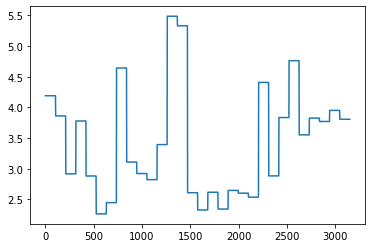

In [111]:
plt.plot(average_net_price)
plt.xlabel

In [112]:
data[['promo_week_id','category_id']].groupby(['promo_week_id','category_id']).count().query('promo_week_id == 201324')

Empty DataFrame
Columns: []
Index: [(201324, 101), (201324, 105), (201324, 125), (201324, 201), (201324, 202), (201324, 204), (201324, 210), (201324, 215), (201324, 310), (201324, 320), (201324, 325), (201324, 330), (201324, 335), (201324, 401), (201324, 405), (201324, 410), (201324, 501), (201324, 505), (201324, 510), (201324, 520), (201324, 525), (201324, 530), (201324, 535), (201324, 540), (201324, 545), (201324, 585), (201324, 601), (201324, 602), (201324, 603), (201324, 604), (201324, 605), (201324, 606), (201324, 701), (201324, 705), (201324, 710), (201324, 715), (201324, 720), (201324, 801), (201324, 805), (201324, 815), (201324, 901), (201324, 905), (201324, 910), (201324, 915), (201324, 1001), (201324, 1005), (201324, 1101), (201324, 1105), (201324, 1110), (201324, 1115), (201324, 1201), (201324, 1202), (201324, 1204), (201324, 1205), (201324, 1206), (201324, 1207), (201324, 1209), (201324, 1212), (201324, 1214), (201324, 1301), (201324, 1305), (201324, 1310), (201324, 1315), (201324, 1320), (201324, 1330), (201324, 1335), (201324, 1340), (201324, 1345), (201324, 1350), (201324, 1390), (201324, 1401), (201324, 1405), (201324, 1410), (201324, 1415), (201324, 1420), (201324, 1501), (201324, 1515), (201324, 1520), (201324, 1525), (201324, 1601), (201324, 1605), (201324, 1610), (201324, 1615), (201324, 1701), (201324, 1710), (201324, 1715), (201324, 1720), (201324, 1725), (201324, 1730), (201324, 1735), (201324, 1801), (201324, 1805), (201324, 1901), (201324, 1902), (201324, 1903), (201324, 1904), (201324, 1905), (201324, 1909), (201324, 1910), (201324, 1915), ...]

[618 rows x 0 columns]

In [113]:
temp2 = data[['promo_week_id','category_id']].groupby(['promo_week_id','category_id']).count().query('promo_week_id == 201324')

In [114]:
temp2.shape

(618, 0)

In [115]:
catg_105 = [105, 125, 201, 202, 204, 210, 215, 310, 320, 325, 330, 335, 401, 405, 410, 501, 505, 510, 520, 525, 530, 535, 540, 545, 585, 601, 602, 603, 604, 605, 606, 701, 705, 710, 715, 720, 801, 805, 815, 901, 905, 910, 915, 1001, 1005, 1101, 1105, 1110, 1115, 1201, 1202, 1204, 1205, 1206, 1207, 1209, 1212, 1214, 1301, 1305, 1310, 1315, 1320, 1330, 1335, 1340, 1345, 1350, 1390, 1401, 1405, 1410, 1415, 1420, 1501, 1515, 1520, 1525, 1601, 1605, 1610, 1615, 1701, 1710, 1715, 1720, 1725, 1730, 1735, 1801, 1805, 1901, 1902, 1903, 1904, 1905, 1909, 1910, 1915, 1920, 1995, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2101, 2105, 2110, 2120, 2125, 2130, 2135, 2140, 2145, 2155, 2160, 2170, 2175, 2180, 2185, 2201, 2205, 2210, 2215, 2220, 2225, 2285, 2301, 2305, 2401, 2405, 2410, 2415, 2420, 2425, 2430, 2485, 2501, 2505, 2510, 2515, 2520, 2525, 2530, 2535, 2625, 2630, 2632, 2633, 2635, 2640, 2705, 2707, 2720, 2730, 2820, 2835, 2840, 2845, 2905, 2915, 2920, 2925, 2940, 2950, 2955, 2965, 2970, 2975, 2977, 2980, 2985, 2990, 2995, 2999, 3001, 3002, 3003, 3004, 3101, 3105, 3110, 3115, 3120, 3125, 3201, 3202, 3204, 3206, 3207, 3209, 3210, 3290, 3295, 3299, 3301, 3305, 3310, 3315, 3401, 3405, 3415, 3425, 3430, 3435, 3601, 3605, 3610, 3615, 3620, 3625, 3630, 3635, 3645, 3701, 3705, 3710, 3715, 3720, 3725, 3801, 3815, 3825, 3835, 3845, 3890, 3901, 3905, 3910, 3915, 3920, 3925, 3930, 4001, 4005, 4201, 4205, 4301, 4310, 4320, 4401, 4405, 4490, 4501, 4505, 4510, 4601, 4605, 4607, 4610, 4615, 4617, 4620, 4685, 4701, 4705, 4710, 4715, 4730, 4735, 4801, 4802, 4804, 4805, 4810, 4820, 4901, 4902, 4905, 4910, 5001, 5005, 5010, 5012, 5015, 5020, 5025, 5030, 5035, 5101, 5103, 5105, 5110, 5115, 5120, 5201, 5203, 5205, 5210, 5215, 5220, 5225, 5240, 5250, 5301, 5305, 5310, 5315, 5320, 5325, 5335, 5340, 5345, 5350, 5355, 5360, 5399, 5401, 5405, 5410, 5415, 5420, 5425, 5430, 5501, 5505, 5510, 5515, 5601, 5605, 5610, 5615, 5620, 5625, 5630, 5701, 5702, 5705, 5710, 5715, 5718, 5725, 5750, 5760, 5801, 5805, 5835, 5840, 5850, 5901, 5910, 5915, 5920, 5925, 5935, 5940, 5942, 5950, 5985, 6001, 6005, 6010, 6040, 6042, 6045, 6050, 6101, 6110, 6115, 6130, 6135, 6201, 6205, 6210, 6301, 6305, 6310, 6315, 6401, 6405, 6410, 6420, 6425, 6430, 6435, 6505, 6511, 6515, 6520, 6530, 6540, 6545, 6801, 6820, 6890, 6910, 6911, 7001, 7005, 7015, 7025, 7030, 7101, 7103, 7105, 7110, 7125, 7201, 7205, 7210, 7220, 7235, 7250, 7255, 7260, 7265, 7301, 7305, 7310, 7315, 7320, 7325, 7330, 7340, 7345, 7350, 7401, 7402, 7405, 7410, 7415, 7416, 7420, 7425, 7430, 7440, 7445, 7470, 7501, 7520, 7555, 7560, 7580, 7585, 7601, 7605, 7620, 7625, 7630, 7701, 7715, 7720, 7730, 7801, 7810, 7907, 7930, 7940, 8102, 8104, 8105, 8107, 8108, 8112, 8114, 8116, 8202, 8203, 8204, 8205, 8210, 8211, 8231, 8235, 8247, 8402, 8403, 8404, 8405, 8406, 8407, 8408, 8409, 8410, 8411, 8412, 8413, 8414, 8415, 8416, 8417, 8418, 8419, 8420, 8421, 8423, 8424, 8426, 8429, 8431, 8435, 8438, 8441, 8442, 8443, 8445, 8449, 8450, 8457, 8465, 8466, 8468, 8469, 8470, 8471, 8472, 8473, 8474, 8475, 8478, 8479, 8480, 8481, 8483, 8484, 8485, 8498, 8501, 8502, 8505, 8510, 8515, 8520, 8525, 8550, 8560, 8562, 8565, 8570, 8572, 8575, 8608, 8615, 8625, 8630, 8640, 8643, 8645, 8655, 8690, 8692, 8693, 8801, 8808, 8809, 8810, 8815, 8825, 8829, 8830, 8833, 8840, 8843, 8846, 8850, 8853, 8855, 8856, 8857, 8858, 8859, 8863, 8865, 8866, 8880, 8901, 8903, 8905, 8910, 8915, 8925, 8930, 8940, 8945, 8955, 9005, 9020, 9095, 9401, 9405, 9410, 9501, 9510, 9515, 9601, 9605, 9610, 9701, 9705, 9710, 9715, 9905, 9907, 9908, 9913, 9923, 9940, 9941, 9942, 9944, 9945, 9948, 9965, 9982, 9990, 9991, 9992, 9993, 9994, 9995, 9996, 9997, 9998]

In [116]:
for i in range(0, len(data['category_id'].unique())):
    if catg_105[i] != data['category_id'].unique()[i]:
        print(data['category_id'].unique()[i])
        break

7315


# 11/10/21 - November 10, 2021

#### Take a product which has discounts in one category and doesn’t have a discount in the other categories

Picking Health and Milk Substitutes

In [117]:
# Taking all Health and Milk Substitutes with discounts > 0

milk_disc = data.query('(upc_id == 2113007570) and (discount > 0)')

# Talking all Health and Milk Substitutes

all_milk = data.query('upc_id == 2113007570')

In [261]:
# Defining a function to group the dataframe according to upc_id

def grp_upc_id(data_frm):
    data_frm = data_frm.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'original_weekly_revenue': 'sum',
                                   'net_weekly_revenue': 'sum', 'units': 'sum'})
    data_frm['average_units'] = data_frm['units'] / data_frm['promo_week_id']
    data_frm['average_original_price'] = data_frm['original_weekly_revenue'] / data_frm['units']
    data_frm['average_net_price'] = data_frm['net_weekly_revenue'] / data_frm['units']
    return data_frm

In [316]:
# $11.183111 is the average profit generated per week without discounts

def profit_per_week(data_frm):
    k = ((data_frm['average_net_price'].values[0])*data_frm['units'].values[0]/data_frm['promo_week_id'].values[0]) - 11.183111
    l = data_frm['units'].values[0]/data_frm['promo_week_id'].values[0]
    print("Increase in Profit per week due to discounts = ${}".format(round(k,6)))
    print("Items sold per week = {}".format(round(l,4)))

## Analysis of product without discount

In [120]:
data.query('(upc_id == 2113007570) and (discount == 0)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
323,1055,201246,3605,360515,2113007570,4,5,0.0,0.0,13.95,13.95,13.95,2.79,2.79,0.0,HEALTH AND MILK SUBSTITUTES
21231,1055,201205,3605,360515,2113007570,4,4,0.0,0.0,13.16,13.16,13.16,3.29,3.29,0.0,HEALTH AND MILK SUBSTITUTES
42871,1055,201147,3605,360515,2113007570,2,2,0.0,0.0,6.58,6.58,6.58,3.29,3.29,0.0,HEALTH AND MILK SUBSTITUTES
196832,1055,201209,3605,360515,2113007570,3,5,0.0,0.0,16.45,16.45,16.45,3.29,3.29,0.0,HEALTH AND MILK SUBSTITUTES
225644,1055,201224,3605,360515,2113007570,1,1,0.0,0.0,2.99,2.99,2.99,2.99,2.99,0.0,HEALTH AND MILK SUBSTITUTES
272462,1055,201305,3605,360515,2113007570,7,10,0.0,0.0,24.90,24.90,24.90,2.49,2.49,0.0,HEALTH AND MILK SUBSTITUTES
283250,1055,201311,3605,360515,2113007570,2,2,0.0,0.0,5.98,5.98,5.98,2.99,2.99,0.0,HEALTH AND MILK SUBSTITUTES
317274,1055,201225,3605,360515,2113007570,4,4,0.0,0.0,11.96,11.96,11.96,2.99,2.99,0.0,HEALTH AND MILK SUBSTITUTES
379682,1055,201317,3605,360515,2113007570,2,2,0.0,0.0,5.98,5.98,5.98,2.99,2.99,0.0,HEALTH AND MILK SUBSTITUTES
392496,1055,201236,3605,360515,2113007570,5,7,0.0,0.0,19.53,19.53,19.53,2.79,2.79,0.0,HEALTH AND MILK SUBSTITUTES


In [121]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount == 0)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,45,3605,503.24,503.24,176,3.911111,2.859318,2.859318


### Inference:    
For Health and Milk Substitutes, no discounts were offered for 45 weeks in 2 years with **176** items being sold for an average net price of **$2.859318**

In [122]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount == 0)')))


Incease in Profit per week due to discounts = $0.0
Items sold per week = 3.9111


## Analysis of product with discount between 20% to 30%

In [123]:
data.query('(upc_id == 2113007570) and (discount > 0.2) and (discount < 0.3)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
1154,1055,201221,3605,360515,2113007570,3,3,0.0,-3.00,8.97,8.97,11.97,2.99,3.990000,0.250627,HEALTH AND MILK SUBSTITUTES
157069,1055,201216,3605,360515,2113007570,3,3,0.0,-2.40,8.37,8.37,10.77,2.79,3.590000,0.222841,HEALTH AND MILK SUBSTITUTES
611041,1055,201217,3605,360515,2113007570,8,9,0.0,-7.42,25.11,25.11,32.53,2.79,3.614444,0.228097,HEALTH AND MILK SUBSTITUTES
836878,1055,201213,3605,360515,2113007570,1,1,0.0,-1.00,3.29,3.29,4.29,3.29,4.290000,0.233100,HEALTH AND MILK SUBSTITUTES


In [124]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.2) and (discount < 0.3)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,4,3605,59.56,45.74,16,4.0,3.7225,2.85875


### Inference:    
For Health and Milk Substitutes, discounts between 20% and 30% were offered for only 4 weeks in 2 years with **16** items being sold for an average net price of **$2.85875**

In [125]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.2) and (discount < 0.3)')))


Incease in Profit per week due to discounts = $0.251889
Items sold per week = 4.0


## Analysis of product with discount between 0 to 10%

In [126]:
data.query('(upc_id == 2113007570) and (discount > 0) and (discount < 0.1)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
43131,1055,201249,3605,360515,2113007570,3,4,0.0,-0.88,9.96,9.96,10.84,2.490000,2.710000,0.081181,HEALTH AND MILK SUBSTITUTES
72043,1055,201306,3605,360515,2113007570,4,5,0.0,-1.00,11.45,11.45,12.45,2.290000,2.490000,0.080321,HEALTH AND MILK SUBSTITUTES
419527,1055,201219,3605,360515,2113007570,4,4,0.0,-0.21,11.96,11.96,12.17,2.990000,3.042500,0.017256,HEALTH AND MILK SUBSTITUTES
472693,1055,201220,3605,360515,2113007570,4,4,0.0,-0.80,11.16,11.16,11.96,2.790000,2.990000,0.066890,HEALTH AND MILK SUBSTITUTES
618398,1055,201207,3605,360515,2113007570,5,5,0.0,-1.50,14.95,14.95,16.45,2.990000,3.290000,0.091185,HEALTH AND MILK SUBSTITUTES
871562,1055,201301,3605,360515,2113007570,4,4,0.0,-0.27,9.96,9.96,10.23,2.490000,2.557500,0.026393,HEALTH AND MILK SUBSTITUTES
875636,1055,201214,3605,360515,2113007570,1,1,0.0,-0.27,3.29,3.29,3.56,3.290000,3.560000,0.075843,HEALTH AND MILK SUBSTITUTES
984093,1055,201302,3605,360515,2113007570,5,6,0.0,-0.49,14.94,14.94,15.43,2.490000,2.571667,0.031756,HEALTH AND MILK SUBSTITUTES
992786,1055,201241,3605,360515,2113007570,4,4,0.0,-0.30,10.86,10.86,11.16,2.715000,2.790000,0.026882,HEALTH AND MILK SUBSTITUTES
1012108,1055,201240,3605,360515,2113007570,7,8,0.0,-0.33,22.32,22.32,22.65,2.790000,2.831250,0.014570,HEALTH AND MILK SUBSTITUTES


In [127]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0) and (discount < 0.1)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,14,3605,184.91,175.47,63,4.5,2.935079,2.785238


### Inference:    
For Health and Milk Substitutes, discounts less than 10% were offered for only 14 weeks in 2 years with **63** items being sold for an average net price of **$2.785238**

In [128]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0) and (discount < 0.1)')))


Incease in Profit per week due to discounts = $1.35046
Items sold per week = 4.5


## Analysis of product with discount between 10% to 20%

In [129]:
data.query('(upc_id == 2113007570) and (discount > 0.1) and (discount < 0.2)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
211761,1055,201206,3605,360515,2113007570,9,10,0.0,-4.63,29.00,29.00,33.63,2.90,3.3630,0.137675,HEALTH AND MILK SUBSTITUTES
275041,1055,201202,3605,360515,2113007570,10,10,0.0,-5.17,29.90,29.90,35.07,2.99,3.5070,0.147419,HEALTH AND MILK SUBSTITUTES
461290,1055,201228,3605,360515,2113007570,4,5,0.0,-1.50,13.45,13.45,14.95,2.69,2.9900,0.100334,HEALTH AND MILK SUBSTITUTES
467580,1055,201218,3605,360515,2113007570,3,3,0.0,-1.50,8.97,8.97,10.47,2.99,3.4900,0.143266,HEALTH AND MILK SUBSTITUTES
793885,1055,201150,3605,360515,2113007570,3,3,0.0,-1.62,8.97,8.97,10.59,2.99,3.5300,0.152975,HEALTH AND MILK SUBSTITUTES
876318,1055,201212,3605,360515,2113007570,4,4,0.0,-1.83,12.00,12.00,13.83,3.00,3.4575,0.132321,HEALTH AND MILK SUBSTITUTES
1107024,1055,201211,3605,360515,2113007570,2,2,0.0,-1.50,6.58,6.58,8.08,3.29,4.0400,0.185644,HEALTH AND MILK SUBSTITUTES
1164825,1055,201149,3605,360515,2113007570,1,1,0.0,-0.50,3.29,3.29,3.79,3.29,3.7900,0.131926,HEALTH AND MILK SUBSTITUTES
1222177,1055,201318,3605,360515,2113007570,4,5,0.0,-2.87,14.95,14.95,17.82,2.99,3.5640,0.161055,HEALTH AND MILK SUBSTITUTES
1441737,1055,201201,3605,360515,2113007570,6,6,0.0,-2.40,17.94,17.94,20.34,2.99,3.3900,0.117994,HEALTH AND MILK SUBSTITUTES


In [130]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.1) and (discount < 0.2)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,11,3605,180.53,155.81,53,4.818182,3.406226,2.939811


### Inference:    
For Health and Milk Substitutes, discounts between 10% and 20 were offered for only 11 weeks in 2 years with **53** items being sold for an average net price of **$2.939811**

In [131]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.1) and (discount < 0.2)')))


Incease in Profit per week due to discounts = $2.981434
Items sold per week = 4.8182


## Analysis of product with discount greater than 30%

In [132]:
data.query('(upc_id == 2113007570) and (discount > 0.3)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
1051664,1055,201319,3605,360515,2113007570,6,9,0.0,-10.11,21.91,21.91,32.02,2.434444,3.557778,0.315740,HEALTH AND MILK SUBSTITUTES
1651108,1055,201320,3605,360515,2113007570,1,1,0.0,-1.00,1.99,1.99,2.99,1.990000,2.990000,0.334448,HEALTH AND MILK SUBSTITUTES


In [133]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.3)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,2,3605,35.01,23.9,10,5.0,3.501,2.39


### Inference:    
For Health and Milk Substitutes, discounts greater than 30% were offered for only 2 weeks in 2 years with **10** items being sold for an average net price of **$2.39**

In [134]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0.3)')))


Incease in Profit per week due to discounts = $0.766889
Items sold per week = 5.0


# Defining a function to run this analysis

In [135]:
def analysis_1(data):
    a = grp_upc_id(data)
    print("Inference:\n")
    print("For the selected product, that particular discount was only offered for {} weeks in 2 years with {} items being sold for an average net price of ${}".format(a.iloc[0,0], a.iloc[0,4],round(a.iloc[0,7],2)))
    profit_per_week(a)

In [136]:
analysis_1(data.query('(upc_id == 2113007570) and (discount > 0.1) and (discount < 0.2)'))

Inference:

For the selected product, that particular discount was only offered for 11 weeks in 2 years with 53 items being sold for an average net price of $2.94

Incease in Profit per week due to discounts = $2.981434
Items sold per week = 4.8182


## Analysis of product with any discount

In [137]:
data.query('(upc_id == 2113007570) and (discount > 0)')

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
1154,1055,201221,3605,360515,2113007570,3,3,0.0,-3.00,8.97,8.97,11.97,2.990000,3.990000,0.250627,HEALTH AND MILK SUBSTITUTES
43131,1055,201249,3605,360515,2113007570,3,4,0.0,-0.88,9.96,9.96,10.84,2.490000,2.710000,0.081181,HEALTH AND MILK SUBSTITUTES
72043,1055,201306,3605,360515,2113007570,4,5,0.0,-1.00,11.45,11.45,12.45,2.290000,2.490000,0.080321,HEALTH AND MILK SUBSTITUTES
157069,1055,201216,3605,360515,2113007570,3,3,0.0,-2.40,8.37,8.37,10.77,2.790000,3.590000,0.222841,HEALTH AND MILK SUBSTITUTES
211761,1055,201206,3605,360515,2113007570,9,10,0.0,-4.63,29.00,29.00,33.63,2.900000,3.363000,0.137675,HEALTH AND MILK SUBSTITUTES
275041,1055,201202,3605,360515,2113007570,10,10,0.0,-5.17,29.90,29.90,35.07,2.990000,3.507000,0.147419,HEALTH AND MILK SUBSTITUTES
419527,1055,201219,3605,360515,2113007570,4,4,0.0,-0.21,11.96,11.96,12.17,2.990000,3.042500,0.017256,HEALTH AND MILK SUBSTITUTES
461290,1055,201228,3605,360515,2113007570,4,5,0.0,-1.50,13.45,13.45,14.95,2.690000,2.990000,0.100334,HEALTH AND MILK SUBSTITUTES
467580,1055,201218,3605,360515,2113007570,3,3,0.0,-1.50,8.97,8.97,10.47,2.990000,3.490000,0.143266,HEALTH AND MILK SUBSTITUTES
472693,1055,201220,3605,360515,2113007570,4,4,0.0,-0.80,11.16,11.16,11.96,2.790000,2.990000,0.066890,HEALTH AND MILK SUBSTITUTES


In [138]:
# Grouping with upc_id
grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0)'))

,promo_week_id,category_id,original_weekly_revenue,net_weekly_revenue,units,average_units,average_original_price,average_net_price
upc_id,,,,,,,,
2113007570,31,3605,460.01,400.92,142,4.580645,3.239507,2.82338


In [139]:
profit_per_week(grp_upc_id(data.query('(upc_id == 2113007570) and (discount > 0)')))


Incease in Profit per week due to discounts = $1.749792
Items sold per week = 4.5806


# 11/12/21 - November 12, 2021

**Taking Hold and Cold Cerial**

In [140]:
data.query("(class_id == 1101) or (category_id == 1105)")

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
25,1055,201322,1105,110501,3000001320,2,2,0.0,-1.98,6.00,6.00,7.98,3.000,3.990,0.248120,HOT CEREAL
199,1055,201310,1105,110501,3000031570,2,2,0.0,-0.78,4.13,4.13,4.91,2.065,2.455,0.158859,HOT CEREAL
948,1055,201309,1105,110501,3000026872,6,7,0.0,-11.97,15.96,15.96,27.93,2.280,3.990,0.428571,HOT CEREAL
1021,1055,201140,1105,110501,88392111840,3,3,0.0,-3.75,3.75,3.75,7.50,1.250,2.500,0.500000,HOT CEREAL
1643,1055,201137,1105,110501,3000001880,4,4,0.0,-2.40,12.76,12.76,15.16,3.190,3.790,0.158311,HOT CEREAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1748923,1055,201225,1105,110510,1313006025,4,4,0.0,0.00,17.16,17.16,17.16,4.290,4.290,0.000000,HOT CEREAL
1749670,1055,201249,1105,110501,3000001380,4,4,0.0,-2.00,15.96,15.96,17.96,3.990,4.490,0.111359,HOT CEREAL
1749716,1055,201303,1105,110501,3000031570,1,1,0.0,-1.13,1.49,1.49,2.62,1.490,2.620,0.431298,HOT CEREAL
1749979,1055,201226,1105,110501,3000001499,1,1,0.0,0.00,3.99,3.99,3.99,3.990,3.990,0.000000,HOT CEREAL


In [141]:
data.query("(category_id == 1101)")['class_id'].unique()

array([110110, 110105, 110101, 110100])

In [142]:
milk_class_id_grp = data.query("(class_id == 110110) or (class_id == 110105) or (class_id == 110101) or (class_id == 110100)")

In [143]:
data.query("(category_id == 1101) or (category_id == 1105)")

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
25,1055,201322,1105,110501,3000001320,2,2,0.0,-1.98,6.00,6.00,7.98,3.000000,3.990000,0.248120,HOT CEREAL
63,1055,201243,1101,110110,2113028378,12,12,0.0,-12.39,23.60,23.60,35.99,1.966667,2.999167,0.344262,COLD CEREAL
122,1055,201132,1101,110105,3000006083,11,11,0.0,-0.25,46.09,46.09,46.34,4.190000,4.212727,0.005395,COLD CEREAL
163,1055,201203,1101,110110,3000006301,26,32,0.0,-54.27,80.00,80.00,134.27,2.500000,4.195938,0.404186,COLD CEREAL
199,1055,201310,1105,110501,3000031570,2,2,0.0,-0.78,4.13,4.13,4.91,2.065000,2.455000,0.158859,HOT CEREAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1753723,1055,201141,1101,110110,1600027503,4,4,0.0,-0.78,19.96,19.96,20.74,4.990000,5.185000,0.037608,COLD CEREAL
1753732,1055,201222,1101,110110,1600027569,5,3,0.0,0.00,15.57,15.57,15.57,5.190000,5.190000,0.000000,COLD CEREAL
1753733,1055,201236,1101,110105,3000006083,22,26,0.0,-29.60,79.74,79.74,109.34,3.066923,4.205385,0.270715,COLD CEREAL
1753818,1055,201323,1101,110101,1600027522,1,1,0.0,-0.50,3.49,3.49,3.99,3.490000,3.990000,0.125313,COLD CEREAL


In [144]:
data["category"].unique()

array(['SPECIFIC PURPOSE CLEANERS', 'BABY ACCESSORIES', 'DOG FOOD WET',
       'SYRUP CARRIERS FROZEN BREAKFAST ITEMS',
       'MAIN MEAL COMMERCIAL FRESH BREAD', 'SALTY BAGGED/CANISTER SNACKS',
       'FROZEN POTATOES & ONIONS', 'ASIAN HEALTHY', 'PIE FILLING',
       'FROZEN MEAT', 'PIZZA FROZEN PREPARED FOODS', 'PLAIN RICE',
       'ARTICHOKE CANNED VEGETABLES', 'BODY WASH SKIN CARE',
       'PACKAGED ICE CREAM', 'REFRIGERATED ORANGE JUICE',
       'SALADS CONVENIENCE', 'NON-FRESH VEGETABLES',
       'GROCERY INGREDIENT CHEESE', 'TOYS/GAMES ETC.', 'FAMILY PLANNING',
       'CANNED/JAR FRUIT', 'NOVELTIES',
       'FROZEN DINNERS ENTREES & SIDES FOR ONE', 'SIGNATURE PROTEIN',
       'HOT CEREAL', 'FROZEN ORANGE JUICE', 'FROZEN PUNCH',
       'POPCORN-UNPOPPED', 'AT HOME CRACKERS',
       'EVERYDAY INDIVIDUAL SOCIAL EXPRESSION CARD', 'STARBUCKS COFFEE',
       'DRIED PRODUCE', 'FROZEN VEGETABLES STEAM', 'COOKING VEGETABLES',
       'POWDERED SUGAR', 'DEODORANT/A-P SOLID STICKS', 'SALT',

In [145]:
data

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,original_weekly_revenue,net_price,original_price,discount,category
0,1055,201250,7315,731520,1920083721,2,2,0.00,0.00,9.58,9.58,9.58,4.790000,4.790000,0.000000,SPECIFIC PURPOSE CLEANERS
1,1055,201237,6545,654545,7830005544,1,1,0.00,0.00,9.99,9.99,9.99,9.990000,9.990000,0.000000,BABY ACCESSORIES
2,1055,201240,3201,320101,2310027218,4,4,0.00,-8.00,27.96,27.96,35.96,6.990000,8.990000,0.222469,DOG FOOD WET
3,1055,201127,4501,450101,7989370089,9,11,0.00,-7.98,27.97,27.97,35.95,2.542727,3.268182,0.221975,SYRUP CARRIERS FROZEN BREAKFAST ITEMS
4,1055,201242,9601,960105,7294511228,4,7,0.00,0.00,25.13,25.13,25.13,3.590000,3.590000,0.000000,MAIN MEAL COMMERCIAL FRESH BREAD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1754006,1055,201229,8801,880102,20121400000,25,35,42.28,-170.58,336.98,336.98,507.56,9.628000,14.501714,0.336078,"BEEF, NO GRADE AND/OR MANUFACT BRAND DECLARED"
1754007,1055,201303,1110,111010,84667500261,1,1,0.00,-0.49,3.50,3.50,3.99,3.500000,3.990000,0.122807,CONVENIENT WHOLESOME FOODS
1754008,1055,201204,3202,320220,2113041206,3,3,0.00,-21.00,56.97,56.97,77.97,18.990000,25.990000,0.269334,DOG FOOD DRY
1754009,1055,201220,901,90130,4655500019,1,1,0.00,0.00,2.99,2.99,2.99,2.990000,2.990000,0.000000,SALTY BAGGED/CANISTER SNACKS


# 11/12/21 - November 18, 2021

In [146]:
data2 = pd.read_csv('POS.txt', delimiter='|')

In [147]:
milk_cer = data2.query("(category_id == 1101) or (category_id == 1105)")

In [148]:
milk_cer.category_id.nunique()

2

## Grouping with upc_id

In [238]:
''' Read milk_cer and remove units <= 0 (which means product return records)'''

milk_cer = data2.query("(category_id == 120)")
milk_cer = milk_cer[milk_cer['units'] > 0]
milk_cer = milk_cer[milk_cer['net_amt'] > 0]
milk_cer['net_weekly_revenue'] = milk_cer['net_amt']
milk_cer['net_price'] = milk_cer['net_weekly_revenue'] / milk_cer['units']
#milk_cer.drop(columns=['category_id']) # dropping category_id to try and get more clusters

'''Find all products with 105 weeks milk_cer'''
# Group by upc_id, select the products with all 105 weeks milk_cer, calculate average price and average unit
df_grp = milk_cer.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                       'units': 'sum'})
df_grp = df_grp.sort_values(by=['promo_week_id', 'category_id'], ascending=False)
df_grp['average_net_price'] = df_grp['net_weekly_revenue'] / df_grp['units']
df_grp['average_units'] = df_grp['units'] / df_grp['promo_week_id']
#df_grp = df_grp[df_grp['promo_week_id'] == 105]

In [227]:
df_grp = df_grp.rename(columns = {'upc_id':'upc_id_val'})

df1 = milk_cer[['upc_id','class_id']]

df_grp = df_grp.merge(df1[["upc_id","class_id"]], 
                                                   left_on='upc_id', right_on='upc_id',
                                                   suffixes=('_left', '_right'))

In [228]:
df_grp = df_grp.set_index('upc_id')

In [235]:
milk_cer

,store_id,promo_week_id,category_id,class_id,upc_id,txn_cnt,units,meas_qty,mkdn_amt,net_amt,net_weekly_revenue,net_price
559,1055,201140,120,12020,1130029070,1,1,0.0,-1.00,7.49,7.49,7.49
633,1055,201141,120,12015,4126959007,2,2,0.0,-2.80,15.98,15.98,7.99
4363,1055,201240,120,12015,3400009256,14,15,0.0,-37.35,37.50,37.50,2.50
7956,1055,201136,120,12015,3400004261,1,1,0.0,-1.60,4.99,4.99,4.99
8884,1055,201141,120,12020,7097044057,1,1,0.0,-2.00,6.99,6.99,6.99
...,...,...,...,...,...,...,...,...,...,...,...,...
1755623,1055,201245,120,12015,3400007610,1,1,0.0,-2.50,2.49,2.49,2.49
1756147,1055,201141,120,12015,3400007035,1,1,0.0,-1.60,4.99,4.99,4.99
1758230,1055,201243,120,12020,4000034777,2,2,0.0,-2.00,19.98,19.98,9.99
1759163,1055,201244,120,12020,7172001858,18,20,0.0,0.00,159.80,159.80,7.99


In [240]:
df_grp

,promo_week_id,category_id,net_weekly_revenue,units,average_net_price,average_units
upc_id,,,,,,
7172001858,33,120,1135.34,166,6.839398,5.030303
2113055774,32,120,529.59,355,1.491803,11.093750
2113055777,27,120,200.20,125,1.601600,4.629630
1130017070,22,120,1495.88,497,3.009819,22.590909
3400023241,22,120,1085.39,111,9.778288,5.045455
...,...,...,...,...,...,...
7097044389,3,120,36.95,5,7.390000,1.666667
1130017076,2,120,57.44,24,2.393333,12.000000
3400020239,2,120,28.46,4,7.115000,2.000000


In [153]:
#df_grp = pd.merge(df_grp, milk_cer[['upc_id','class_id']], on="upc_id", how="left")

# print(df_grp)
product = list(df_grp.index)
df_grp['upc_id'] = product
average_net_price = df_grp['average_net_price'].tolist()
average_unit = df_grp['average_units'].tolist()

'''Define a function to return each product's weekly net price and unit'''
def individual_result(milk_cerset, item):
    result = milk_cerset[milk_cerset['upc_id'] == item].sort_values(by='promo_week_id')
    npr = result['net_price'].tolist()
    un = result['units'].tolist()
    return npr, un

''' For each product, return 105 weeks (net_price_ratio, unit_ratio) and then combine all milk_cer into a matrix'''
pu_matrix = []
for i in range(0, len(df_grp)):
    upc_id = product[i]
    net_price, unit = individual_result(milk_cer, upc_id)
    net_price_ratio = []
    for p in net_price:
        net_price_ratio.append(p / average_net_price[i])
    unit_ratio = []
    for u in unit:
        unit_ratio.append(u / average_unit[i])
    price_unit = list(zip(net_price_ratio, unit_ratio))
    pu_matrix.append(price_unit)

In [154]:
pu_matrix

[[(1.023941964570458, 0.29535864978902954),
  (1.023941964570458, 0.8860759493670887),
  (1.023941964570458, 0.8860759493670887),
  (1.023941964570458, 0.5907172995780591),
  (1.023941964570458, 0.5907172995780591),
  (1.023941964570458, 0.7383966244725738),
  (1.023941964570458, 0.44303797468354433),
  (1.023941964570458, 1.1814345991561181),
  (1.023941964570458, 1.1814345991561181),
  (1.023941964570458, 1.0337552742616034),
  (1.023941964570458, 0.7383966244725738),
  (1.023941964570458, 0.7383966244725738),
  (1.023941964570458, 1.0337552742616034),
  (1.023941964570458, 0.8860759493670887),
  (1.023941964570458, 1.4767932489451476),
  (0.9523376313837127, 0.44303797468354433),
  (0.9523376313837126, 1.4767932489451476),
  (1.023941964570458, 1.0337552742616034),
  (1.023941964570458, 0.7383966244725738),
  (0.9801837609563357, 0.8860759493670887),
  (0.9523376313837127, 2.2151898734177213),
  (1.023941964570458, 1.0337552742616034),
  (1.023941964570458, 1.4767932489451476),
  (1

In [155]:
milk_cer['upc_id'].index

Int64Index([     25,      63,     124,     165,     201,     280,     351,
                354,     360,     367,
            ...
            1763795, 1763824, 1763883, 1764158, 1764185, 1764261, 1764270,
            1764271, 1764356, 1764491],
           dtype='int64', length=25459)

In [156]:
df_grp.index

Int64Index([ 1313000612,  1313000612,  1313000612,  1313000612,  1313000612,
             1313000612,  1313000612,  1313000612,  1313000612,  1313000612,
            ...
            88491218005, 88491218005, 88491218005, 88491218005, 88491218005,
            88491218005, 88491218005, 88491218005, 88491218005, 88491218005],
           dtype='int64', name='upc_id', length=3150)

In [157]:
nsamples

3150

In [158]:
'''Kmeans clustering on all products' 105 week milk_cer'''
cl = []
X = np.asarray(pu_matrix) 
nsamples, nx, ny = X.shape  # nsamples=1887, nx=105, ny=2

#X.shape(nsamples*nx, -1)
X = X.reshape((nsamples, nx*ny))
#X.shape = [nsamples, 1]
km = KMeans(n_clusters=10,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=0).fit(X)
centroid = km.cluster_centers_
product_cluster = km.labels_
cl = product_cluster

In [159]:
X.shape

(3150, 210)

In [160]:
km.labels_

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [161]:
cl

array([1, 1, 1, ..., 1, 1, 1], dtype=int32)

In [162]:
df_grp['class_id']

upc_id
1313000612     110510
1313000612     110510
1313000612     110510
1313000612     110510
1313000612     110510
                ...  
88491218005    110105
88491218005    110105
88491218005    110105
88491218005    110105
88491218005    110105
Name: class_id, Length: 3150, dtype: int64

In [163]:
df_grp[["class_id", "cluster"]].groupby(["class_id","cluster"]).count()

KeyError: "['cluster'] not in index"

In [ ]:
df_centroid

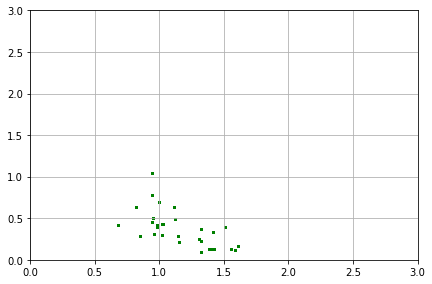

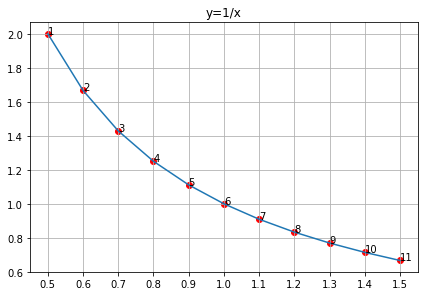

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


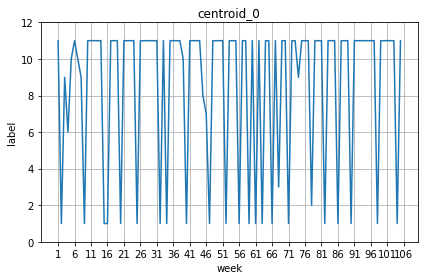

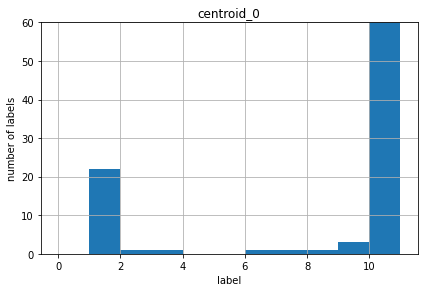

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


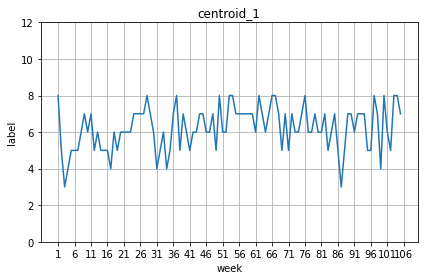

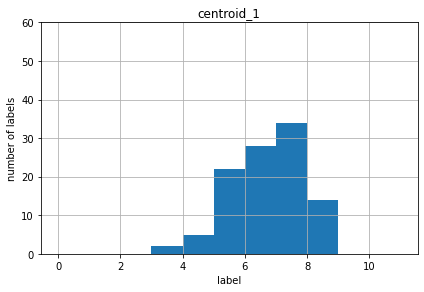

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


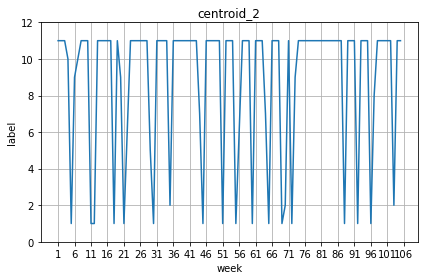

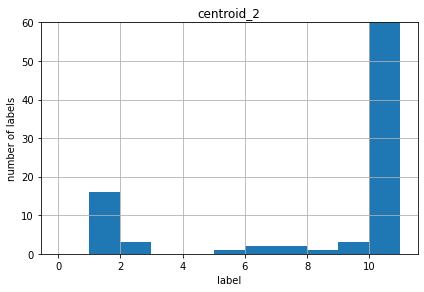

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


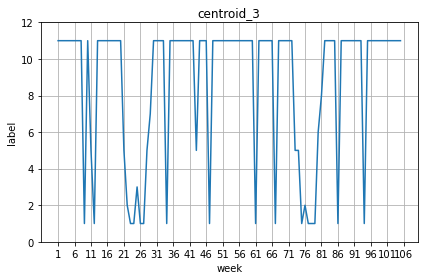

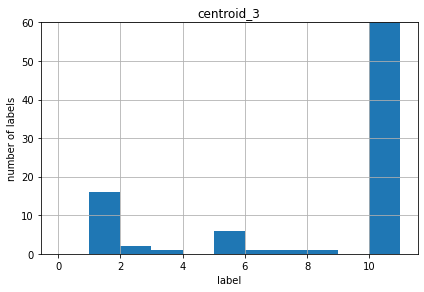

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


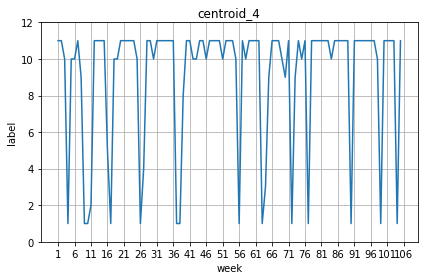

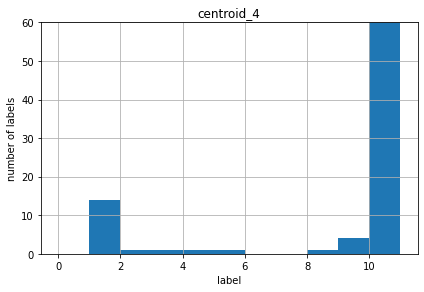

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


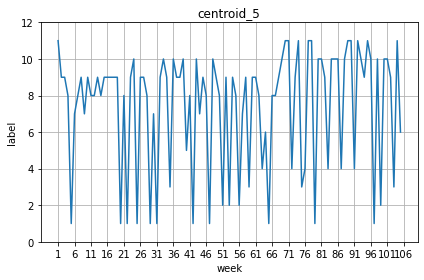

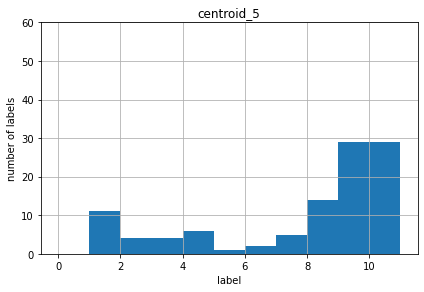

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


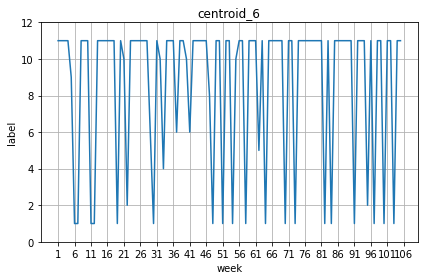

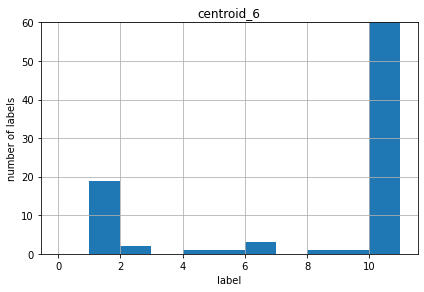

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


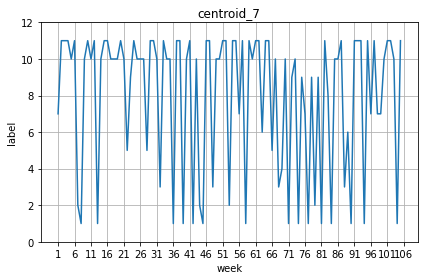

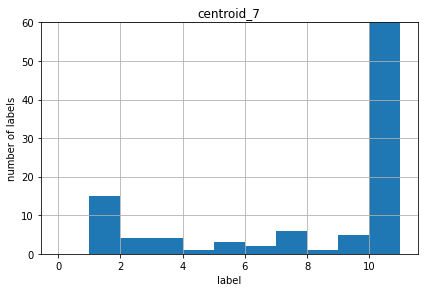

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


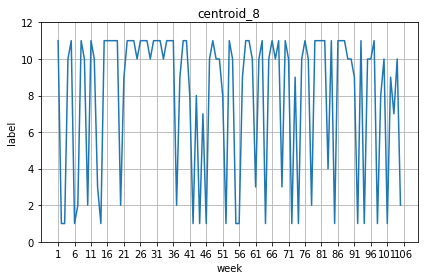

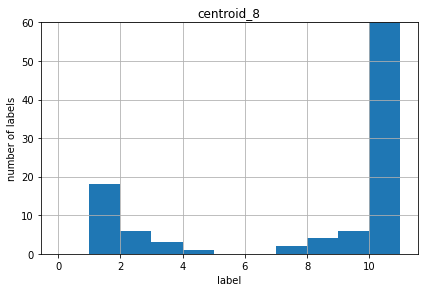

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


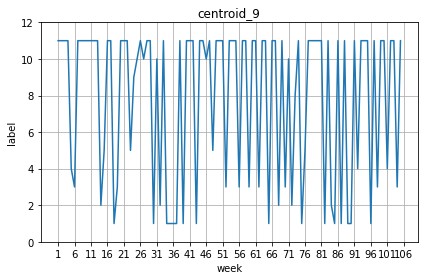

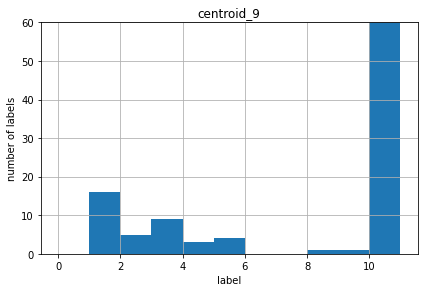

<Figure size 432x288 with 0 Axes>

In [173]:
plt.scatter(X[:, 0], X[:, 1], c='green', marker='o', s=1)
plt.grid()
plt.tight_layout()
plt.xlim(0, 3)
plt.ylim(0, 3)
plt.show()
plt.clf()


''' Define a function to calculate the shortest euclidean distance and return the corresponding index'''
def shortest_distance(target_list, cluster_list):
    shortest_index = []
    for m in range(0, len(target_list)):
        dst_list = []
        for n in range(0, len(cluster_list)):
            dst = distance.euclidean(target_list[m], cluster_list[n])
            dst_list.append(dst)
        shortest_index.append(np.argsort(dst_list)[0])
    return shortest_index

''' Define y=1/x curve and artificially pick 11 points as labels'''
def f(a):
    return 1/a
x = np.array([0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
y = f(x)
curve_labels = list(zip(x, y))

# Plotting curve labels

plt.plot(x, y)
plt.scatter(x, y, color="r")
z = range(1, 12, 1)
for x, y, z in zip(x, y, z):
    plt.annotate(z, (x, y))
plt.xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
plt.tight_layout()
plt.grid()
plt.title("y=1/x")
plt.show()
plt.clf()

'''Assign labels to centroids by shortest distance'''
weeks = range(1, 106)
df_centroid = pd.DataFrame({'Week': weeks})
for i in range(0, len(centroid)):
    centroid_pair = list(grouper(centroid[i], 2))
    pre_index = shortest_distance(centroid_pair, curve_labels)
    assign_label = [x + 1 for x in pre_index]
    df_centroid['centroid_' + str(i)] = assign_label

    '''Trajectory of each centroid'''
    sns.lineplot(weeks, assign_label)
    plt.xlabel('week')
    plt.ylabel('label')
    plt.xticks(range(1, 107, 5))
    plt.ylim(0, 12)
    plt.title("centroid_" + str(i))
    plt.grid()
    plt.tight_layout()
    plt.show()
    # plt.savefig("centroid_" + str(i) + "_trajectory.png", dpi=300)
    plt.clf()

    sns.lineplot(data=df_centroid, x=weeks, y=assign_label)
    
    
    '''Histogram of each centroid'''
    plt.hist(assign_label, bins=range(0, 12))
    plt.xlabel("label")
    plt.ylabel("number of labels")
    plt.ylim(0, 60, 10)
    plt.grid()
    plt.tight_layout()
    plt.title("centroid_" + str(i))
    plt.show()
    # plt.savefig("centroid_" + str(i) + "_histogram.png", dpi=300)
    plt.clf()

# df_grp.to_excel('1887 products.xlsx', index=False)
# df_centroid.to_excel('centroid_label.xlsx', index=False)

In [177]:
df_centroid

,Week,centroid_0,centroid_1,centroid_2,centroid_3,centroid_4,centroid_5,centroid_6,centroid_7,centroid_8,centroid_9
0,1,11,8,11,11,11,11,11,7,11,11
1,2,1,5,11,11,11,9,11,11,1,11
2,3,9,3,11,11,10,9,11,11,1,11
3,4,6,4,10,11,1,8,11,11,10,11
4,5,10,5,1,11,10,1,9,10,11,4
...,...,...,...,...,...,...,...,...,...,...,...
100,101,11,6,11,11,11,10,11,11,1,4
101,102,11,5,11,11,11,9,11,11,9,11
102,103,11,8,2,11,11,3,1,10,7,11
103,104,1,8,11,11,1,11,11,1,10,3


In [176]:
len(assign_label)

105

In [ ]:
centroid[0]

In [ ]:
centroid_pair = list(grouper(centroid[0], 2))
pre_index = shortest_distance(centroid_pair, curve_labels)
assign_label = [x + 1 for x in pre_index]
df_centroid['centroid_' + str(i)] = assign_label



In [ ]:
centroid_pair

In [ ]:
centroid_pair = list(grouper(centroid[0], 2))

In [ ]:
pre_index = shortest_distance(centroid_pair, curve_labels)
pre_index

# Grouping with class_id

In [ ]:
milk_class_id_grp

In [ ]:
milk_class_id_grp = milk_class_id_grp[milk_class_id_grp['units'] > 0]
milk_class_id_grp = milk_class_id_grp[milk_class_id_grp['net_amt'] > 0]
milk_class_id_grp['net_weekly_revenue'] = milk_class_id_grp['net_amt']
milk_class_id_grp['net_price'] = milk_class_id_grp['net_weekly_revenue'] / milk_class_id_grp['units']
#milk_cer.drop(columns=['category_id']) # dropping category_id to try and get more clusters

'''Find all products with 105 weeks milk_cer'''
# Group by classs_id, select the products with all 105 weeks milk_cer, calculate average price and average unit
df_class = milk_class_id_grp.groupby(['class_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                       'units': 'sum', 'upc_id': 'max'})

In [ ]:
df_class

In [ ]:
df_class = df_class.sort_values(by=['promo_week_id', 'category_id'], ascending=False)

In [ ]:
df_class['average_net_price'] = df_class['net_weekly_revenue'] / df_class['units']

In [ ]:
df_class['average_units'] = df_class['units'] / df_class['promo_week_id']

In [ ]:
df_class

In [ ]:
''' Read milk_cer and remove units <= 0 (which means product return records)'''

milk_cer = data2.query("(category_id == 1101) or (category_id == 1105)")
milk_cer = milk_cer[milk_cer['units'] > 0]
milk_cer = milk_cer[milk_cer['net_amt'] > 0]
milk_cer['net_weekly_revenue'] = milk_cer['net_amt']
milk_cer['net_price'] = milk_cer['net_weekly_revenue'] / milk_cer['units']
#milk_cer.drop(columns=['category_id']) # dropping category_id to try and get more clusters

'''Find all products with 105 weeks milk_cer'''
# Group by upc_id, select the products with all 105 weeks milk_cer, calculate average price and average unit
df_grp = milk_cer.groupby(['class_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                       'units': 'sum'})
df_grp = df_grp.sort_values(by=['promo_week_id', 'category_id'], ascending=False)
df_grp['average_net_price'] = df_grp['net_weekly_revenue'] / df_grp['units']
df_grp['average_units'] = df_grp['units'] / df_grp['promo_week_id']
df_grp = df_grp[df_grp['promo_week_id'] == 105]

# print(df_grp)
product = df_grp.index.tolist()
df_grp['upc_id'] = product
average_net_price = df_grp['average_net_price'].tolist()
average_unit = df_grp['average_units'].tolist()

'''Define a function to return each product's weekly net price and unit'''
def individual_result(milk_cerset, item):
    result = milk_cerset[milk_cerset['upc_id'] == item].sort_values(by='promo_week_id')
    npr = result['net_price'].tolist()
    un = result['units'].tolist()
    return npr, un

''' For each product, return 105 weeks (net_price_ratio, unit_ratio) and then combine all milk_cer into a matrix'''
pu_matrix = []
for i in range(0, len(df_grp)):
    upc_id = product[i]
    net_price, unit = individual_result(milk_cer, upc_id)
    net_price_ratio = []
    for p in net_price:
        net_price_ratio.append(p / average_net_price[i])
    unit_ratio = []
    for u in unit:
        unit_ratio.append(u / average_unit[i])
    price_unit = list(zip(net_price_ratio, unit_ratio))
    pu_matrix.append(price_unit)

'''Kmeans clustering on all products' 105 week milk_cer'''
X = np.asarray(pu_matrix)
nsamples, nx, ny = X.shape  # nsamples=1887, nx=105, ny=2
X = X.reshape((nsamples, nx*ny))

km = KMeans(n_clusters=10,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=0).fit(X)
centroid = km.cluster_centers_
product_cluster = km.labels_
df_grp['cluster'] = product_cluster

In [212]:
nsamples

3150

In [ ]:
df_grp

# Performing analysis on different items

In [250]:
def analysis_2(df):

    combo = df
    combo = combo[combo['units'] > 0]
    combo = combo[combo['net_amt'] > 0]
    combo['net_weekly_revenue'] = combo['net_amt']
    combo['net_price'] = combo['net_weekly_revenue'] / combo['units']
    #combo.drop(columns=['category_id']) # dropping category_id to try and get more clusters

    '''Find all products with 105 weeks combo'''
    # Group by upc_id, select the products with all 105 weeks combo, calculate average price and average unit
    df_grp = combo.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                           'units': 'sum'})
    df_grp = df_grp.sort_values(by=['promo_week_id', 'category_id'], ascending=False)
    df_grp['average_net_price'] = df_grp['net_weekly_revenue'] / df_grp['units']
    df_grp['average_units'] = df_grp['units'] / df_grp['promo_week_id']
    df_grp = df_grp[df_grp['promo_week_id'] == 105]
    
    df_grp = df_grp.rename(columns = {'upc_id':'upc_id_val'})

    df1 = combo[['upc_id','class_id']]

    df_grp = df_grp.merge(df1[["upc_id","class_id"]], 
                                                       left_on='upc_id', right_on='upc_id',
                                                       suffixes=('_left', '_right'))
    df_grp = df_grp.set_index('upc_id')
    #df_grp = pd.merge(df_grp, combo[['upc_id','class_id']], on="upc_id", how="left")

    # print(df_grp)
    product = list(df_grp.index)
    df_grp['upc_id'] = product
    average_net_price = df_grp['average_net_price'].tolist()
    average_unit = df_grp['average_units'].tolist()

    '''Define a function to return each product's weekly net price and unit'''
    def individual_result(comboset, item):
        result = comboset[comboset['upc_id'] == item].sort_values(by='promo_week_id')
        npr = result['net_price'].tolist()
        un = result['units'].tolist()
        return npr, un

    ''' For each product, return 105 weeks (net_price_ratio, unit_ratio) and then combine all combo into a matrix'''
    pu_matrix = []
    for i in range(0, len(df_grp)):
        upc_id = product[i]
        net_price, unit = individual_result(combo, upc_id)
        net_price_ratio = []
        for p in net_price:
            net_price_ratio.append(p / average_net_price[i])
        unit_ratio = []
        for u in unit:
            unit_ratio.append(u / average_unit[i])
        price_unit = list(zip(net_price_ratio, unit_ratio))
        pu_matrix.append(price_unit)
        
    '''Kmeans clustering on all products' 105 week combo'''
    cl = []
    X = np.asarray(pu_matrix)
    
    nsamples, nx, ny = X.shape  # nsamples=1887, nx=105, ny=2

    #X = X.shape(nsamples*nx, -1)
    X = X.reshape((nsamples, nx*ny))
    
    #X.shape = [nsamples, 1]
    km = KMeans(n_clusters=10,
                init='k-means++',
                n_init=10,
                max_iter=300,
                random_state=0).fit(X)
    centroid = km.cluster_centers_
    product_cluster = km.labels_
    cl = product_cluster
    print("CL = {}".format(cl))
    
    # Plotting
    
    plt.scatter(X[:, 0], X[:, 1], c='green', marker='o', s=1)
    plt.grid()
    plt.tight_layout()
    plt.xlim(0, 3)
    plt.ylim(0, 3)
    plt.show()
    plt.clf()
    
    x = np.array([0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
    y = f(x)
    curve_labels = list(zip(x, y))
    
    # Plotting curve labels

    plt.plot(x, y)
    plt.scatter(x, y, color="r")
    z = range(1, 12, 1)
    for x, y, z in zip(x, y, z):
        plt.annotate(z, (x, y))
    plt.xticks([0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
    plt.tight_layout()
    plt.grid()
    plt.title("y=1/x")
    plt.show()
    plt.clf()
    
    '''Assign labels to centroids by shortest distance'''
    weeks = range(1, 106)
    df_centroid = pd.DataFrame({'Week': weeks})
    for i in range(0, len(centroid)):
        centroid_pair = list(grouper(centroid[i], 2))
        pre_index = shortest_distance(centroid_pair, curve_labels)
        assign_label = [x + 1 for x in pre_index]
        df_centroid['centroid_' + str(i)] = assign_label

        '''Trajectory of each centroid'''
        sns.lineplot(weeks, assign_label, color='red')
        plt.xlabel('week')
        plt.ylabel('label')
        plt.xticks(range(1, 107, 5))
        plt.ylim(0, 12)
        plt.title("centroid_" + str(i))
        plt.grid()
        plt.tight_layout()
        plt.show()
        # plt.savefig("centroid_" + str(i) + "_trajectory.png", dpi=300)
        plt.clf()

        # sns.lineplot(data=df_centroid, x=weeks, y=assign_label)


        '''Histogram of each centroid'''
        plt.hist(assign_label, bins=range(0, 12))
        plt.xlabel("label")
        plt.ylabel("number of labels")
        plt.ylim(0, 60, 10)
        plt.grid()
        plt.tight_layout()
        plt.title("centroid_" + str(i))
        plt.show()
        # plt.savefig("centroid_" + str(i) + "_histogram.png", dpi=300)
        plt.clf()

CL = [1 1 1 ... 1 1 1]


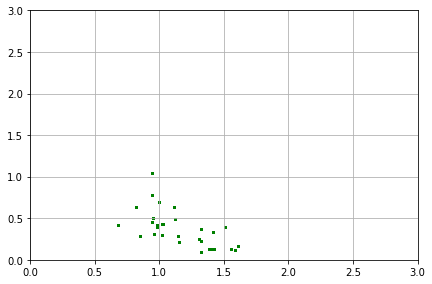

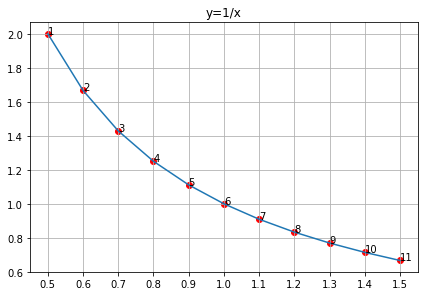

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


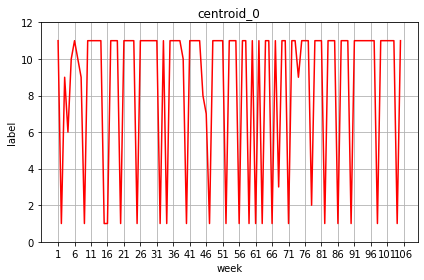

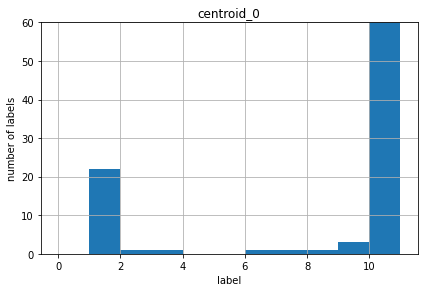

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


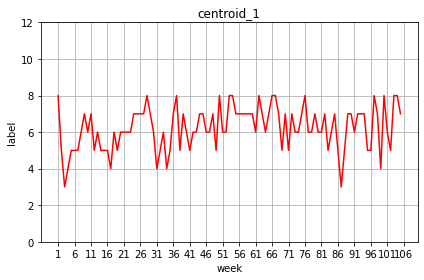

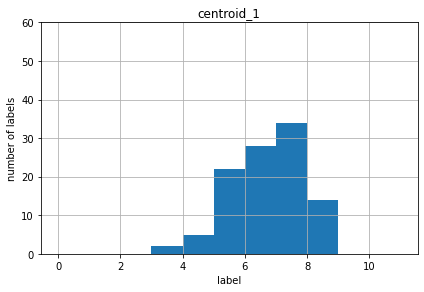

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


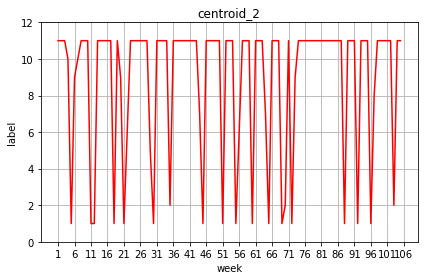

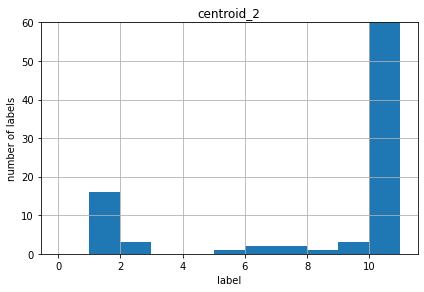

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


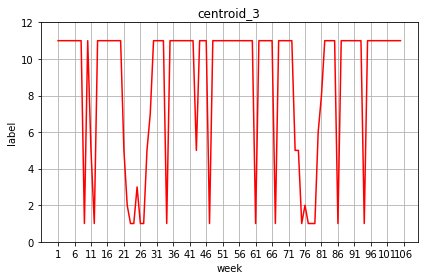

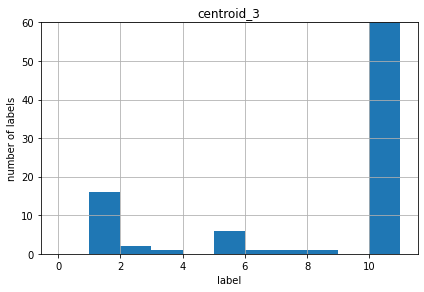

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


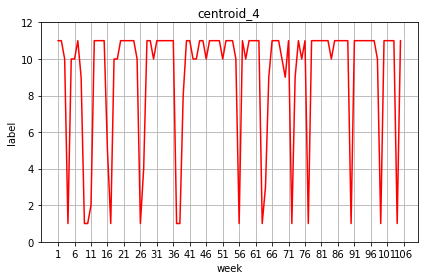

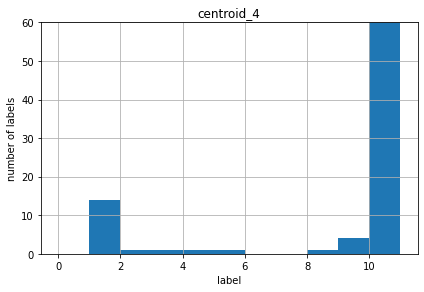

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


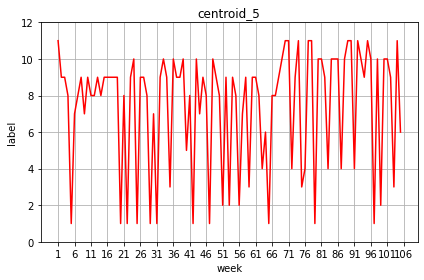

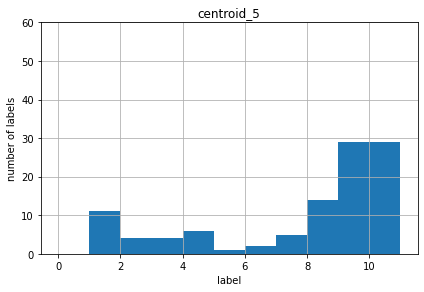

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


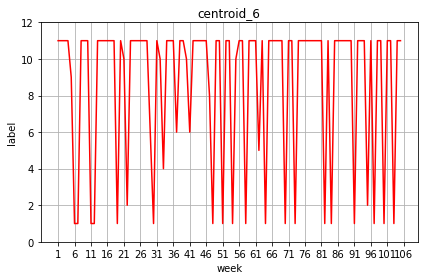

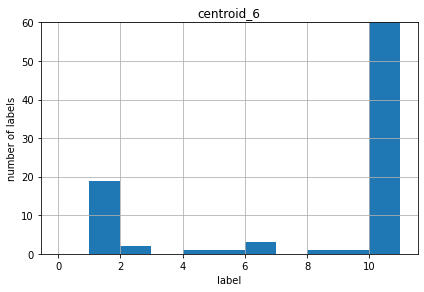

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


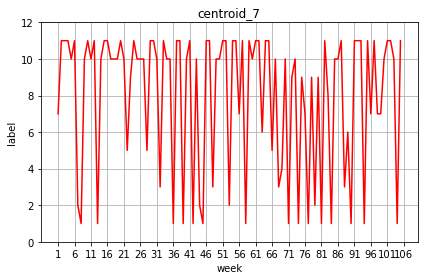

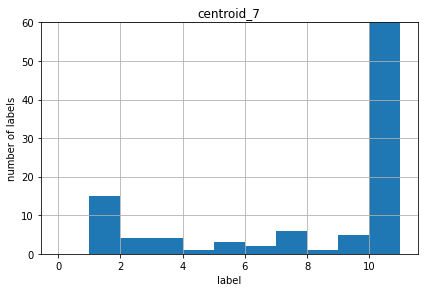

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


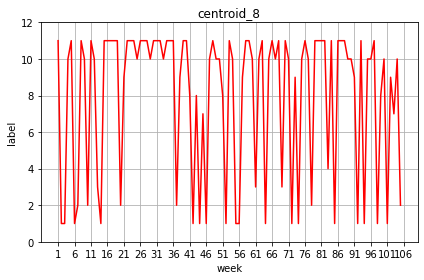

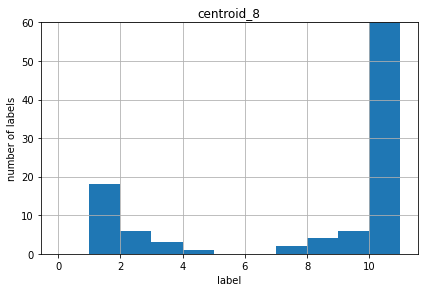

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


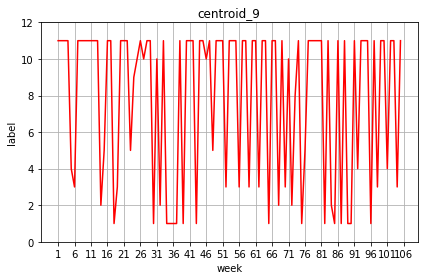

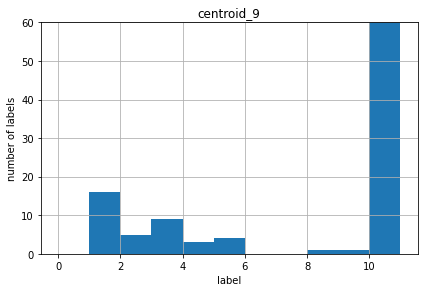

<Figure size 432x288 with 0 Axes>

In [197]:
analysis_2(data2.query("(category_id == 1101) or (category_id == 1105)")) # Milk and Cereal

In [268]:
profit_per_week(grp_upc_id(data.query("(category_id == 1101) or (category_id == 1105)")))


Incease in Profit per week due to discounts = $17.187079
Items sold per week = 6.7714


CL = [7 7 7 ... 1 1 1]


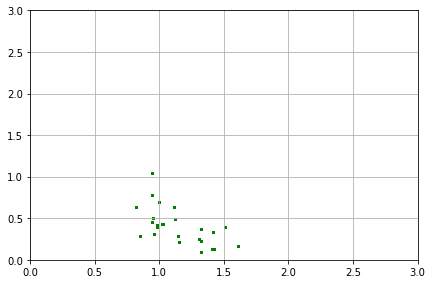

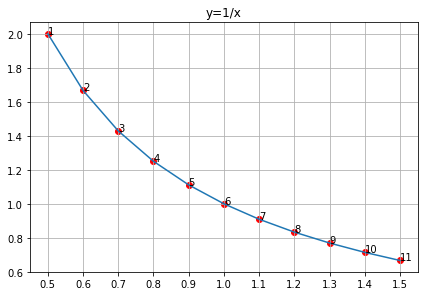

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


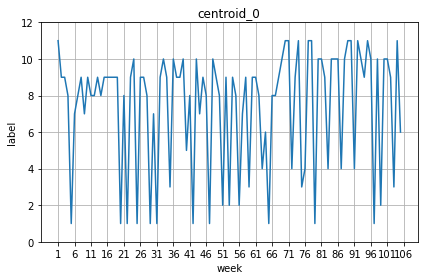

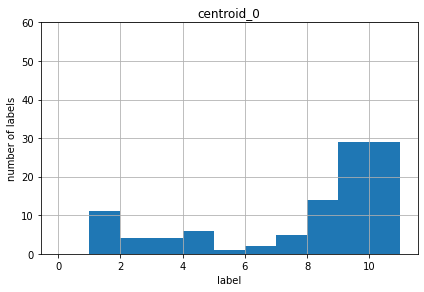

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


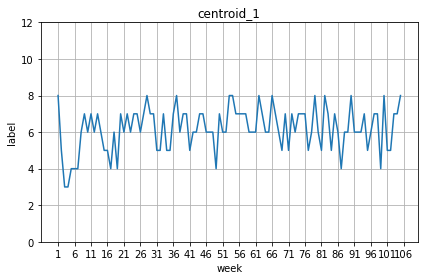

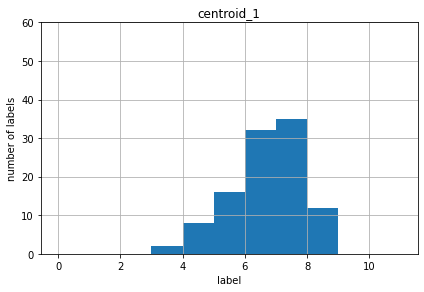

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


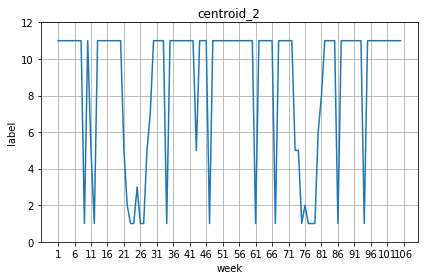

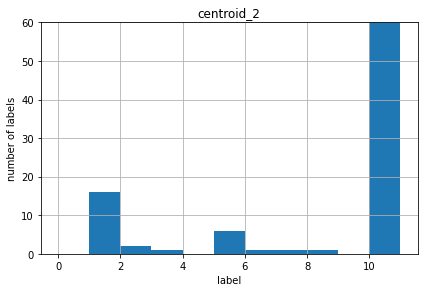

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


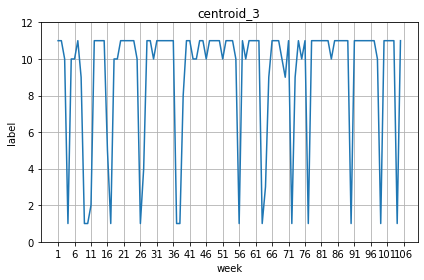

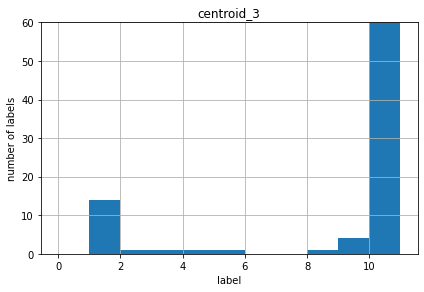

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


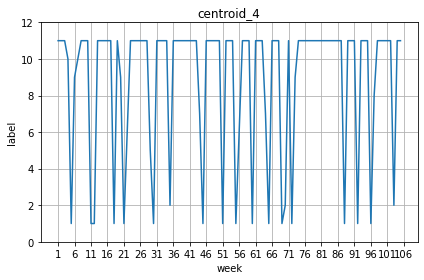

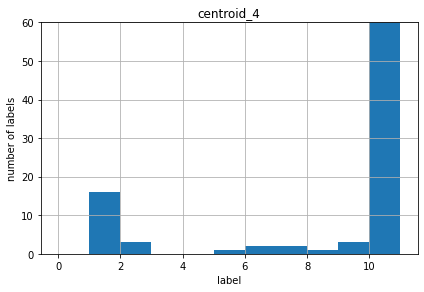

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


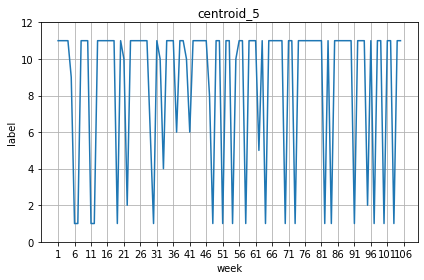

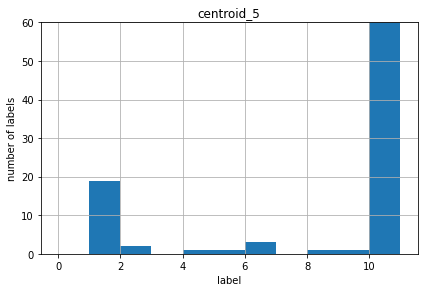

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


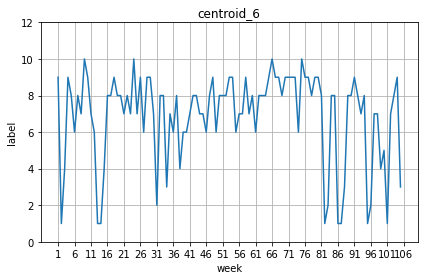

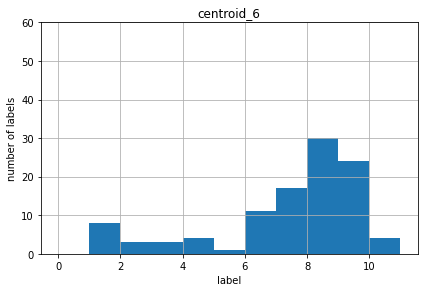

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


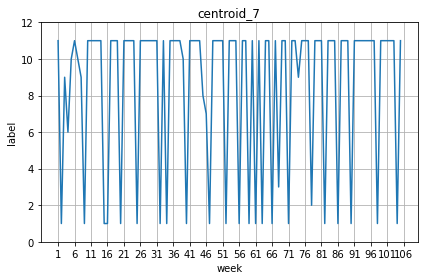

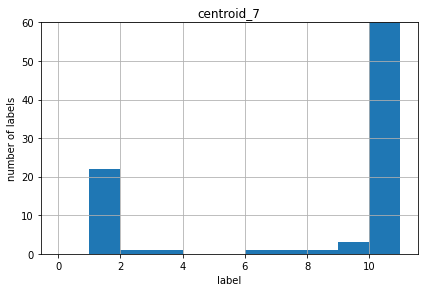

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


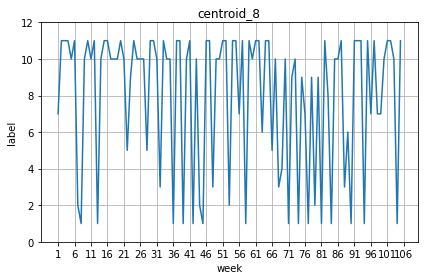

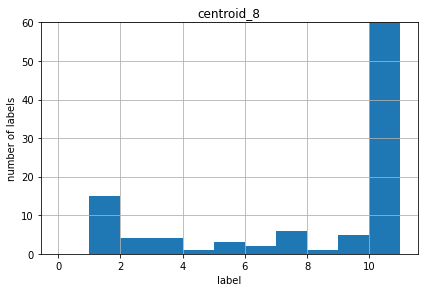

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


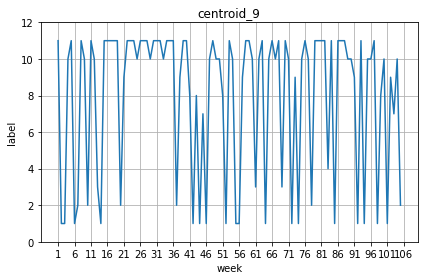

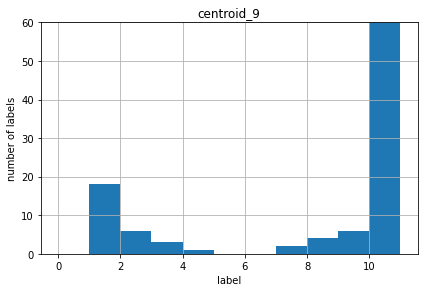

<Figure size 432x288 with 0 Axes>

In [180]:
analysis_2(data2.query("category_id == 1101")) # Just Milk

CL = [3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5

<ipython-input-178-7d827cb99a15>:64: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


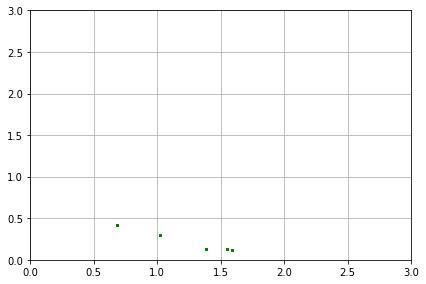

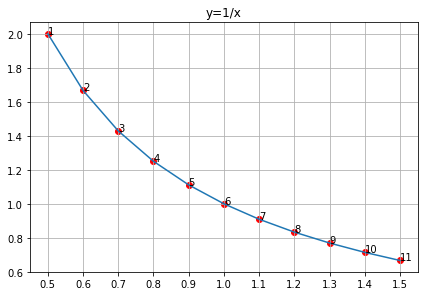

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


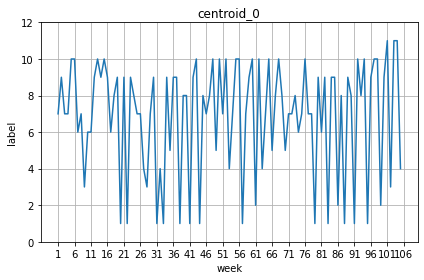

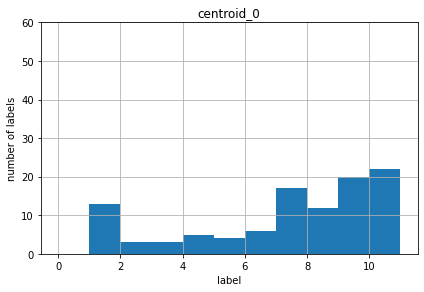

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


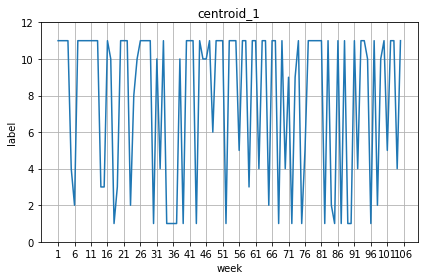

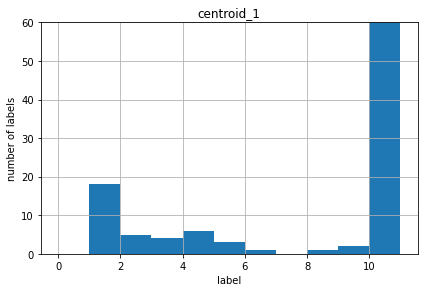

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


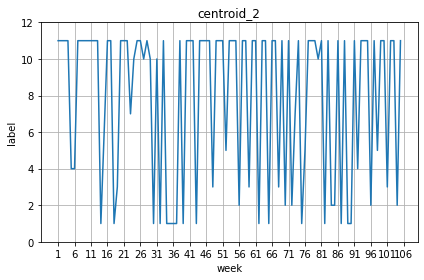

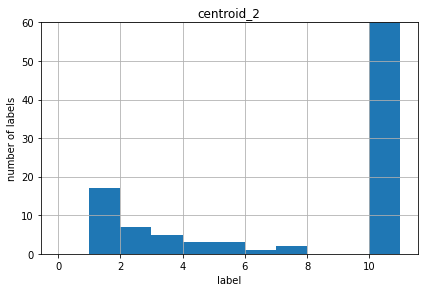

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


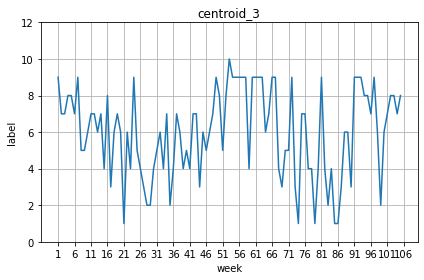

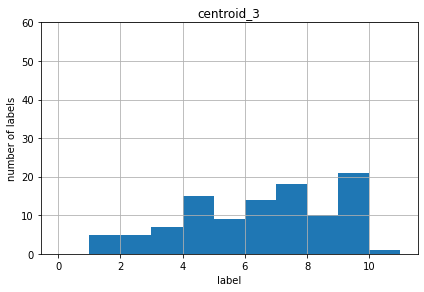

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


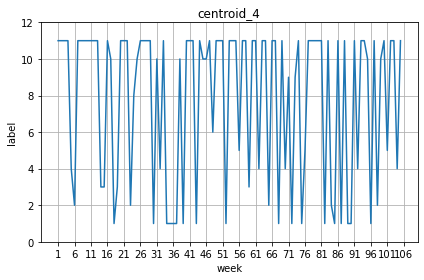

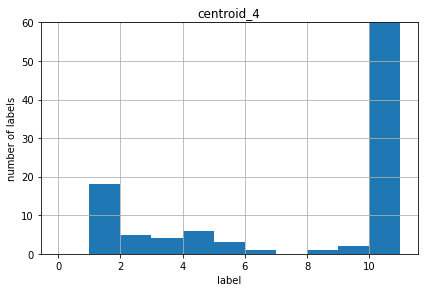

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


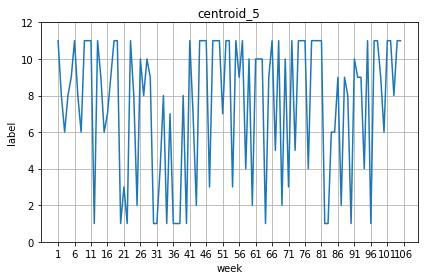

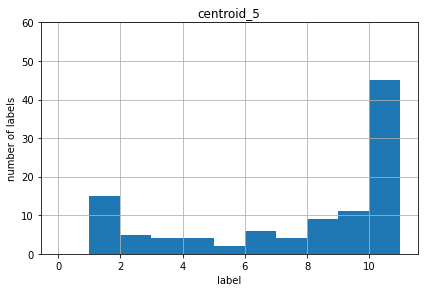

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


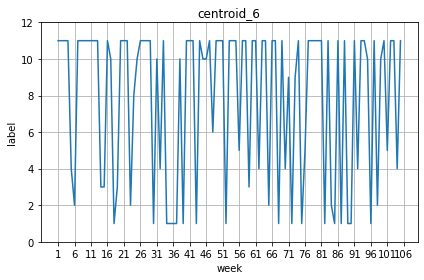

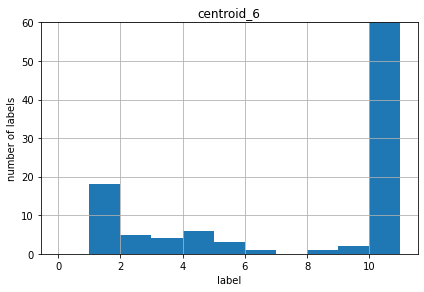

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


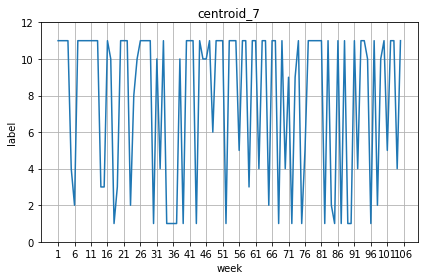

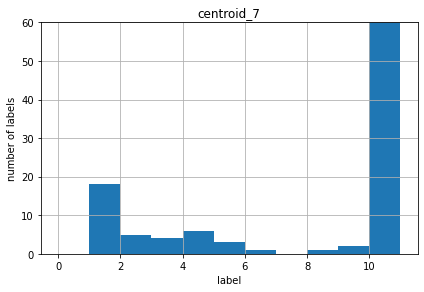

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


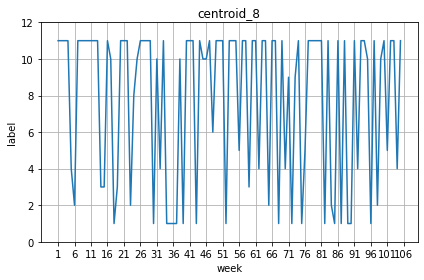

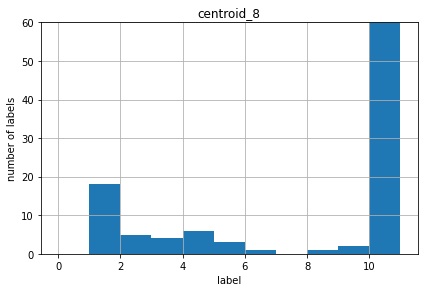

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


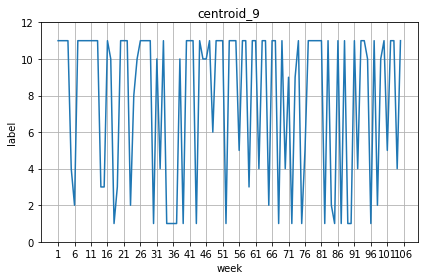

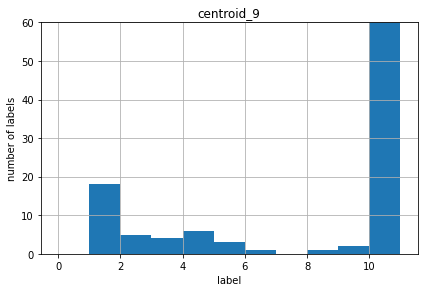

<Figure size 432x288 with 0 Axes>

In [181]:
analysis_2(data2.query("category_id == 1105")) # Just Cereal

CL = [5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2

<ipython-input-178-7d827cb99a15>:64: ConvergenceWarning: Number of distinct clusters (8) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


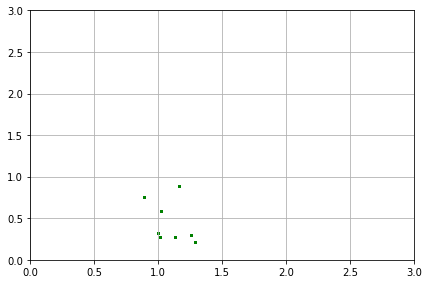

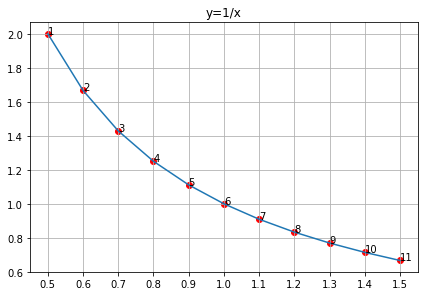

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


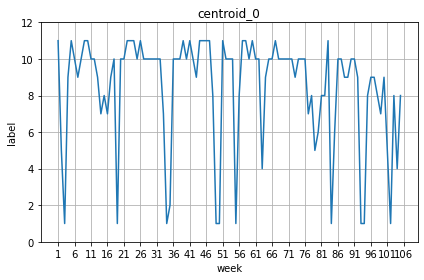

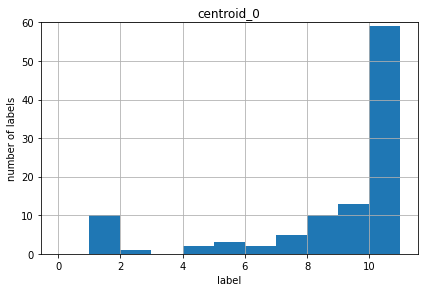

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


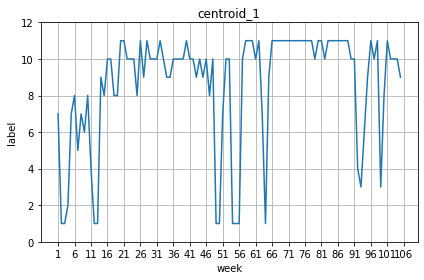

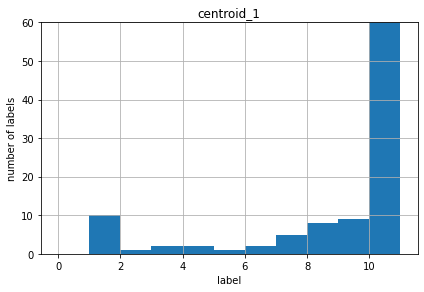

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


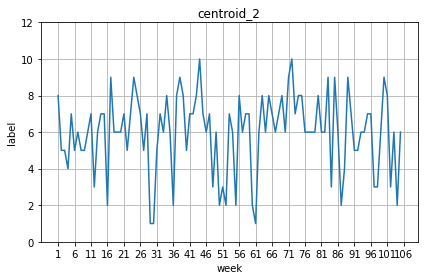

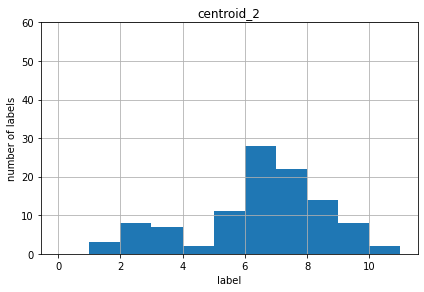

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


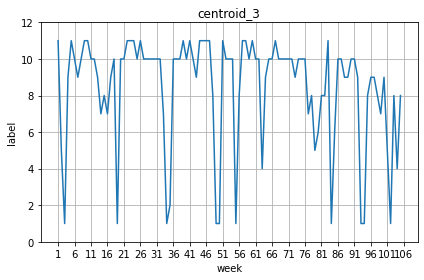

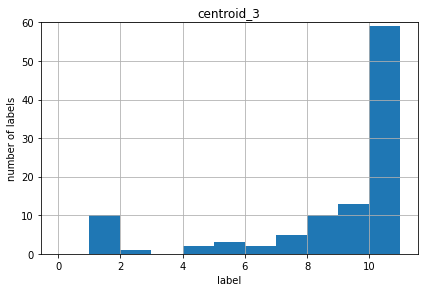

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


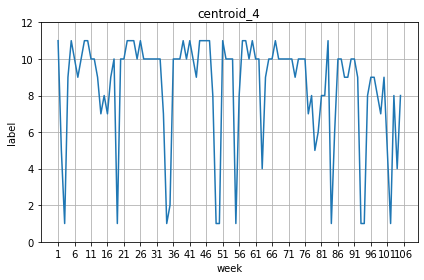

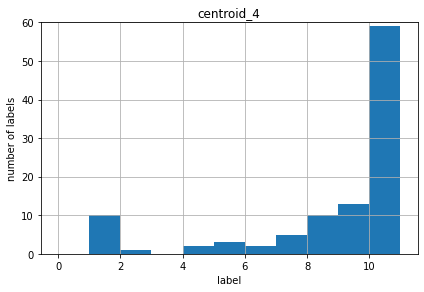

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


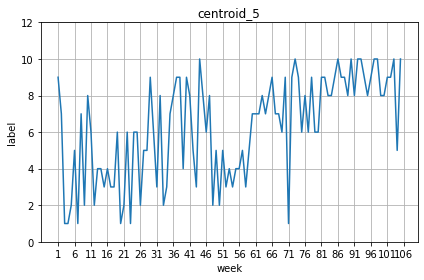

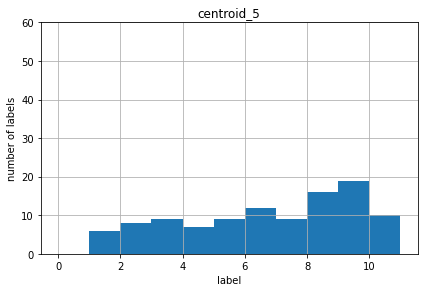

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


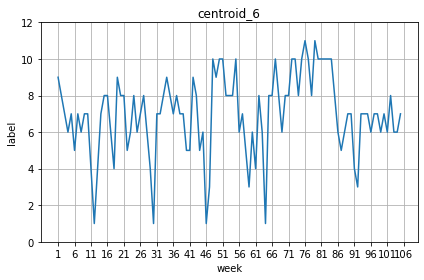

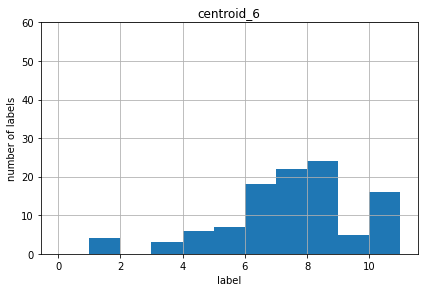

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


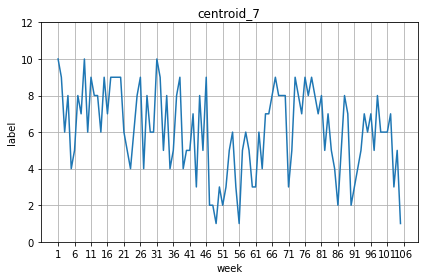

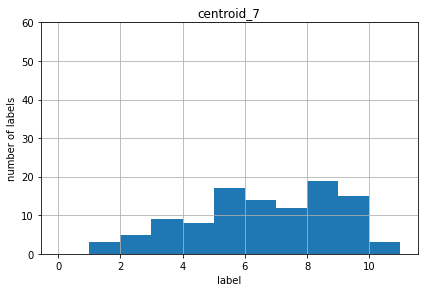

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


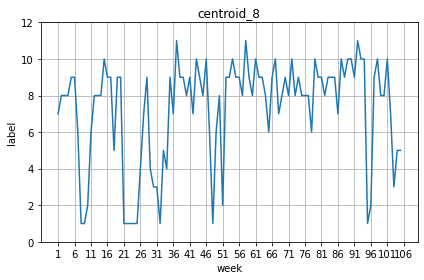

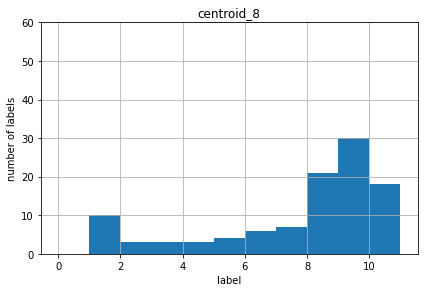

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


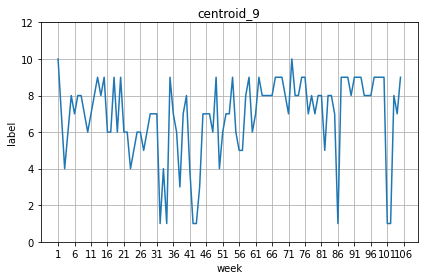

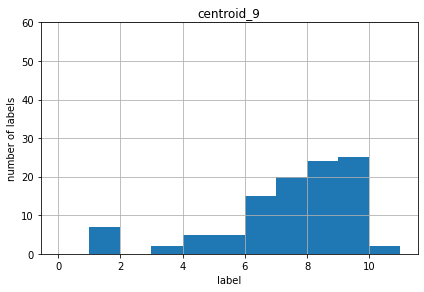

<Figure size 432x288 with 0 Axes>

In [190]:
analysis_2(data2.query("(category_id == 501) or (category_id == 505)")) # Ketchup and Mustard

(315, 105, 2)
CL = [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


<ipython-input-222-4dfaf06d966e>:66: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


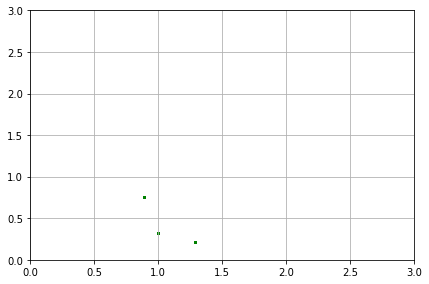

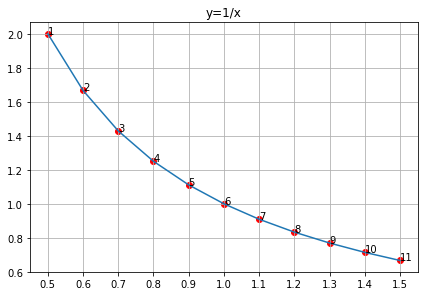

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


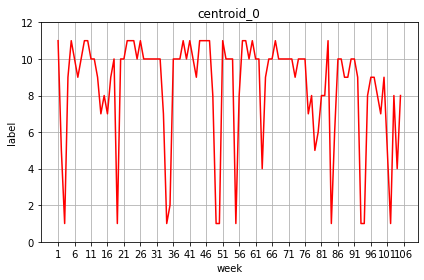

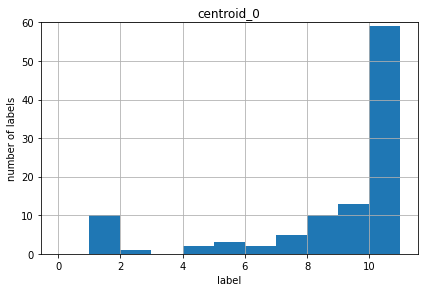

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


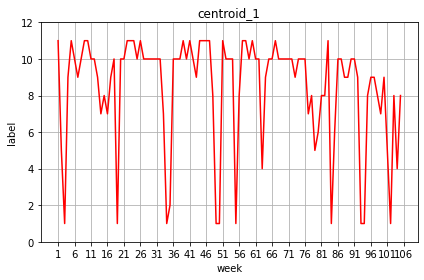

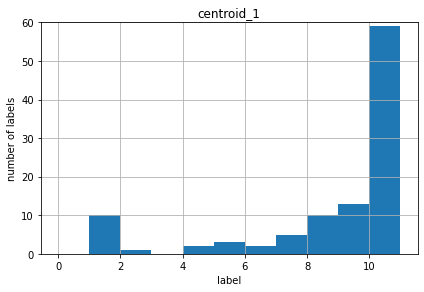

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


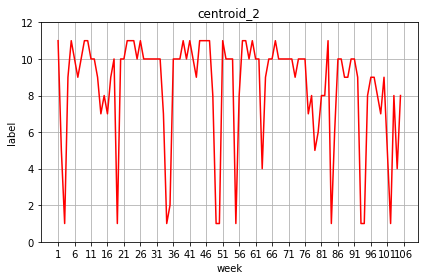

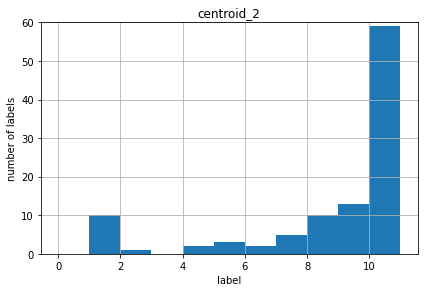

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


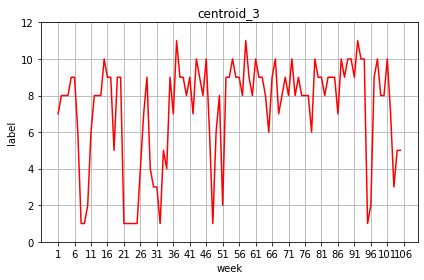

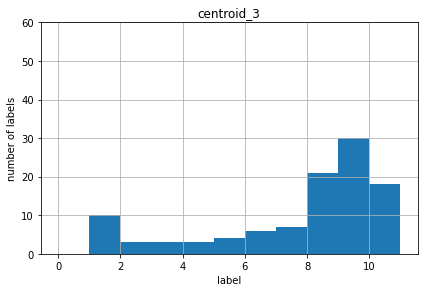

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


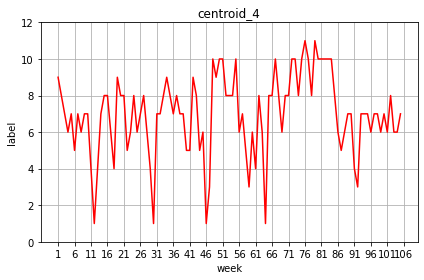

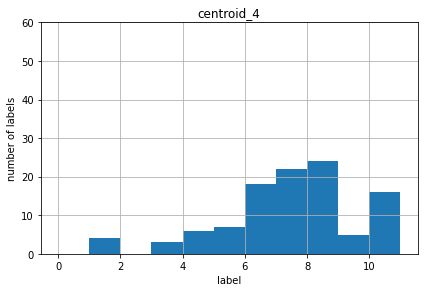

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


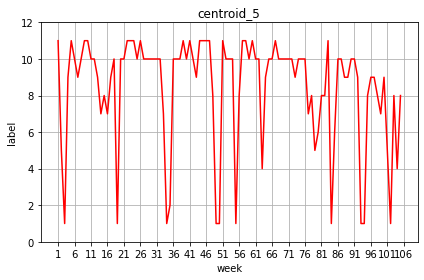

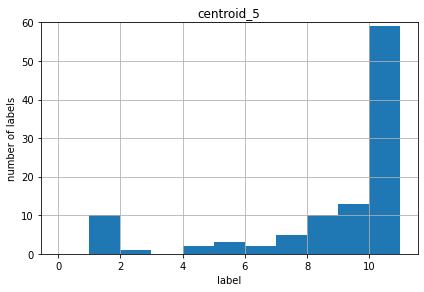

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


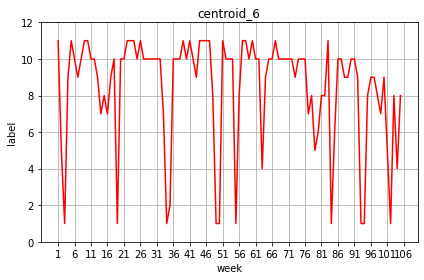

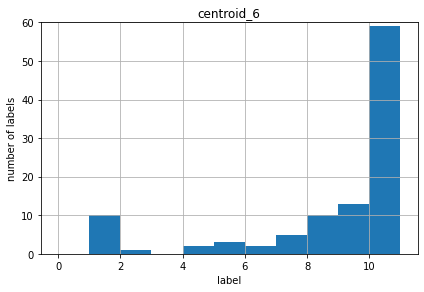

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


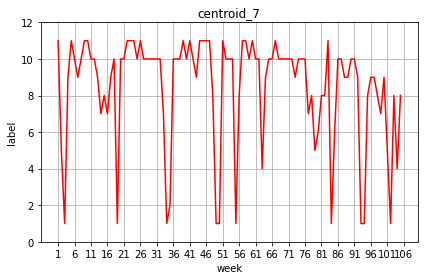

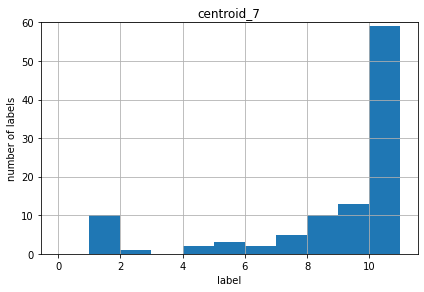

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


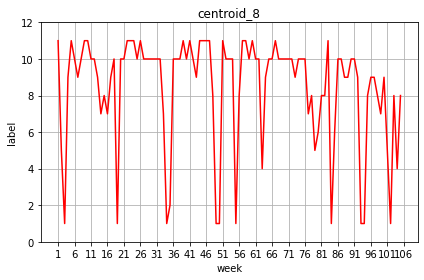

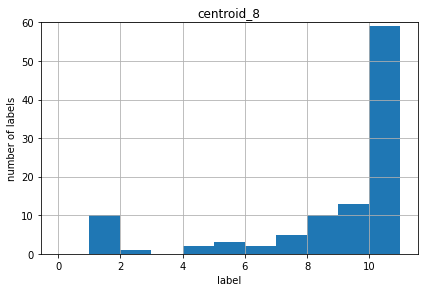

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


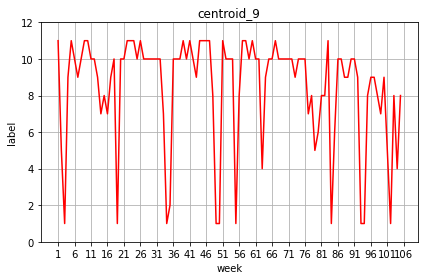

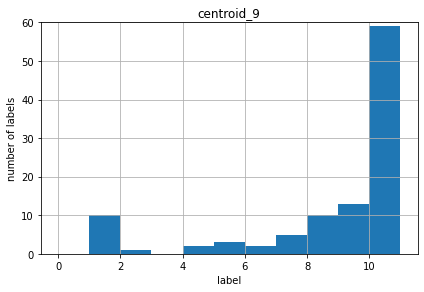

<Figure size 432x288 with 0 Axes>

In [242]:
analysis_2(data2.query("category_id == 501")) # Just Ketchup

In [317]:
profit_per_week(grp_upc_id(data.query("category_id == 501")))

Increase in Profit per week due to discounts = $4.879418
Items sold per week = 3.2874


In [308]:
data.query('category_id == {}'.format(z))['category'].iloc[0]

'COLD CEREAL'

CL = [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4]


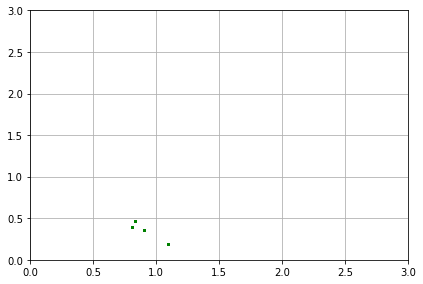

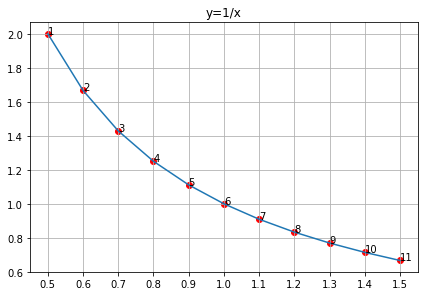

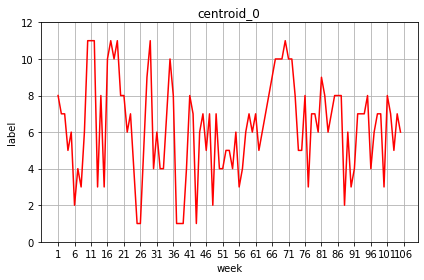

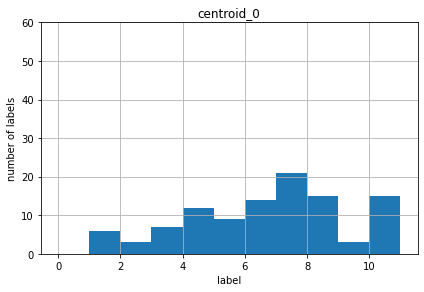

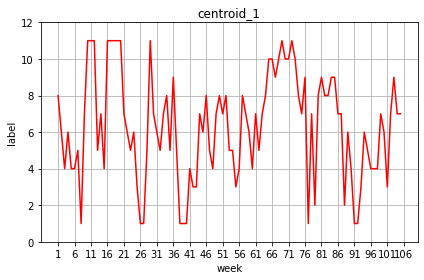

...

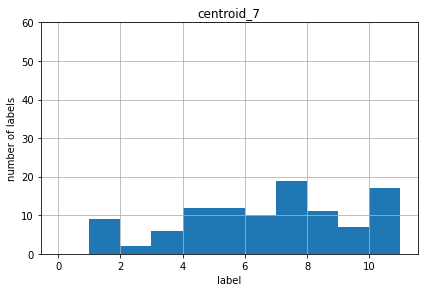

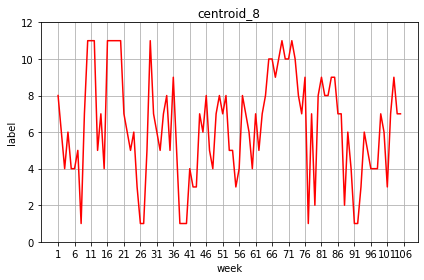

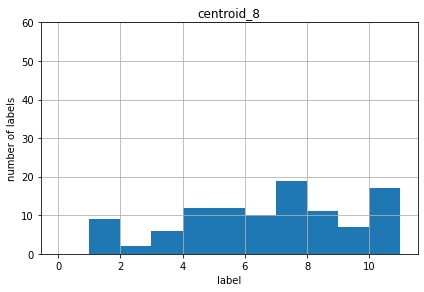

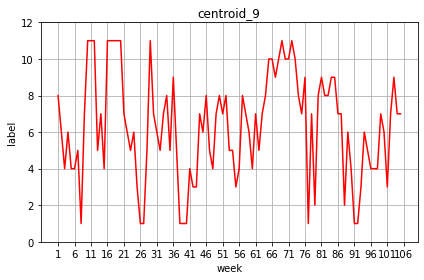

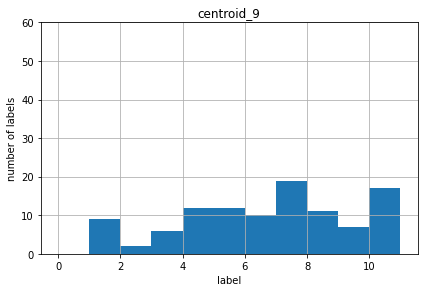

<Figure size 432x288 with 0 Axes>

In [380]:
analysis_2(data2.query("category_id == 105"))

In [381]:
profit_per_week(grp_upc_id(data.query("category_id == 105")))

Increase in Profit per week due to discounts = $7.130494
Items sold per week = 4.1163


(525, 105, 2)
CL = [2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5

<ipython-input-222-4dfaf06d966e>:66: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


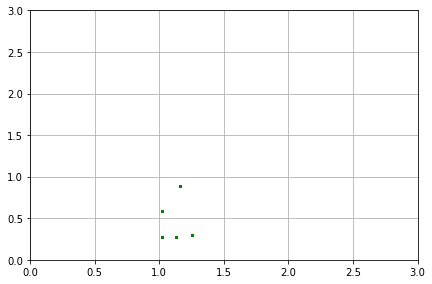

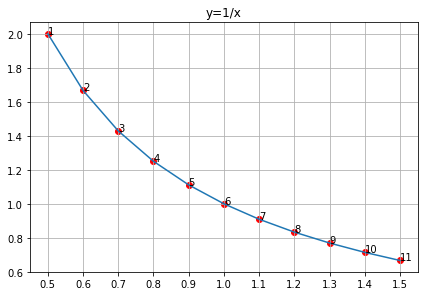

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


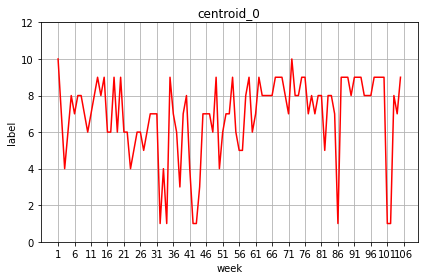

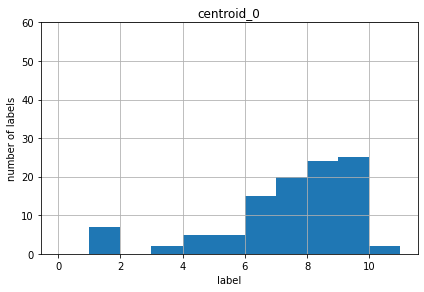

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


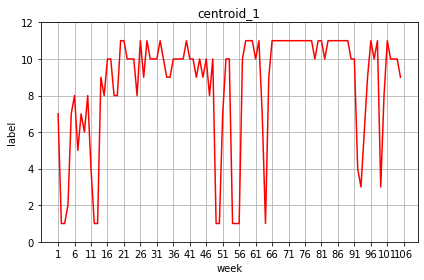

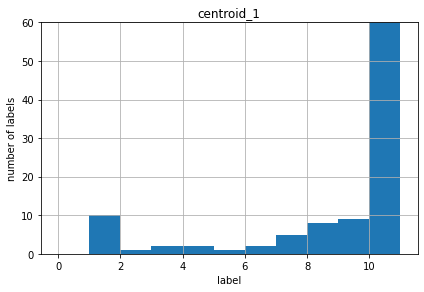

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


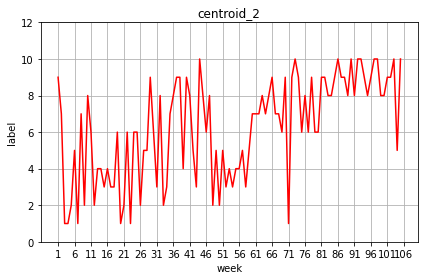

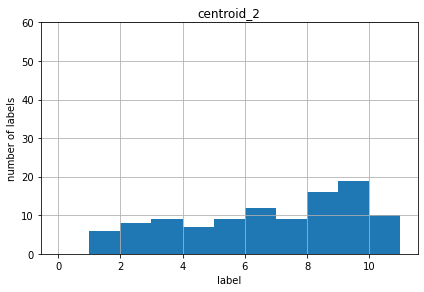

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


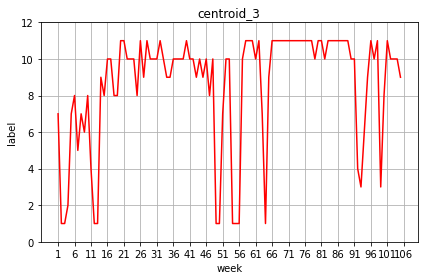

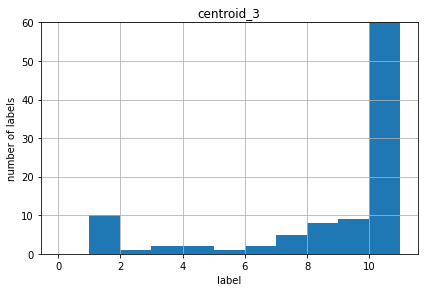

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


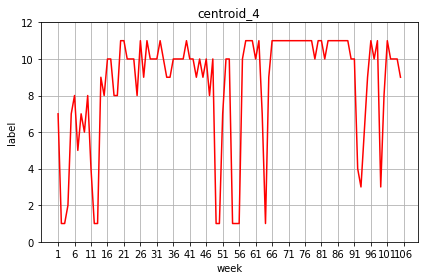

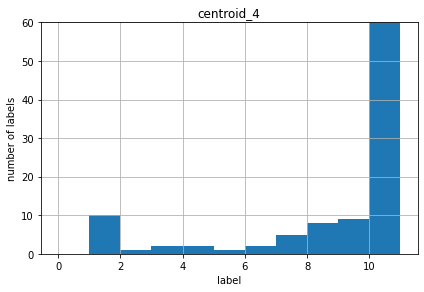

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


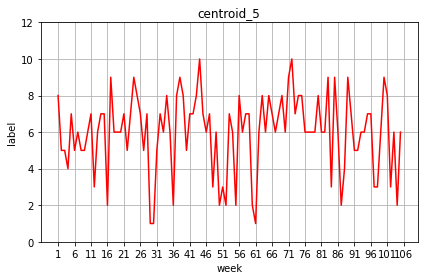

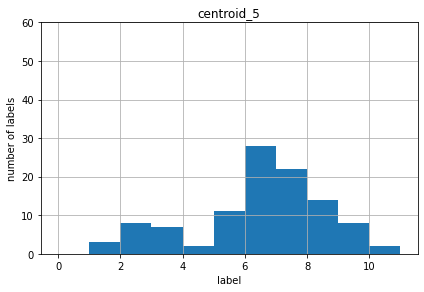

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


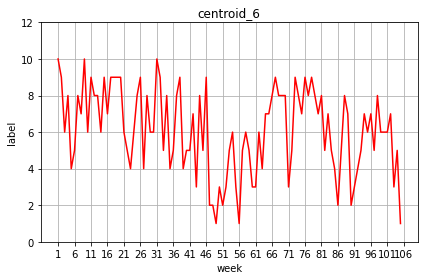

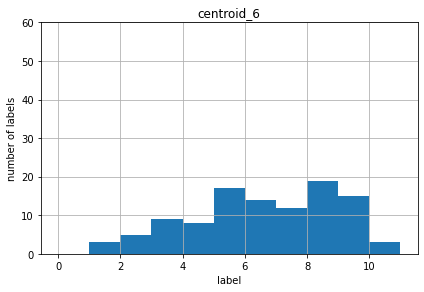

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


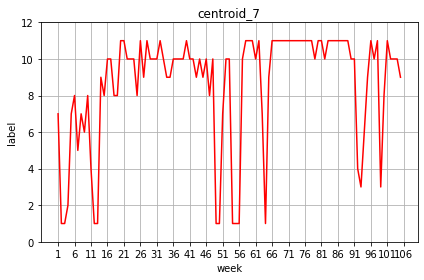

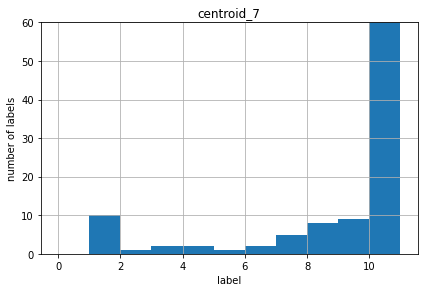

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


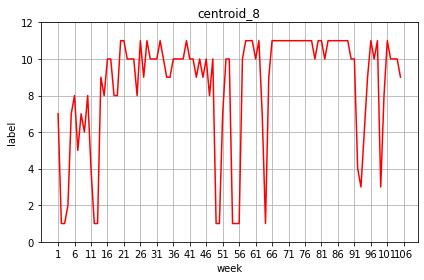

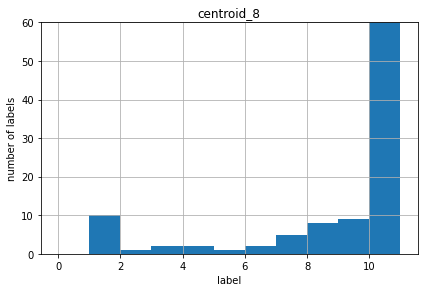

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


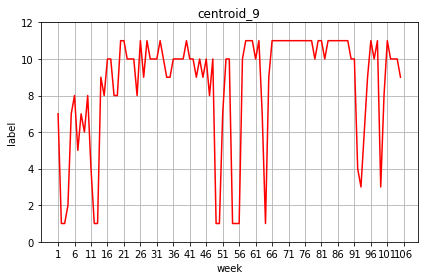

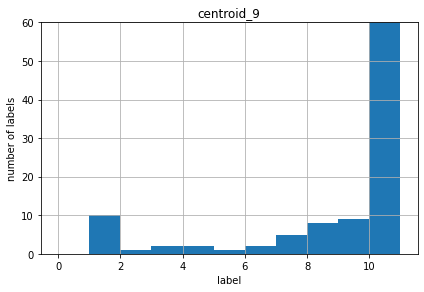

<Figure size 432x288 with 0 Axes>

In [225]:
analysis_2(data2.query("category_id == 505")) # Just Mustard

In [269]:
profit_per_week(grp_upc_id(data.query("category_id == 505")))


Incease in Profit per week due to discounts = $-2.686589
Items sold per week = 3.7826


(105, 105, 2)
CL = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


<ipython-input-222-4dfaf06d966e>:66: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


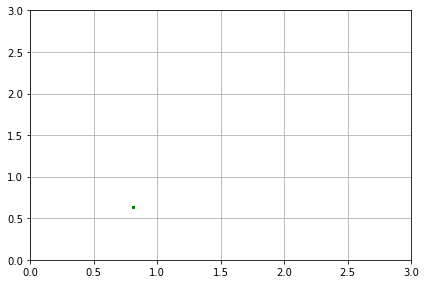

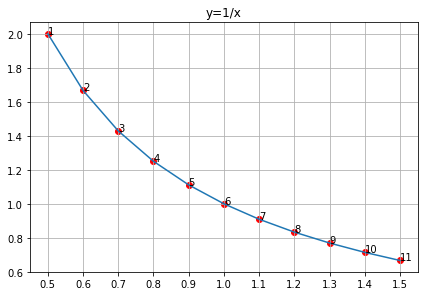

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


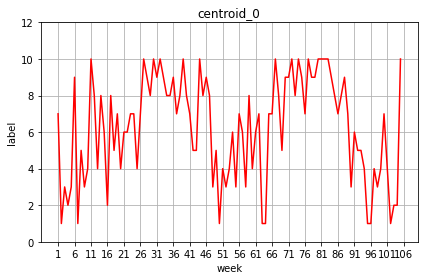

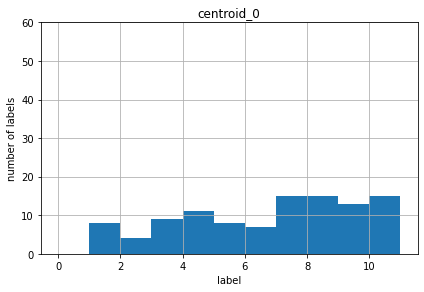

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


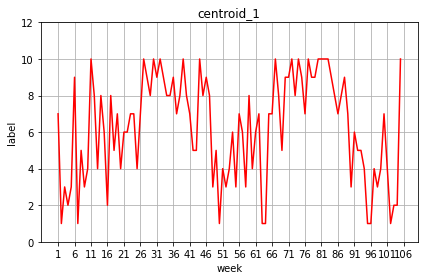

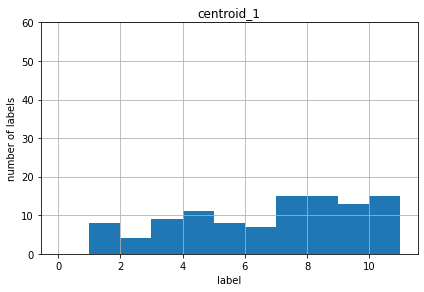

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


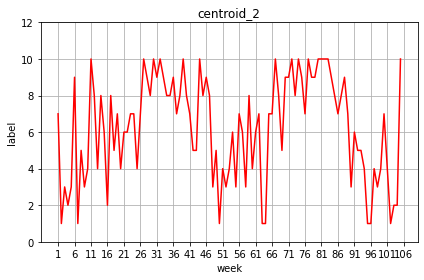

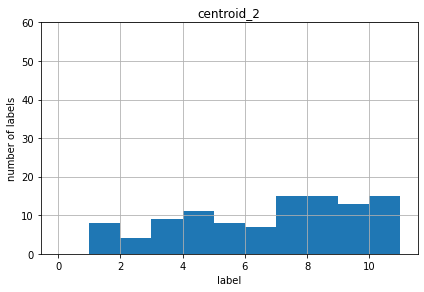

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


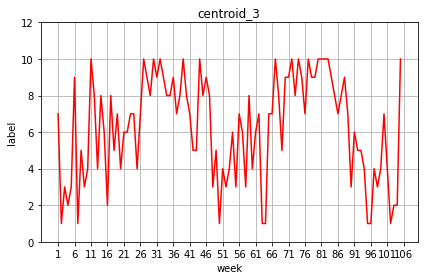

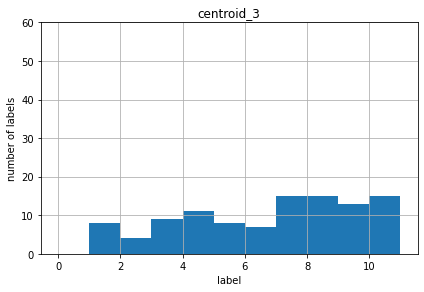

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


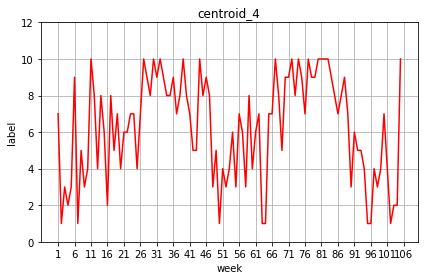

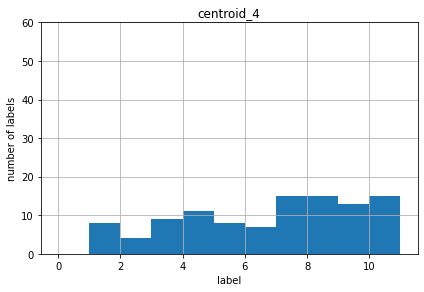

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


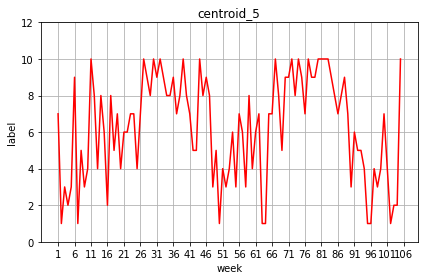

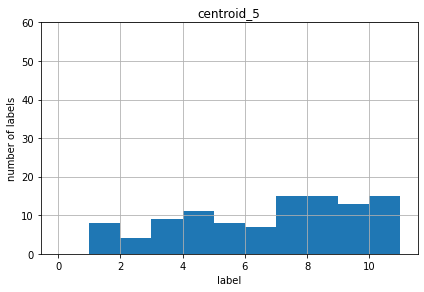

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


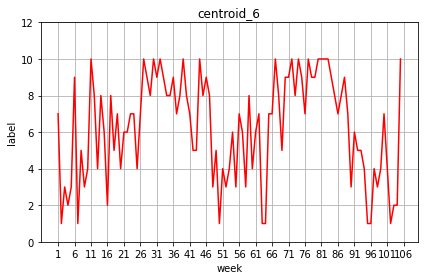

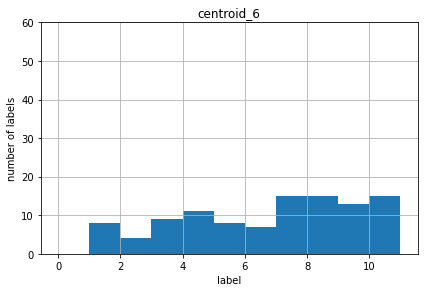

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


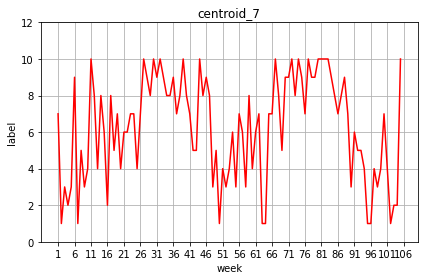

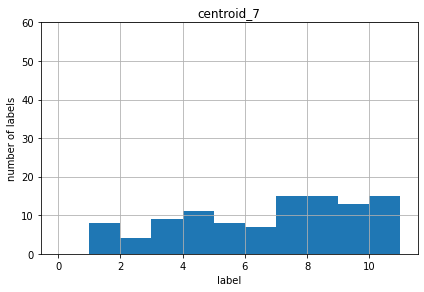

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


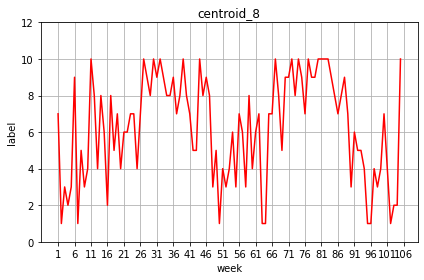

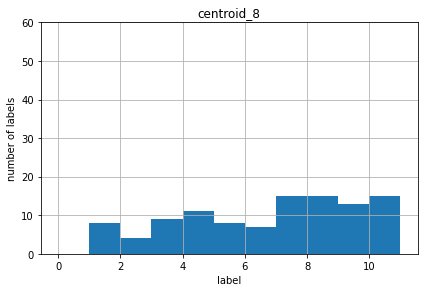

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


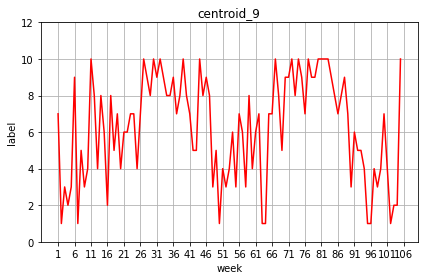

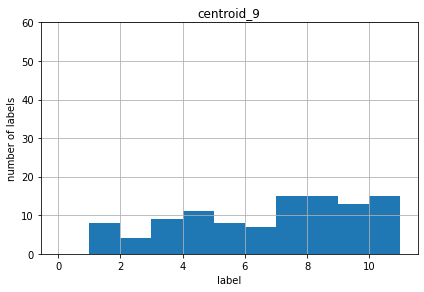

<Figure size 432x288 with 0 Axes>

In [244]:
analysis_2(data2.query("category_id == 1214")) # Cups and Cones

In [270]:
profit_per_week(grp_upc_id(data.query("category_id == 1214")))


Incease in Profit per week due to discounts = $2.713189
Items sold per week = 6.11


CL = [7 7 7 ... 2 2 2]


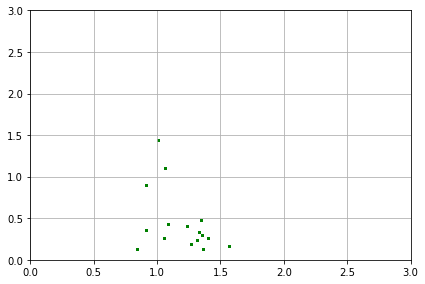

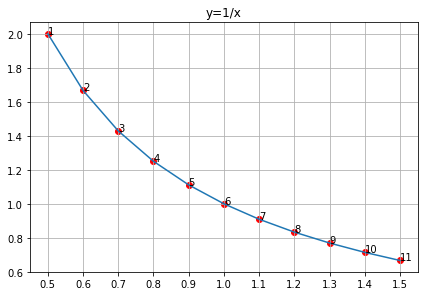

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


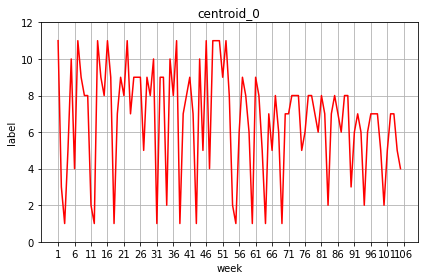

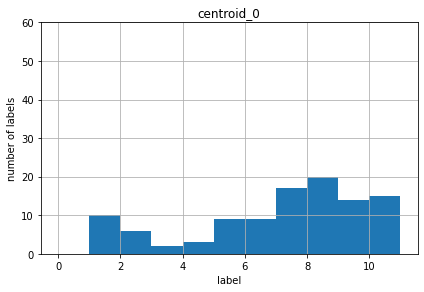

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


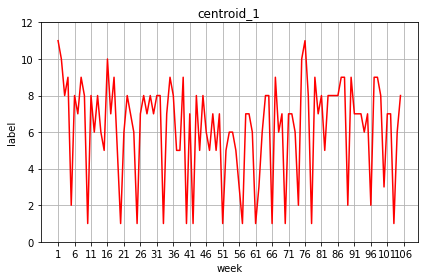

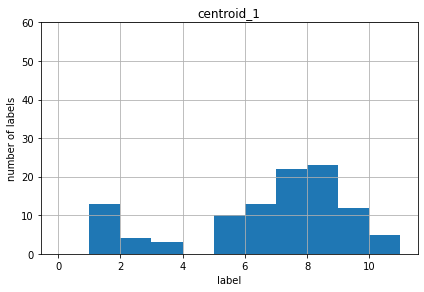

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


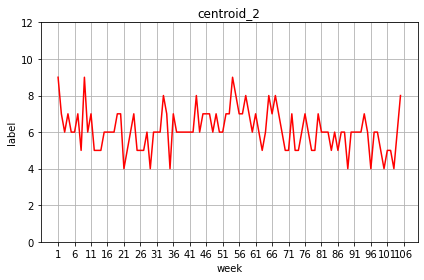

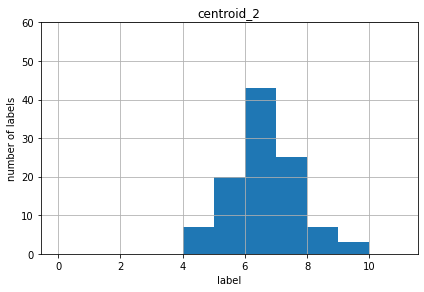

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


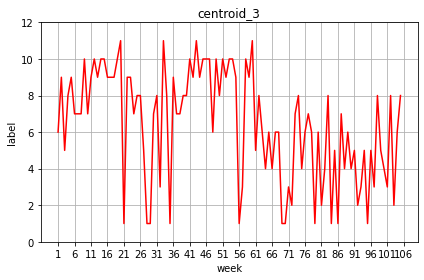

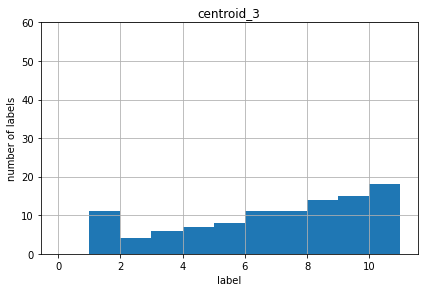

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


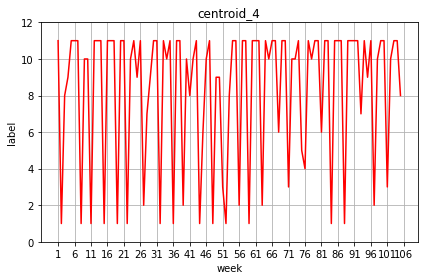

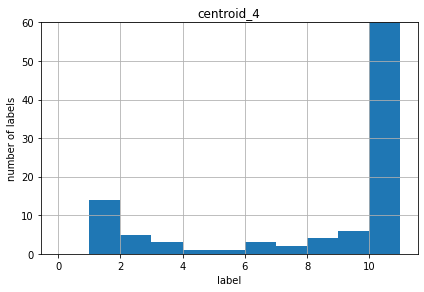

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


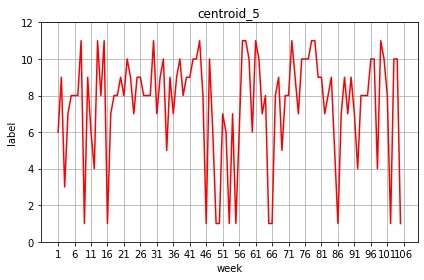

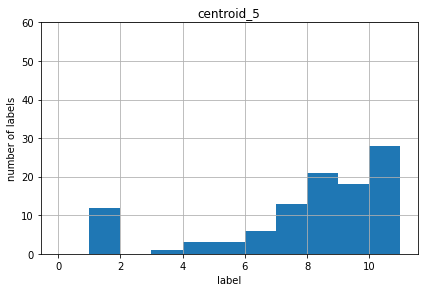

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


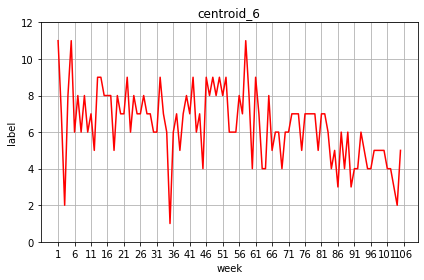

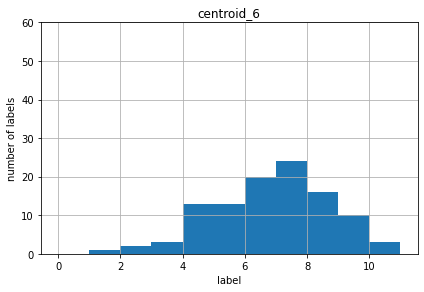

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


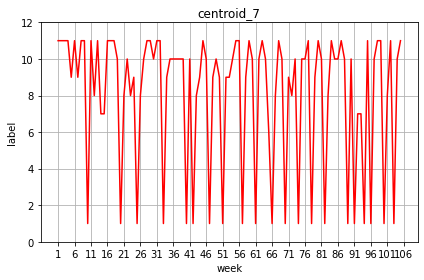

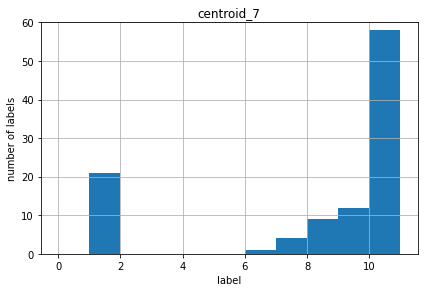

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


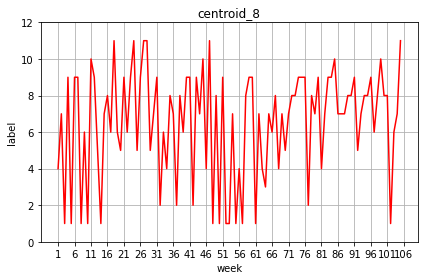

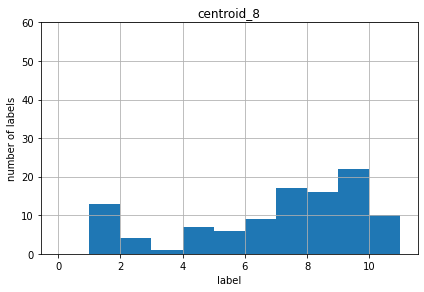

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


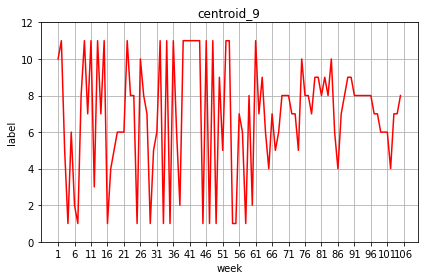

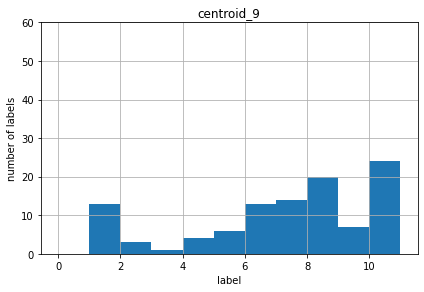

<Figure size 432x288 with 0 Axes>

In [255]:
analysis_2(data2.query("(category_id == 8801) or (category_id == 8802)")) # BEEF

CL = [2 2 2 ... 5 5 5]


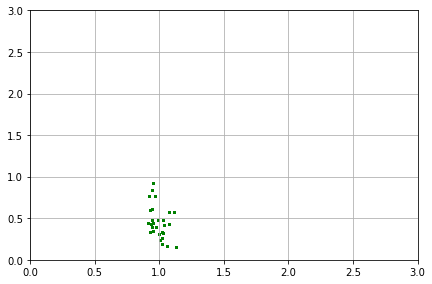

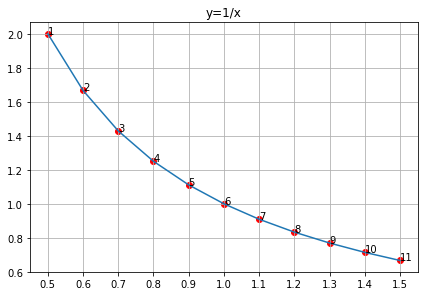

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


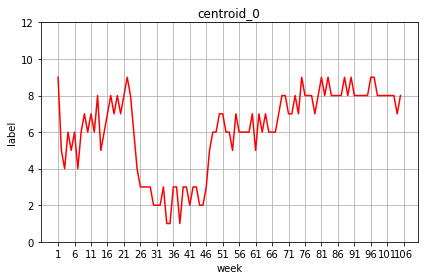

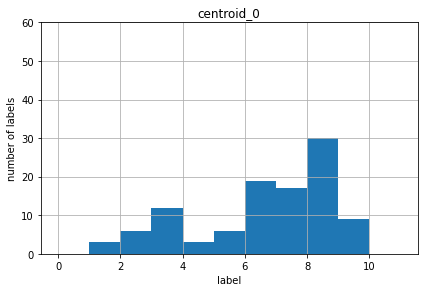

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


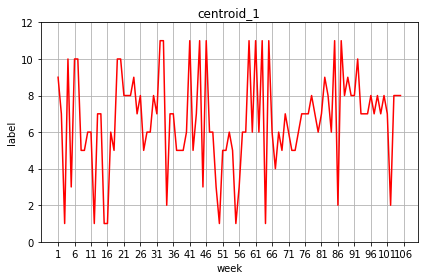

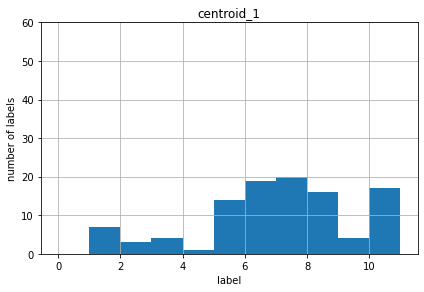

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


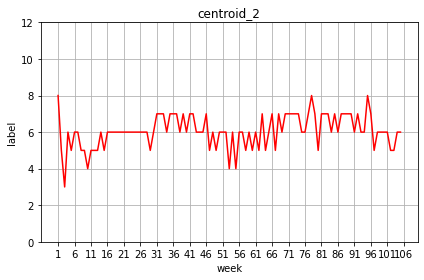

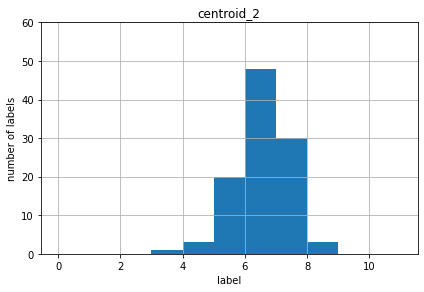

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


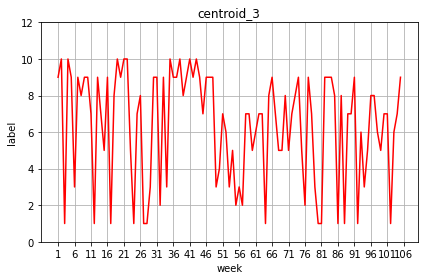

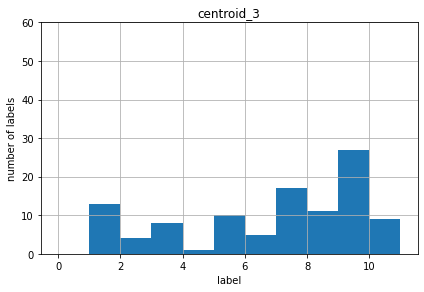

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


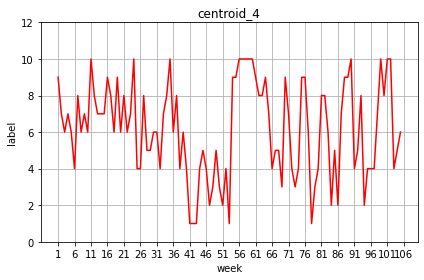

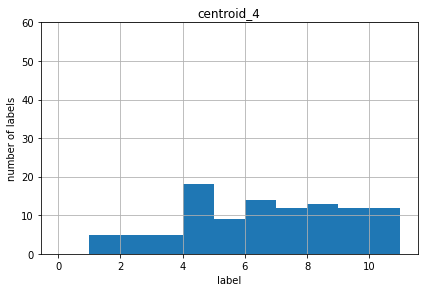

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


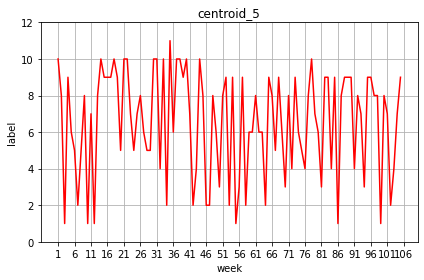

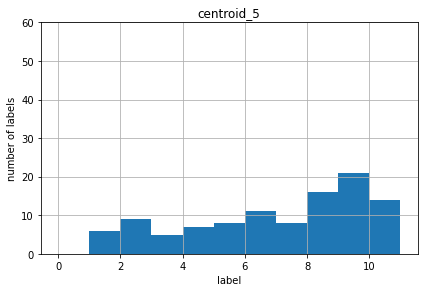

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


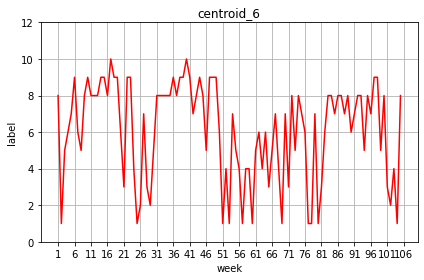

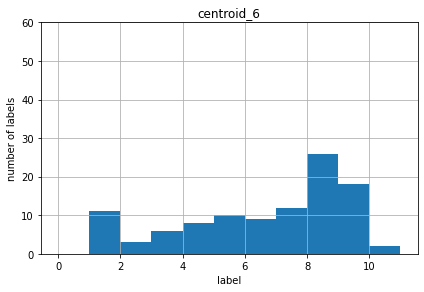

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


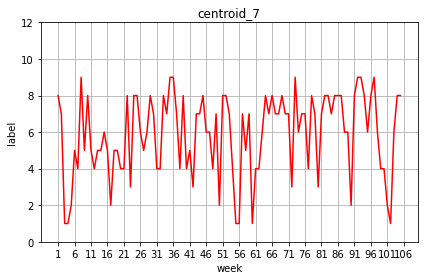

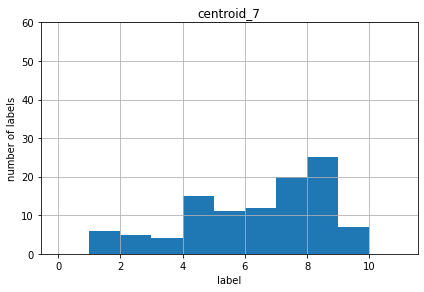

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


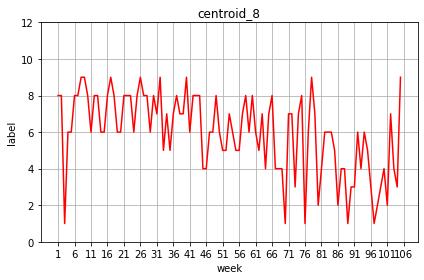

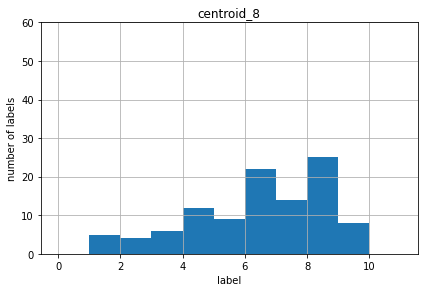

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


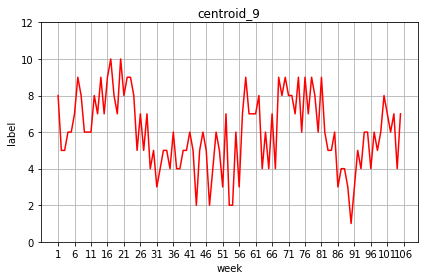

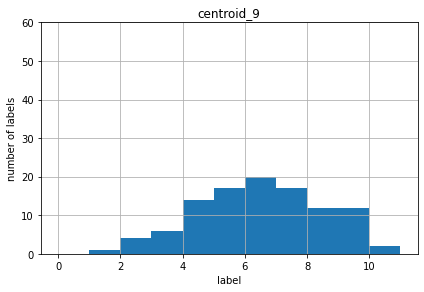

<Figure size 432x288 with 0 Axes>

In [257]:
analysis_2(data2.query("category_id == 8901")) # Beer

In [273]:
profit_per_week(grp_upc_id(data.query("category_id == 8901")))


Incease in Profit per week due to discounts = $3.988517
Items sold per week = 5.1628


<ipython-input-250-16716f57b850>:66: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


CL = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


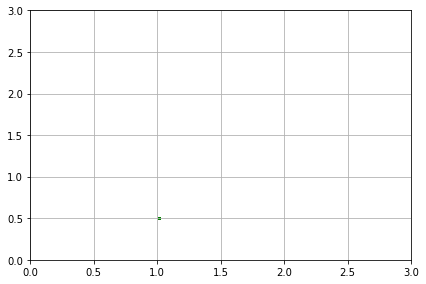

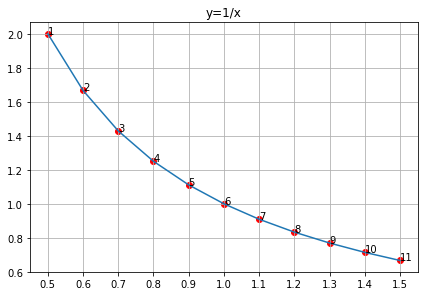

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


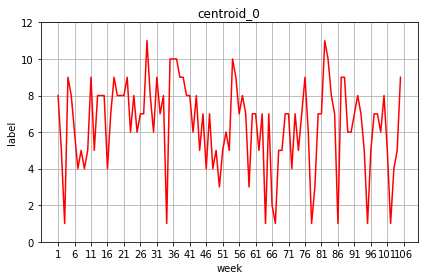

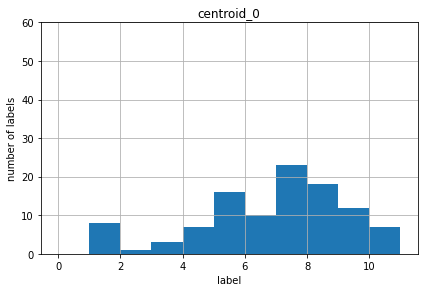

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


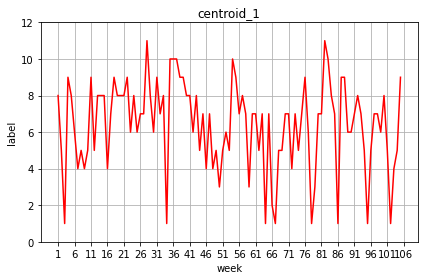

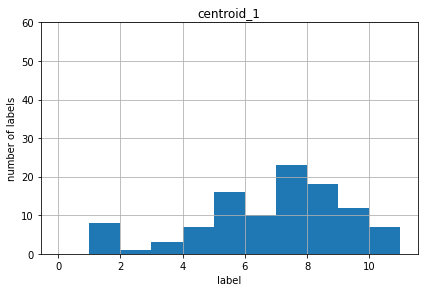

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


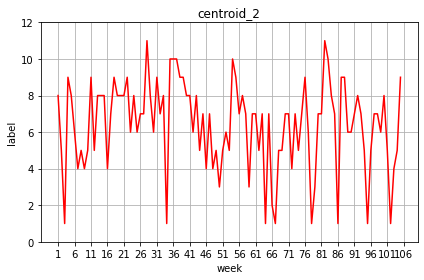

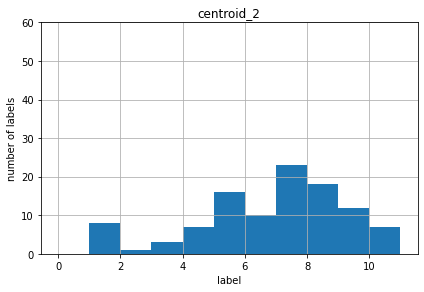

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


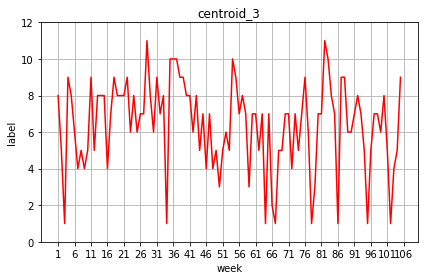

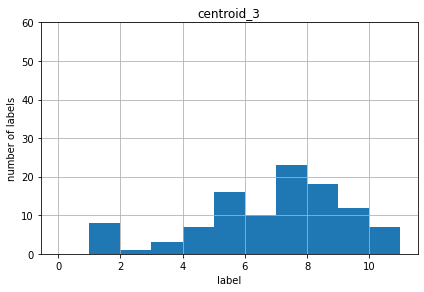

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


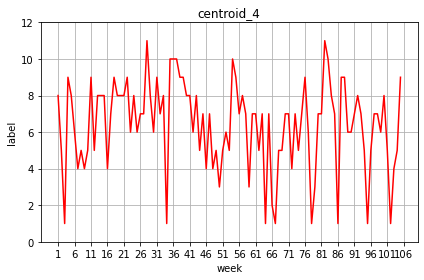

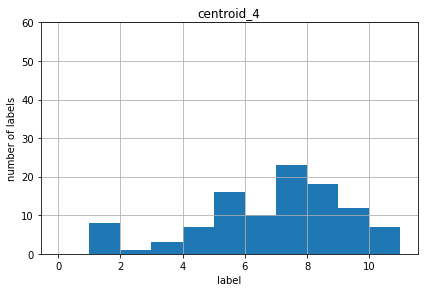

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


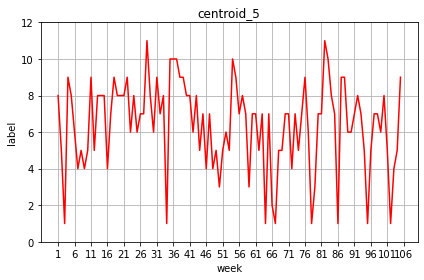

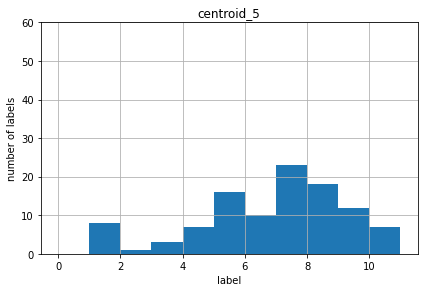

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


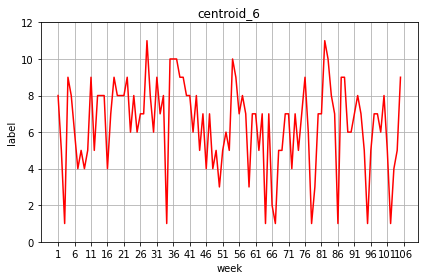

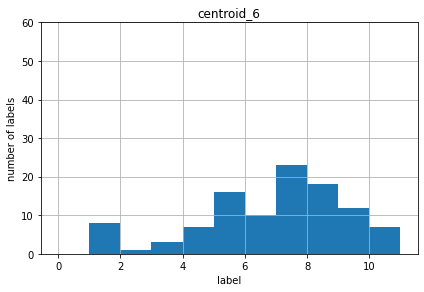

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


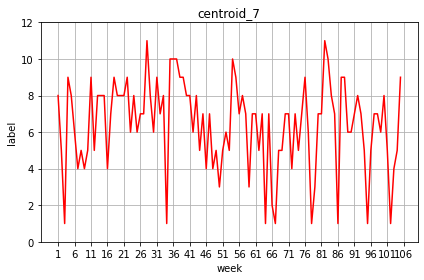

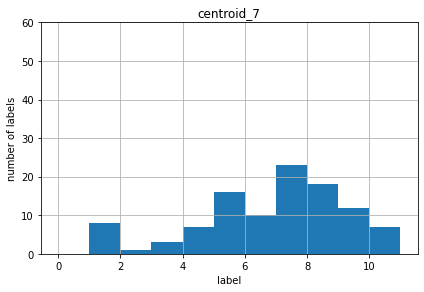

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


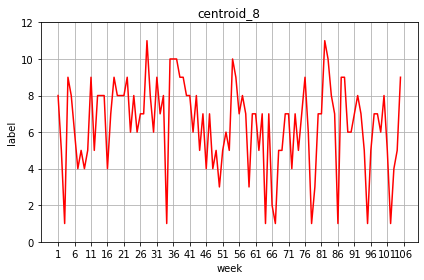

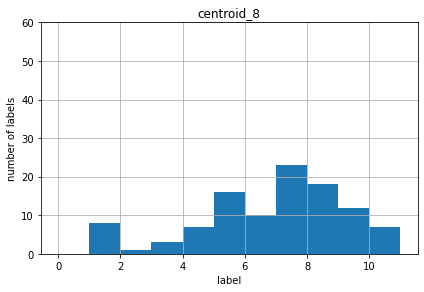

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


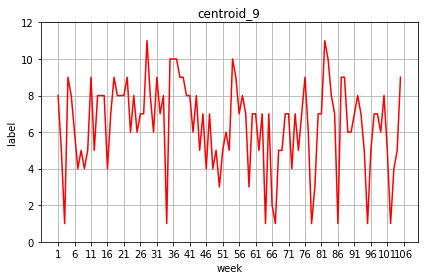

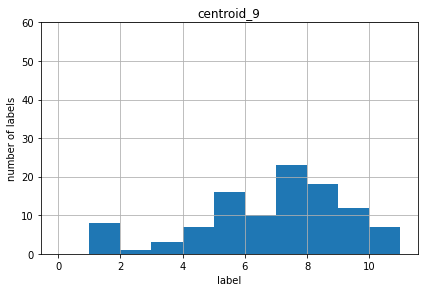

<Figure size 432x288 with 0 Axes>

In [258]:
analysis_2(data2.query("category_id == 520")) # BBQ Sauce

In [274]:
profit_per_week(grp_upc_id(data.query("category_id == 520")))


Incease in Profit per week due to discounts = $-3.340444
Items sold per week = 4.2


<ipython-input-250-16716f57b850>:66: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  km = KMeans(n_clusters=10,


CL = [6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3]


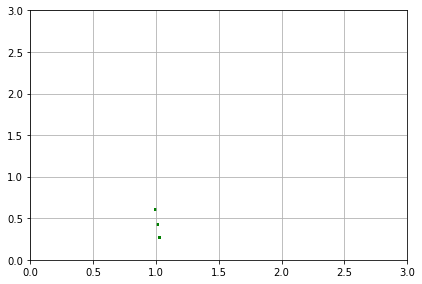

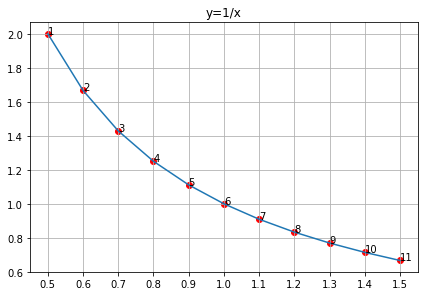

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


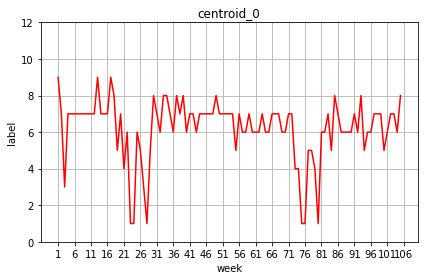

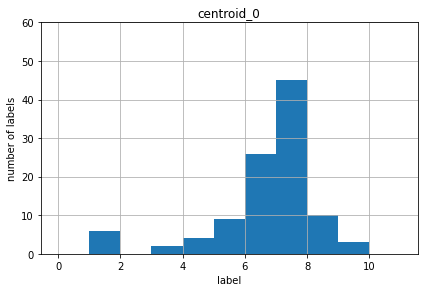

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


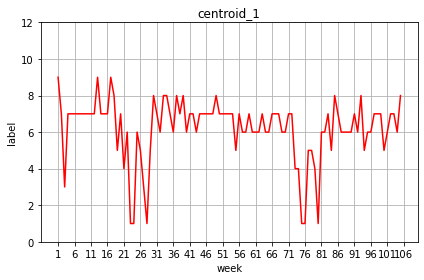

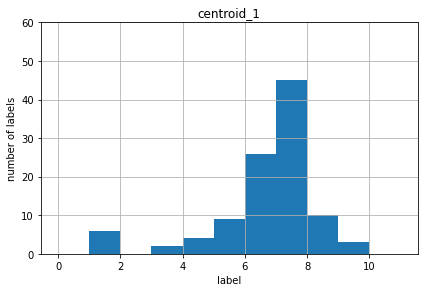

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


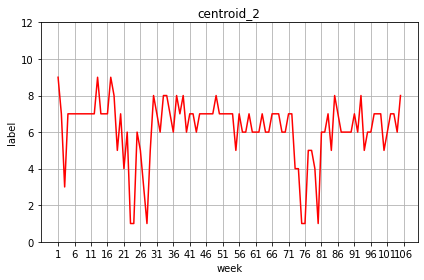

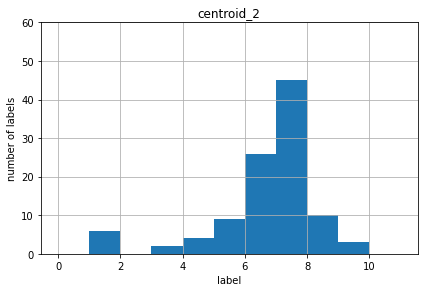

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


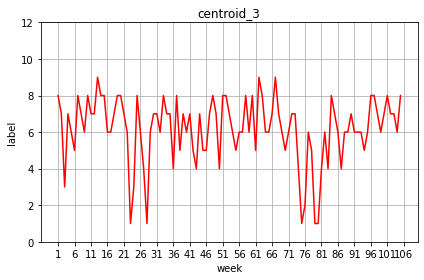

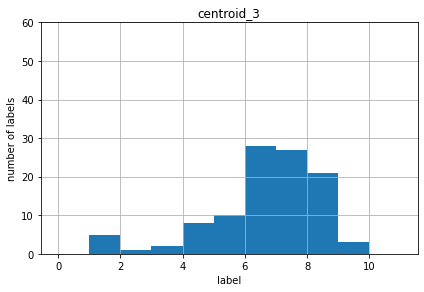

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


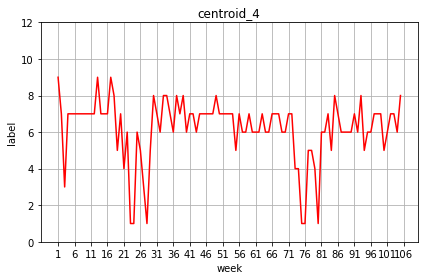

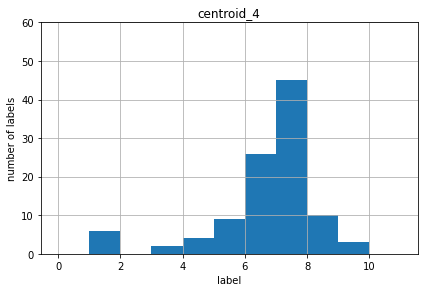

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


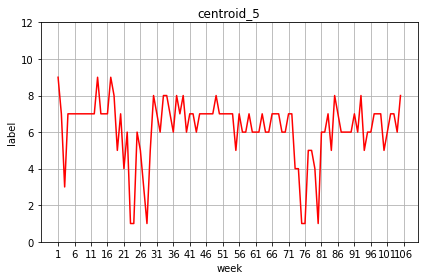

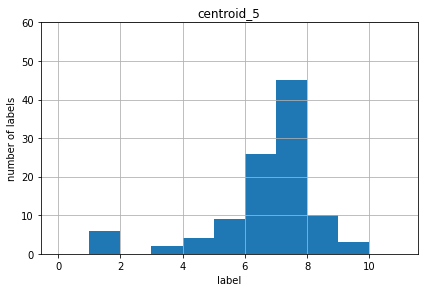

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


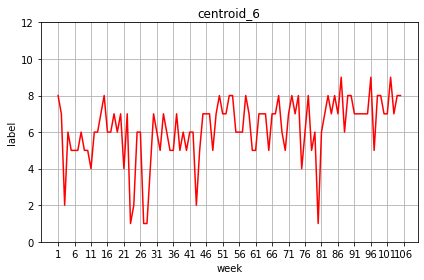

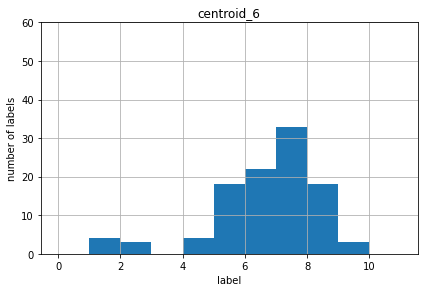

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


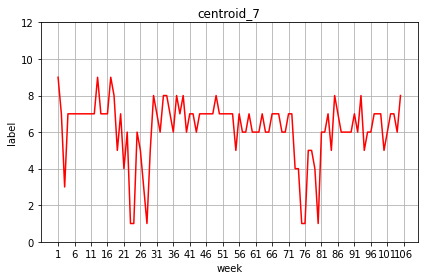

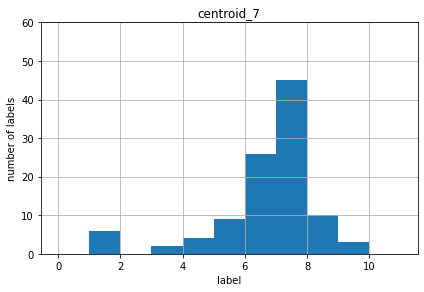

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


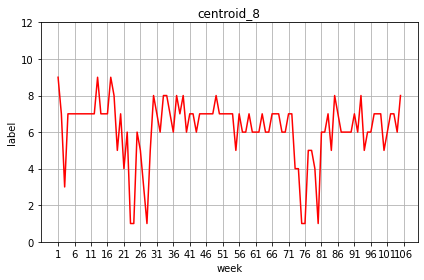

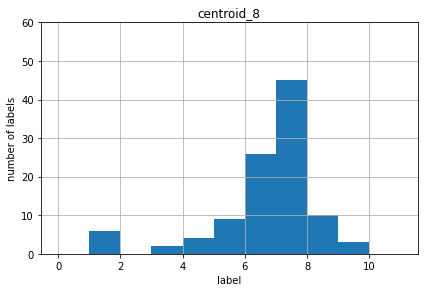

/Users/nathan/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


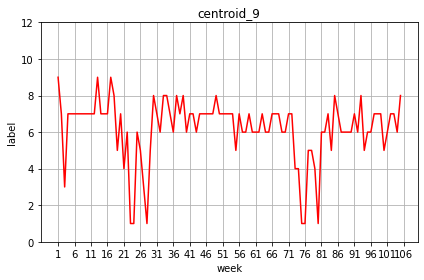

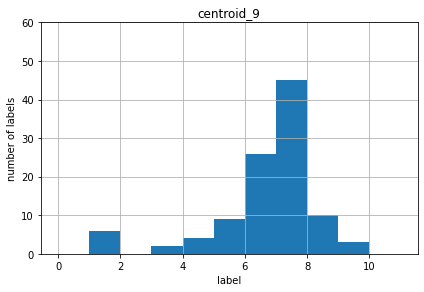

<Figure size 432x288 with 0 Axes>

In [259]:
analysis_2(data2.query("category_id == 3615")) # Cream

In [271]:
profit_per_week(grp_upc_id(data.query("category_id == 3615")))


Incease in Profit per week due to discounts = $49.195079
Items sold per week = 21.4857


# Plotting two seperate products

In [276]:
def analysis_3(df):

    combo = df
    combo = combo[combo['units'] > 0]
    combo = combo[combo['net_amt'] > 0]
    combo['net_weekly_revenue'] = combo['net_amt']
    combo['net_price'] = combo['net_weekly_revenue'] / combo['units']
    #combo.drop(columns=['category_id']) # dropping category_id to try and get more clusters

    '''Find all products with 105 weeks combo'''
    # Group by upc_id, select the products with all 105 weeks combo, calculate average price and average unit
    df_grp = combo.groupby(['upc_id']).agg({'promo_week_id': 'count', 'category_id': 'max', 'net_weekly_revenue': 'sum',
                                           'units': 'sum'})
    df_grp = df_grp.sort_values(by=['promo_week_id', 'category_id'], ascending=False)
    df_grp['average_net_price'] = df_grp['net_weekly_revenue'] / df_grp['units']
    df_grp['average_units'] = df_grp['units'] / df_grp['promo_week_id']
    df_grp = df_grp[df_grp['promo_week_id'] == 105]
    
    df_grp = df_grp.rename(columns = {'upc_id':'upc_id_val'})

    df1 = combo[['upc_id','class_id']]

    df_grp = df_grp.merge(df1[["upc_id","class_id"]], 
                                                       left_on='upc_id', right_on='upc_id',
                                                       suffixes=('_left', '_right'))
    df_grp = df_grp.set_index('upc_id')
    #df_grp = pd.merge(df_grp, combo[['upc_id','class_id']], on="upc_id", how="left")

    # print(df_grp)
    product = list(df_grp.index)
    df_grp['upc_id'] = product
    average_net_price = df_grp['average_net_price'].tolist()
    average_unit = df_grp['average_units'].tolist()

    ''' For each product, return 105 weeks (net_price_ratio, unit_ratio) and then combine all combo into a matrix'''
    pu_matrix = []
    for i in range(0, len(df_grp)):
        upc_id = product[i]
        net_price, unit = individual_result(combo, upc_id)
        net_price_ratio = []
        for p in net_price:
            net_price_ratio.append(p / average_net_price[i])
        unit_ratio = []
        for u in unit:
            unit_ratio.append(u / average_unit[i])
        price_unit = list(zip(net_price_ratio, unit_ratio))
        pu_matrix.append(price_unit)
        
    '''Kmeans clustering on all products' 105 week combo'''
    cl = []
    X = np.asarray(pu_matrix)
    
    nsamples, nx, ny = X.shape  # nsamples=1887, nx=105, ny=2

    #X = X.shape(nsamples*nx, -1)
    X = X.reshape((nsamples, nx*ny))
    
    #X.shape = [nsamples, 1]
    km = KMeans(n_clusters=10,
                init='k-means++',
                n_init=10,
                max_iter=300,
                random_state=0).fit(X)
    centroid = km.cluster_centers_
    product_cluster = km.labels_
    cl = product_cluster
    
    return centroid

In [318]:
def analysis_4(df1, df2):

    centroid = analysis_3(df1)
    centroid2 = analysis_3(df2)

    x = np.array([0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5])
    y = f(x)
    curve_labels = list(zip(x, y))
    
    '''Assign labels to centroids by shortest distance'''
    weeks = range(1, 106)
    df_centroid = pd.DataFrame({'Week': weeks})
    for i in range(0, len(centroid)):
        centroid_pair = list(grouper(centroid[i], 2))
        pre_index = shortest_distance(centroid_pair, curve_labels)
        assign_label = [x + 1 for x in pre_index]
        df_centroid['centroid_' + str(i)] = assign_label
    
    num1 = df1['category_id'].iloc[0]
    num2 = df2['category_id'].iloc[0]
    
    label_1 = data.query('category_id == {}'.format(num1))['category'].iloc[0]
    label_2 = data.query('category_id == {}'.format(num2))['category'].iloc[0]
        
    df_centroid2 = pd.DataFrame({'Week': weeks})
    for i in range(0, len(centroid2)):
        centroid_pair2 = list(grouper(centroid2[i], 2))
        pre_index2 = shortest_distance(centroid_pair2, curve_labels)
        assign_label2 = [x + 1 for x in pre_index2]
        df_centroid2['centroid_' + str(i)] = assign_label2

        '''Trajectory of each centroid'''
        plt.figure(figsize=(15,7))
        sns.lineplot(weeks, assign_label, color='red', label='{}'.format(label_1))
        sns.lineplot(weeks, assign_label2, color='blue', label='{}'.format(label_2))
        plt.xlabel('week')
        plt.ylabel('label')
        plt.xticks(range(1, 107, 5))
        plt.ylim(0, 12)
        plt.title("centroid_" + str(i))
        plt.legend(loc='upper right')
        plt.grid()
        plt.tight_layout()
        plt.show()
        # plt.savefig("centroid_" + str(i) + "_trajectory.png", dpi=300)
        plt.clf()
    
    print("{}".format(label_1))
    profit_per_week(grp_upc_id(data.query("category_id == {}".format(num1))))
    print("\n{}".format(label_2))
    profit_per_week(grp_upc_id(data.query("category_id == {}".format(num2))))

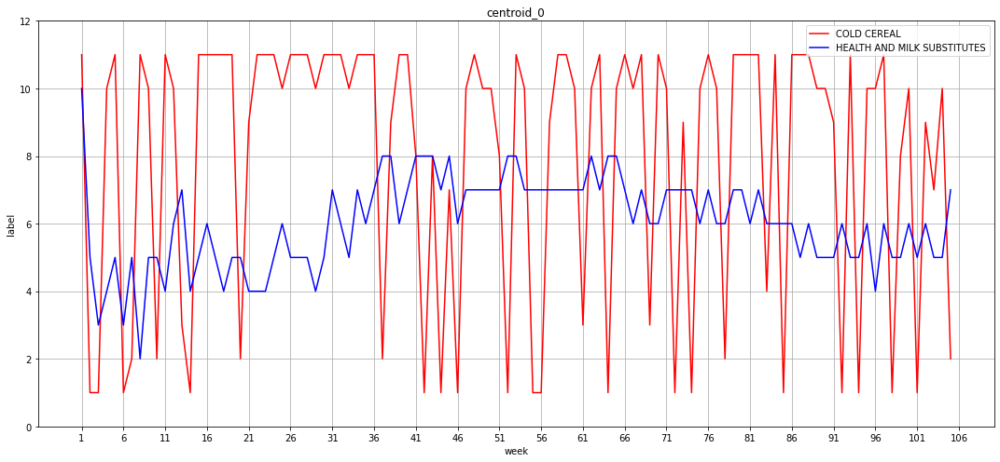

<Figure size 432x288 with 0 Axes>

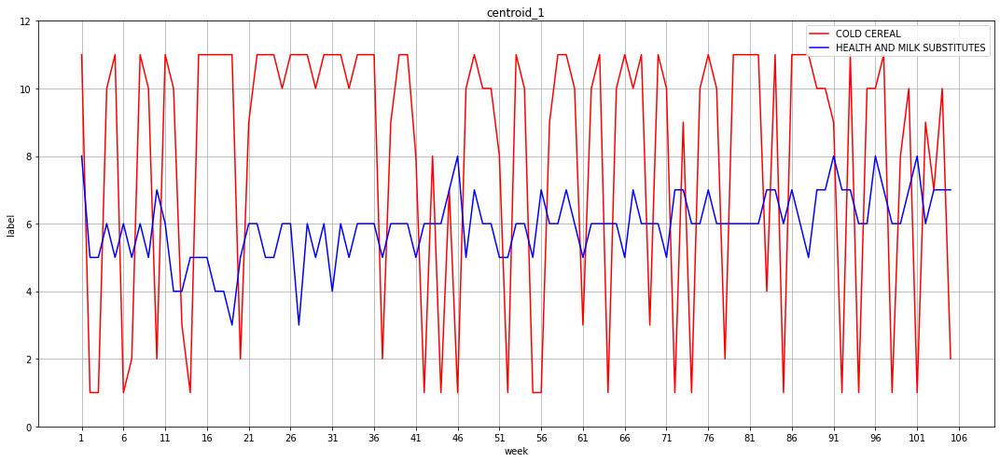

<Figure size 432x288 with 0 Axes>

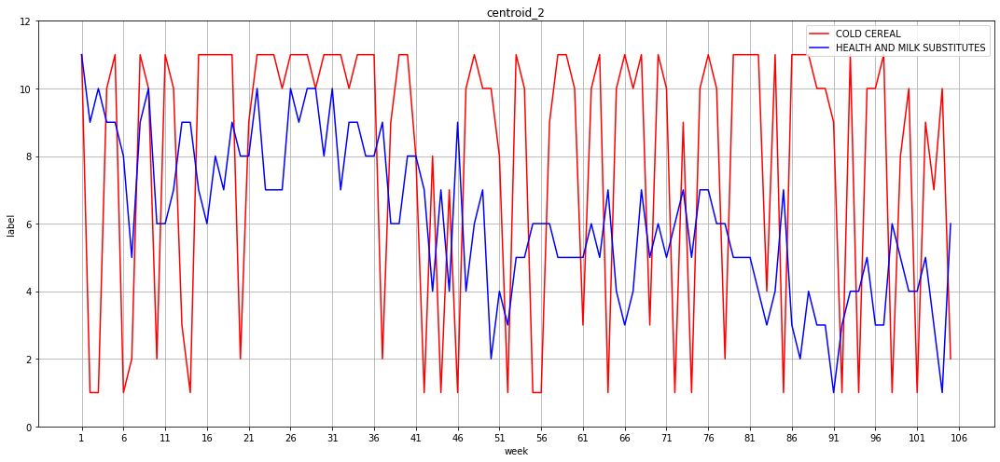

<Figure size 432x288 with 0 Axes>

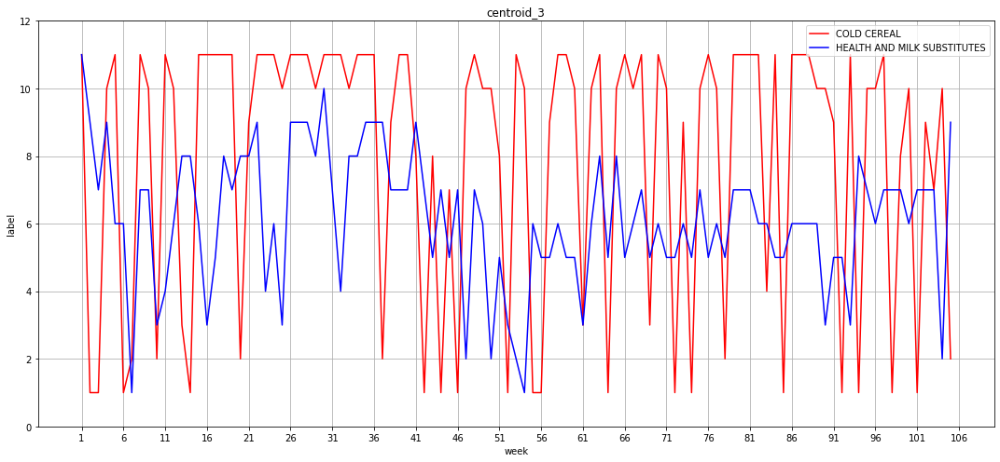

<Figure size 432x288 with 0 Axes>

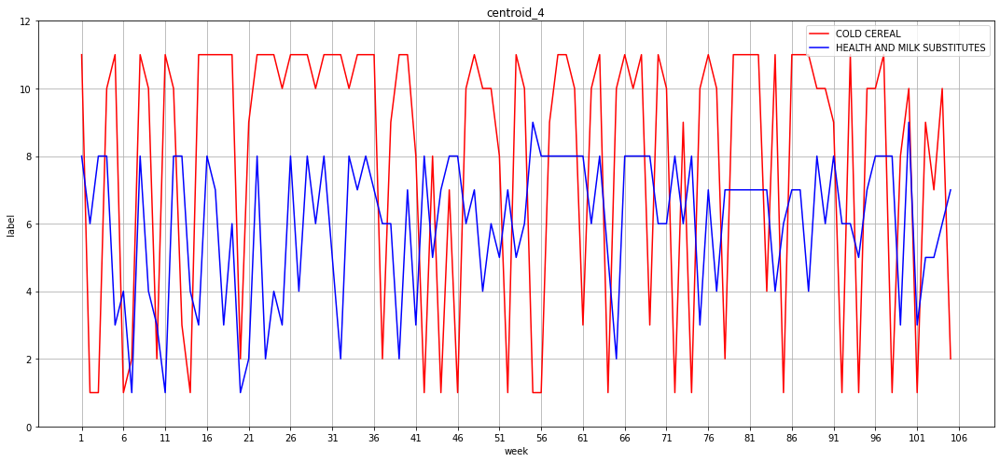

<Figure size 432x288 with 0 Axes>

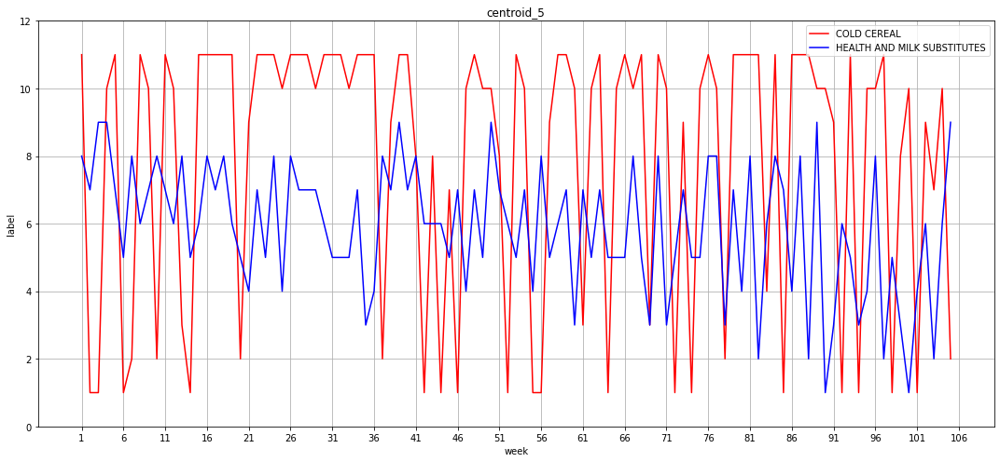

<Figure size 432x288 with 0 Axes>

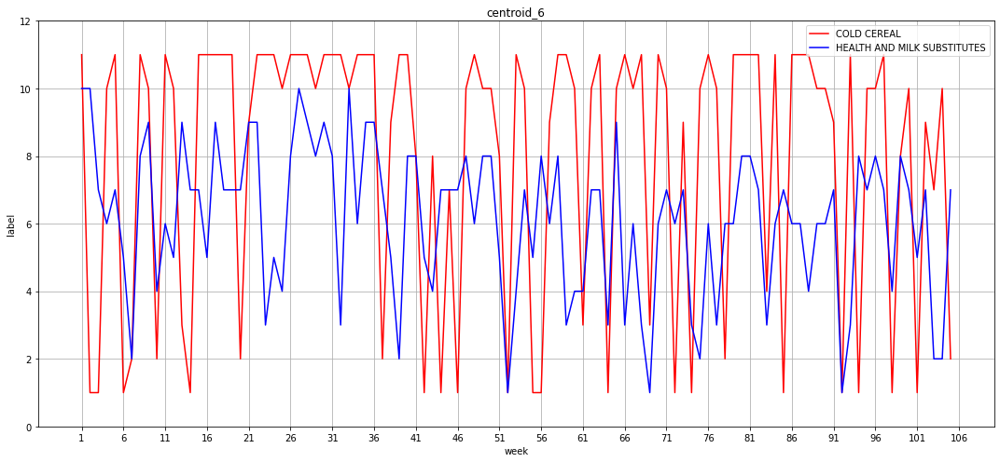

<Figure size 432x288 with 0 Axes>

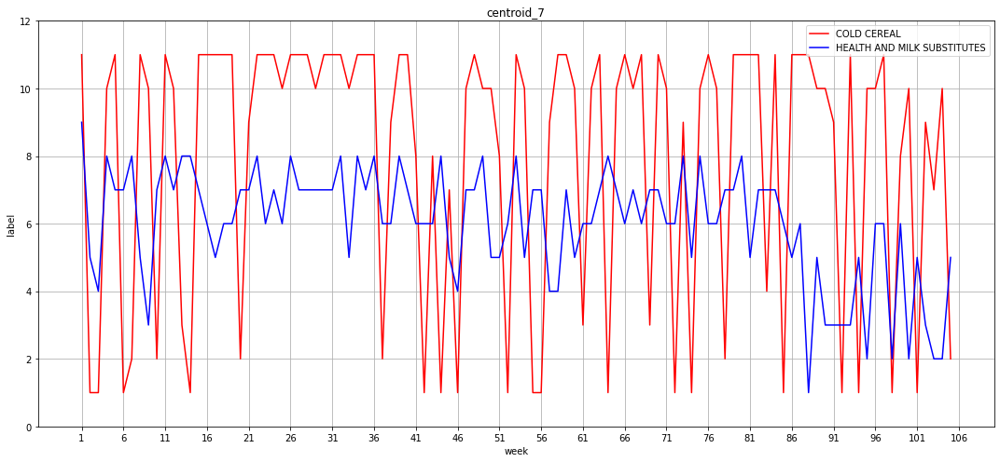

<Figure size 432x288 with 0 Axes>

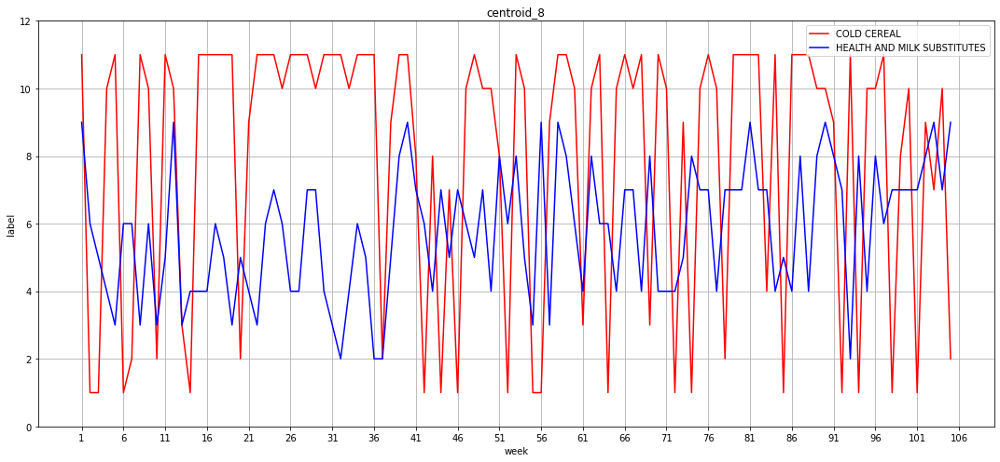

<Figure size 432x288 with 0 Axes>

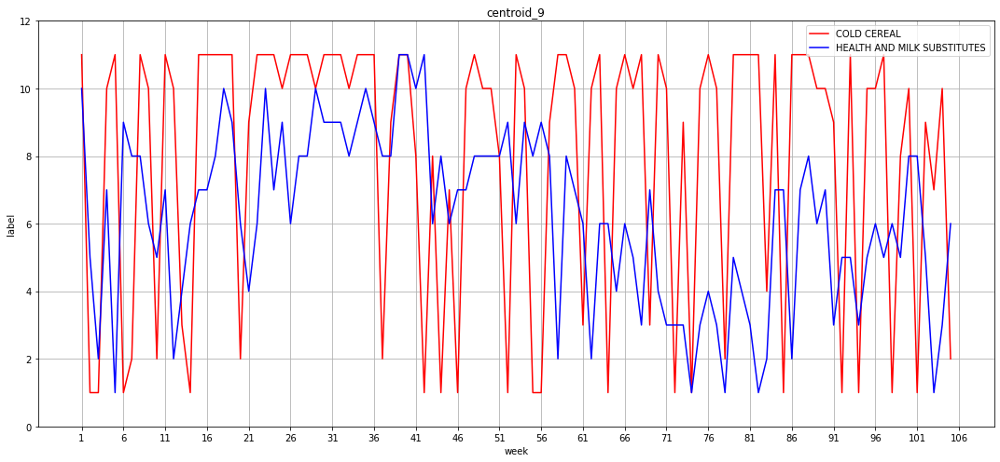

COLD CEREAL
Increase in Profit per week due to discounts = $-7.063825
Items sold per week = 1.2143

HEALTH AND MILK SUBSTITUTES
Increase in Profit per week due to discounts = $-7.080034
Items sold per week = 1.2308


<Figure size 432x288 with 0 Axes>

In [379]:
analysis_4(data2.query("category_id == 1101"), data2.query("category_id == 3605"))

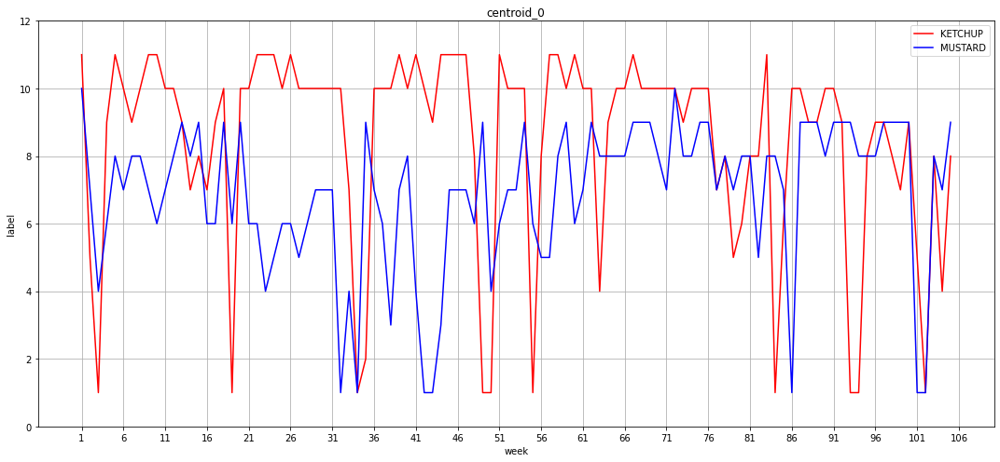

<Figure size 432x288 with 0 Axes>

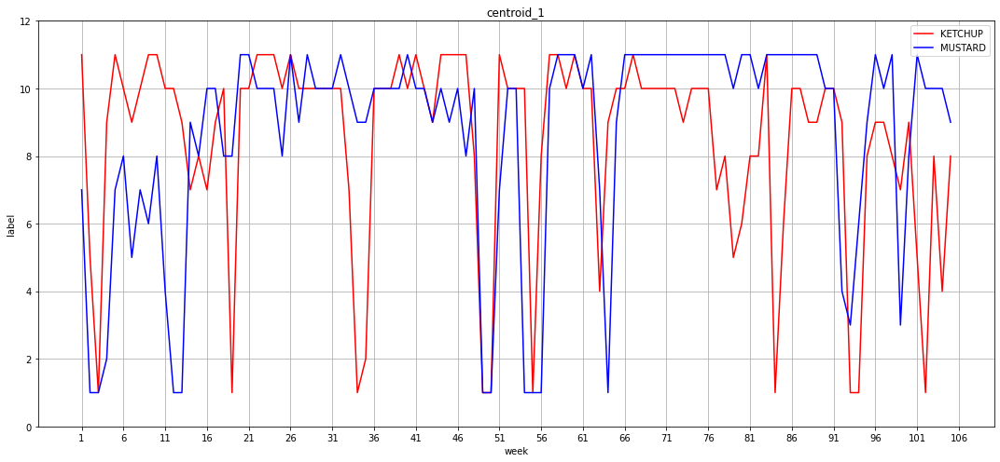

<Figure size 432x288 with 0 Axes>

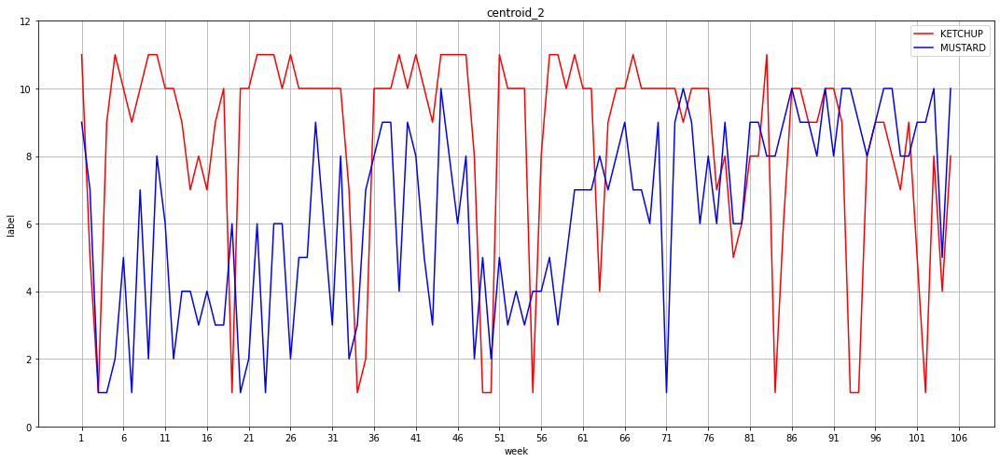

<Figure size 432x288 with 0 Axes>

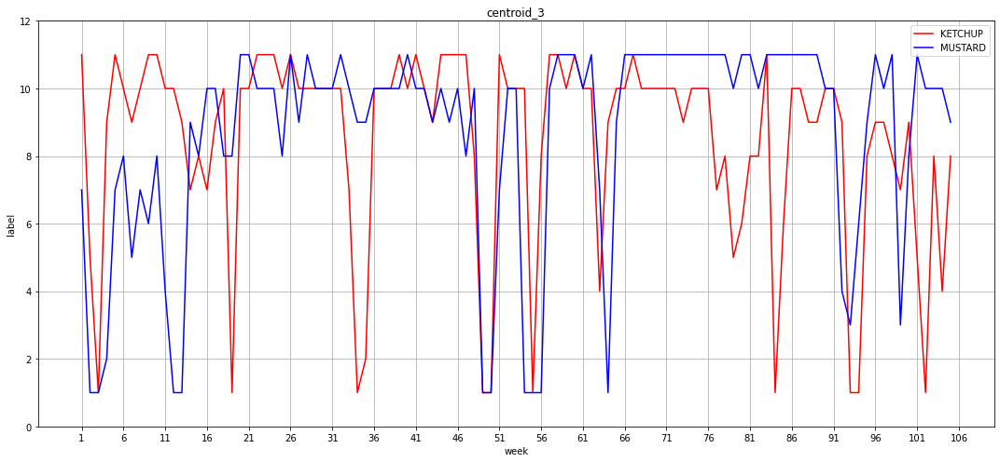

<Figure size 432x288 with 0 Axes>

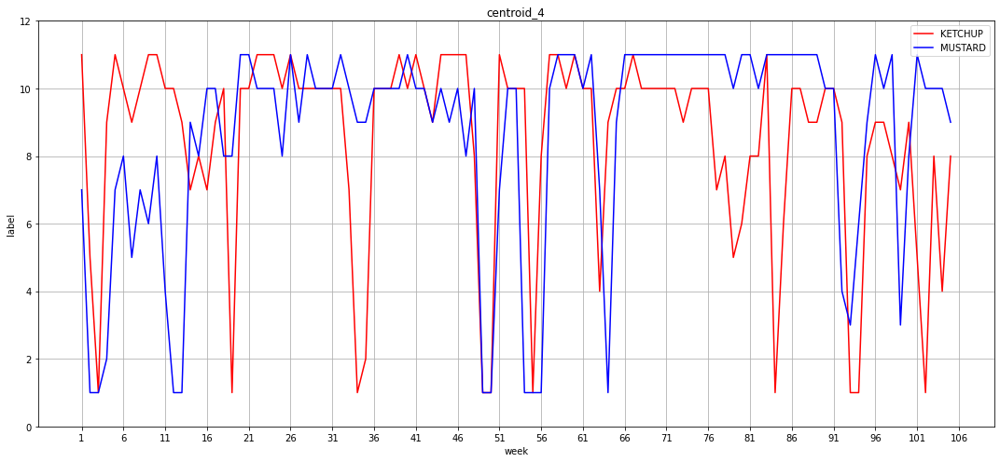

<Figure size 432x288 with 0 Axes>

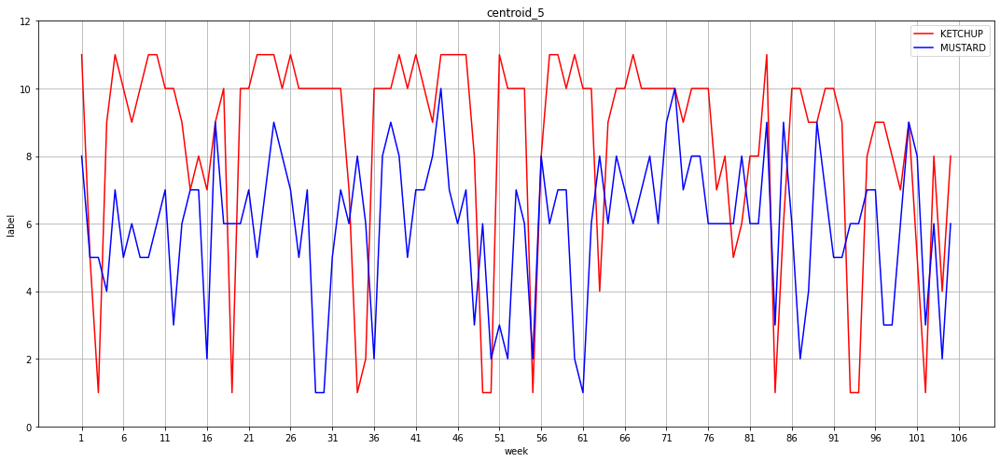

<Figure size 432x288 with 0 Axes>

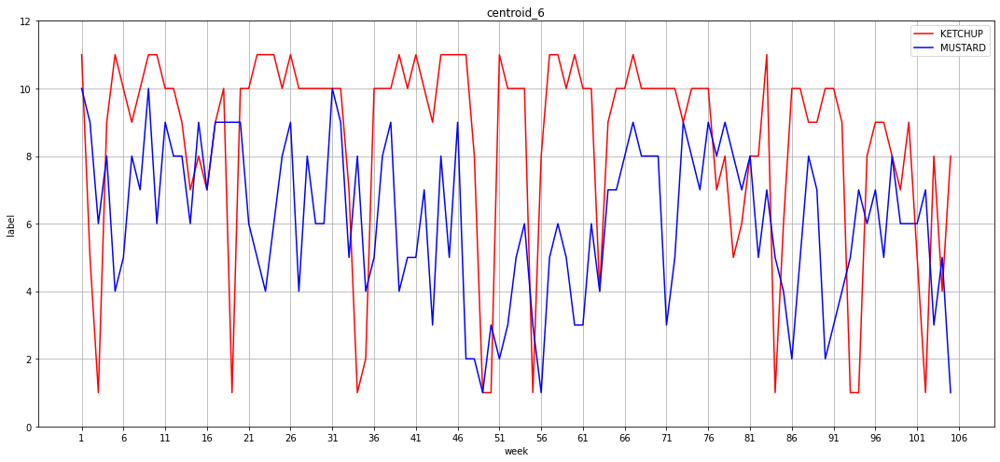

<Figure size 432x288 with 0 Axes>

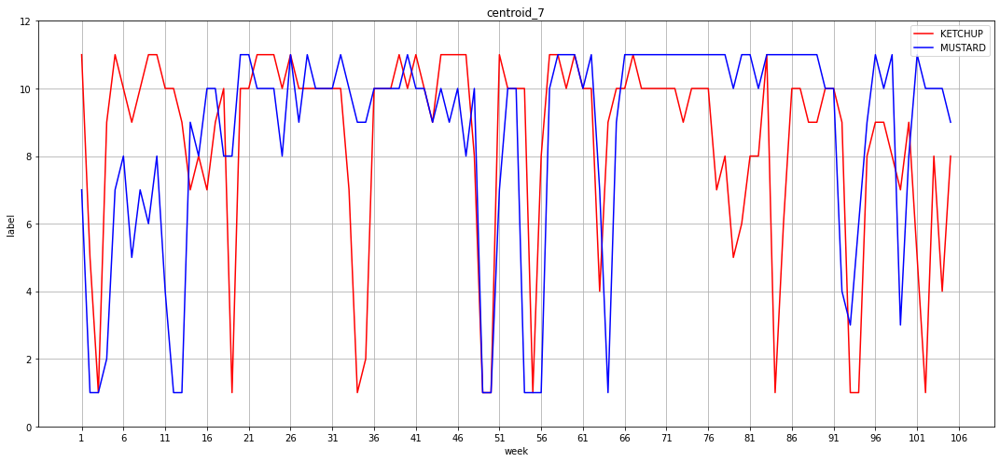

<Figure size 432x288 with 0 Axes>

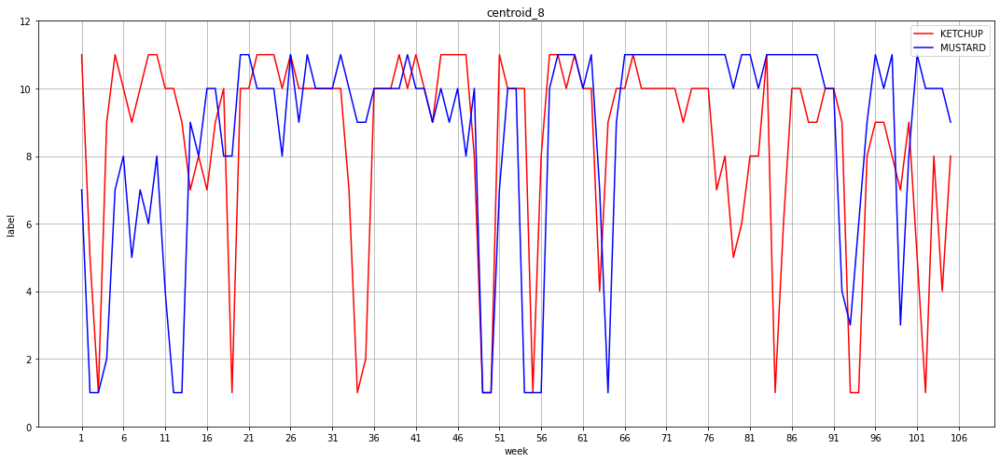

<Figure size 432x288 with 0 Axes>

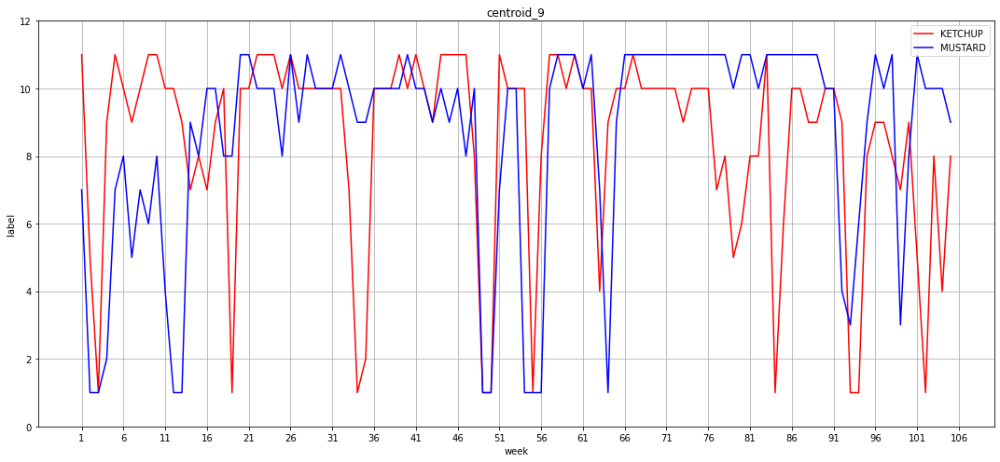

KETCHUP
Increase in Profit per week due to discounts = $4.879418
Items sold per week = 3.2874

MUSTARD
Increase in Profit per week due to discounts = $-2.686589
Items sold per week = 3.7826


<Figure size 432x288 with 0 Axes>

In [339]:
analysis_4(data2.query("category_id == 501"), data2.query("category_id == 505"))

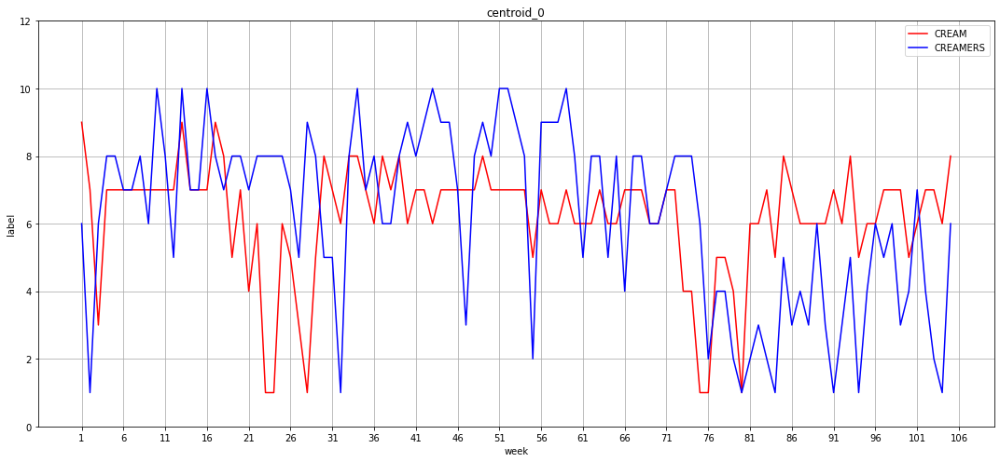

<Figure size 432x288 with 0 Axes>

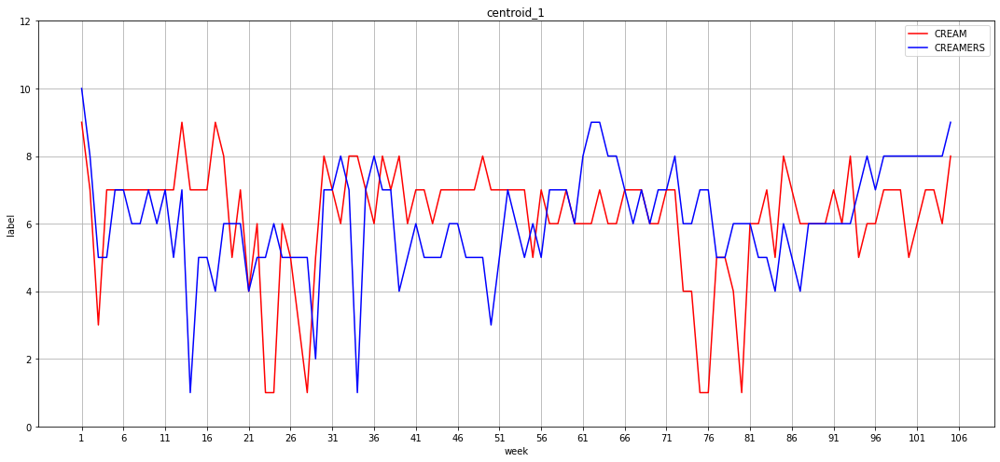

<Figure size 432x288 with 0 Axes>

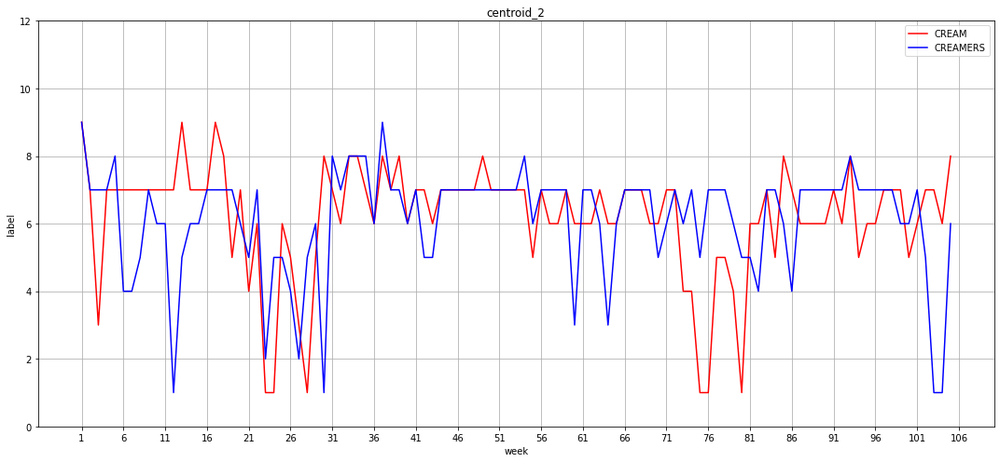

<Figure size 432x288 with 0 Axes>

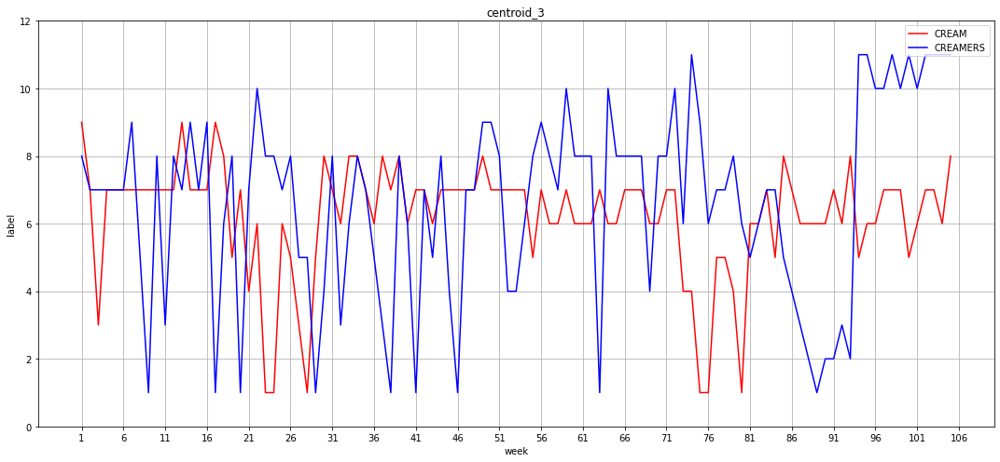

<Figure size 432x288 with 0 Axes>

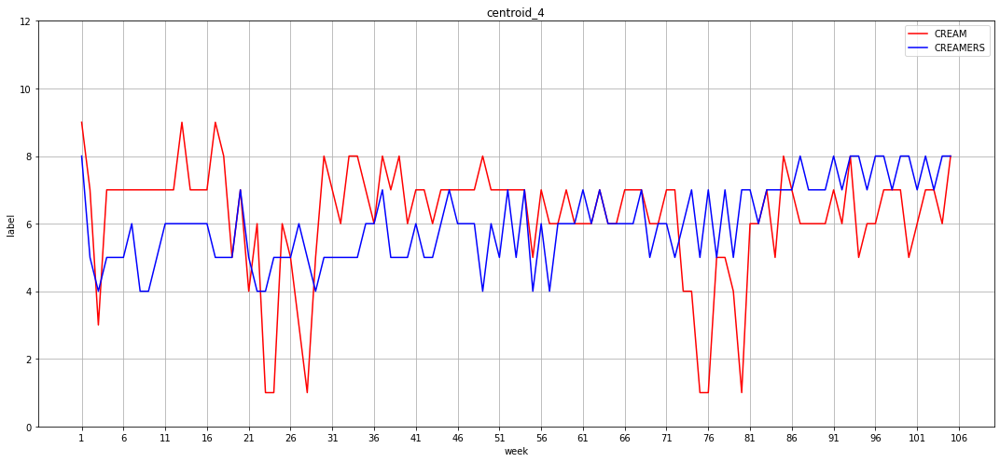

<Figure size 432x288 with 0 Axes>

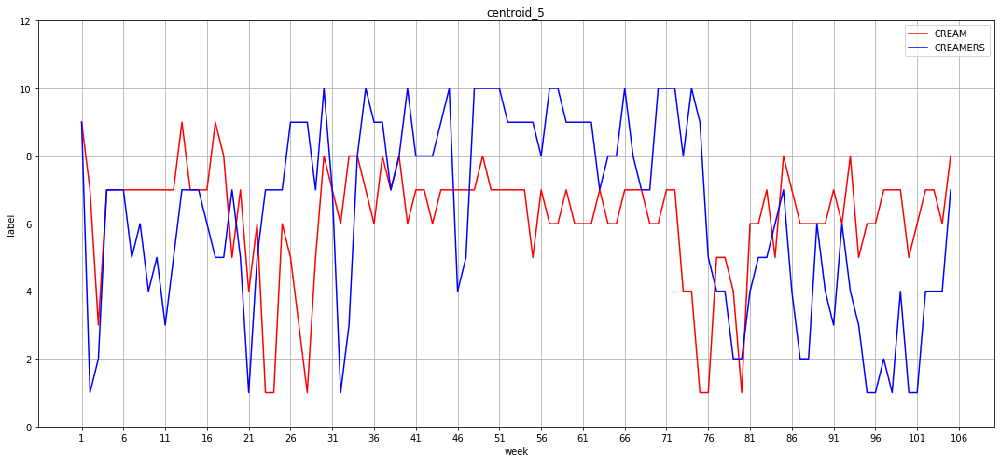

<Figure size 432x288 with 0 Axes>

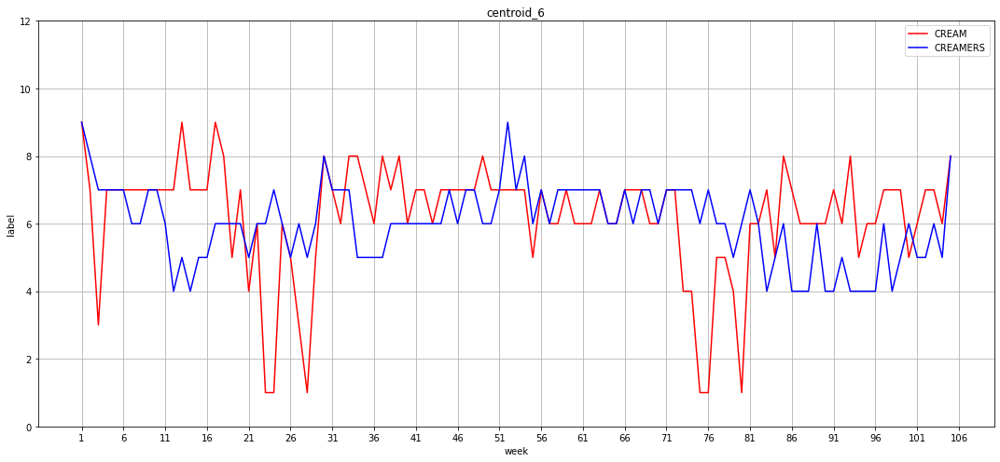

<Figure size 432x288 with 0 Axes>

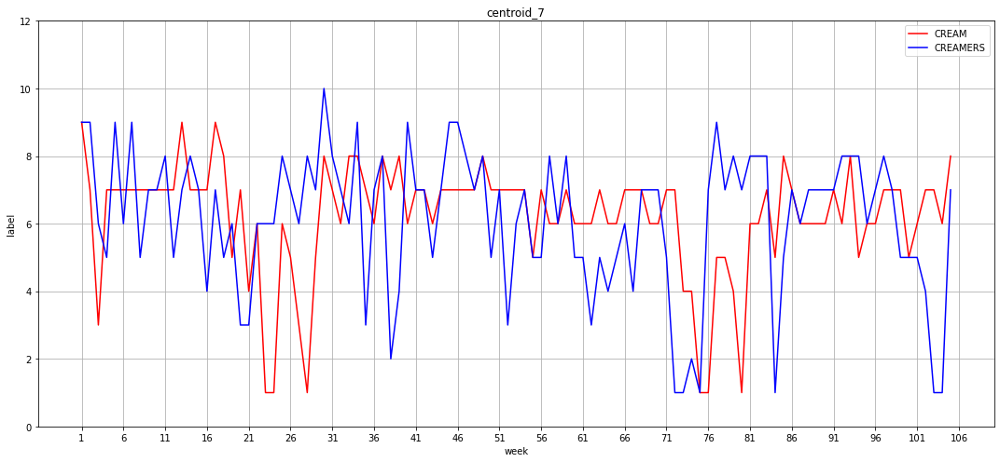

<Figure size 432x288 with 0 Axes>

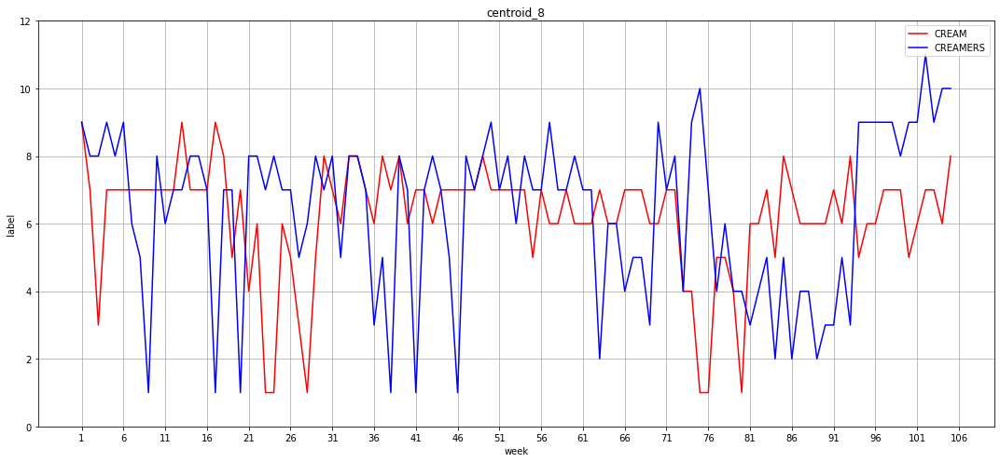

<Figure size 432x288 with 0 Axes>

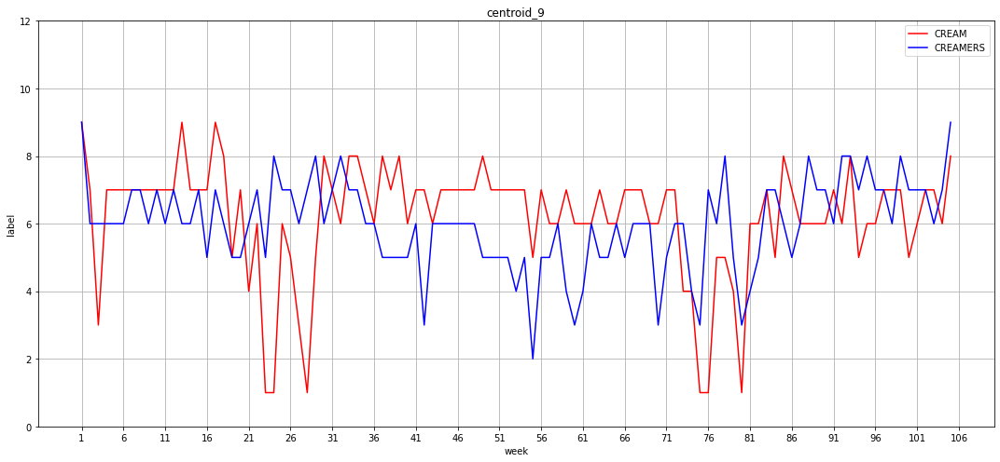

CREAM
Increase in Profit per week due to discounts = $49.195079
Items sold per week = 21.4857

CREAMERS
Increase in Profit per week due to discounts = $142.412603
Items sold per week = 35.1333


<Figure size 432x288 with 0 Axes>

In [320]:
analysis_4(data2.query("category_id == 3615"), data2.query("category_id == 3645"))

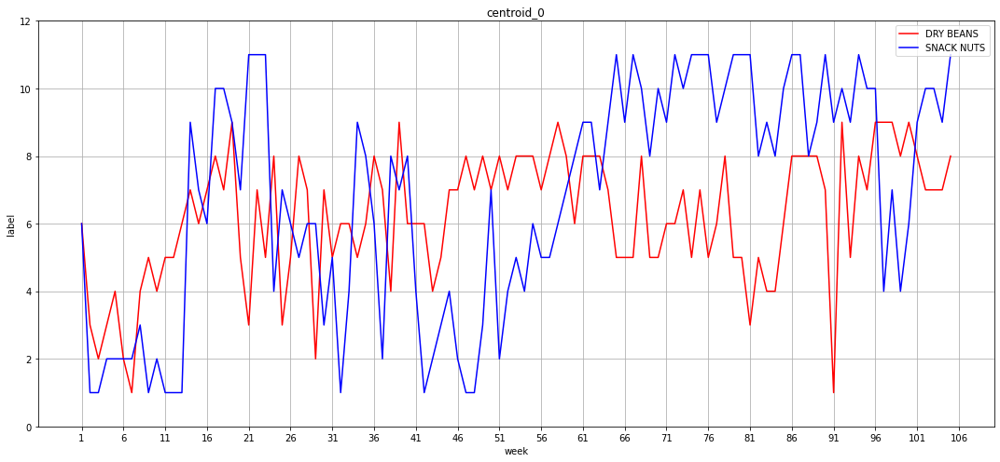

<Figure size 432x288 with 0 Axes>

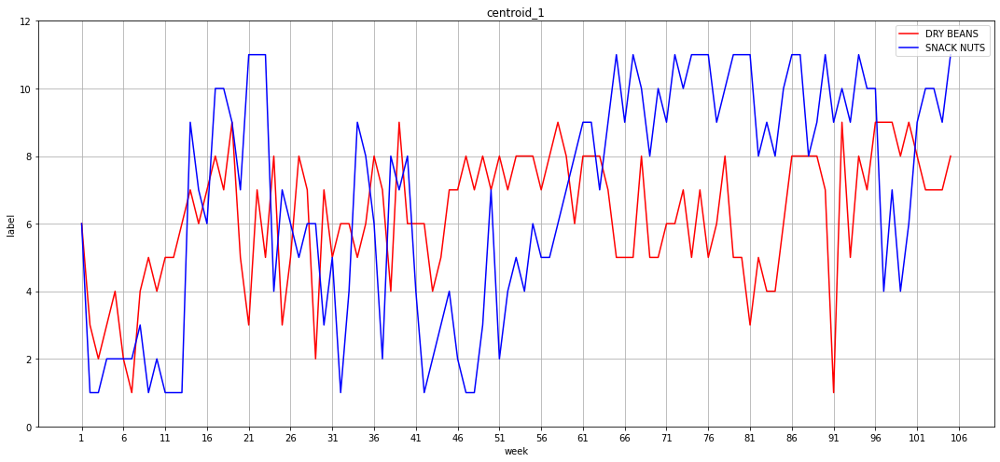

<Figure size 432x288 with 0 Axes>

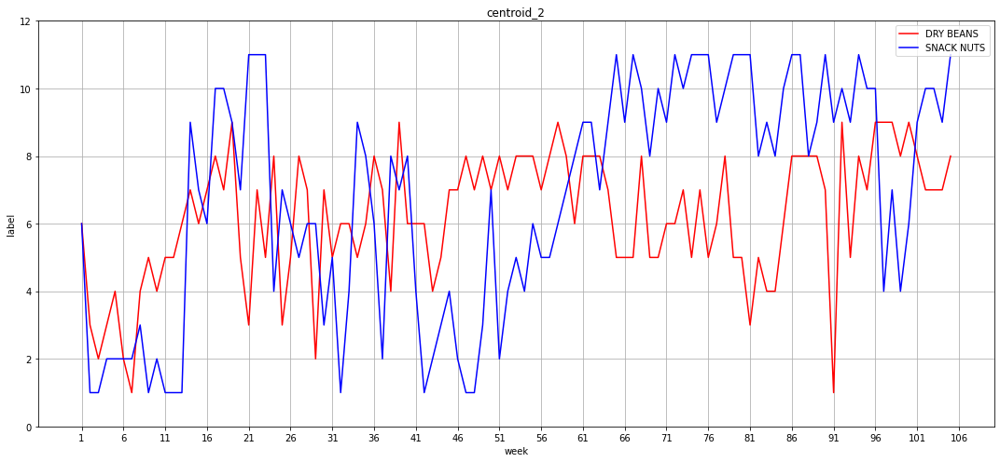

<Figure size 432x288 with 0 Axes>

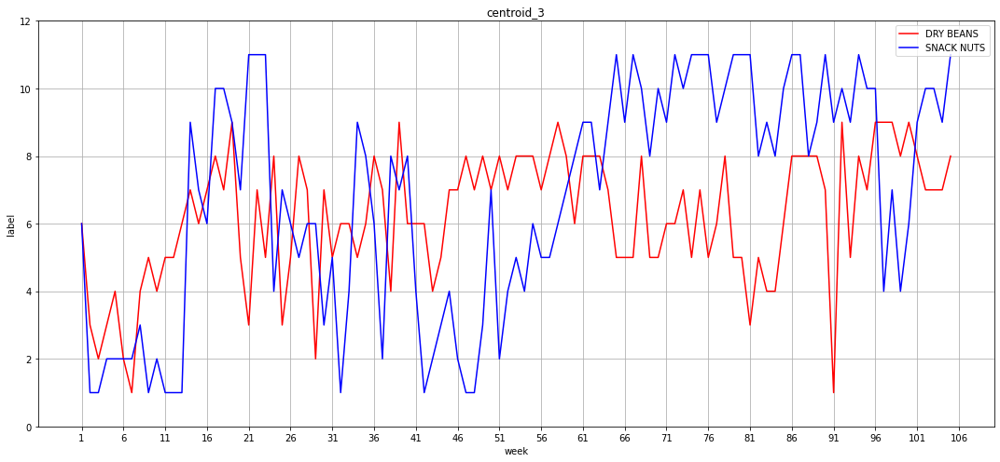

<Figure size 432x288 with 0 Axes>

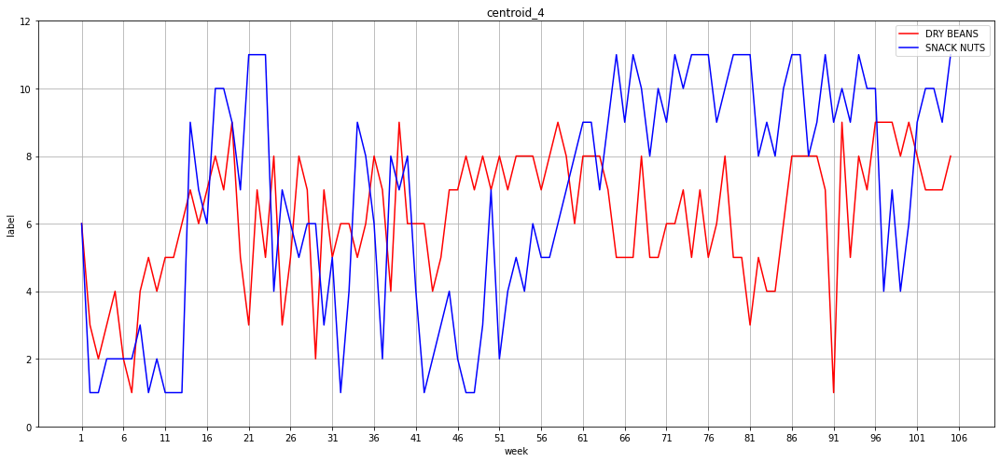

<Figure size 432x288 with 0 Axes>

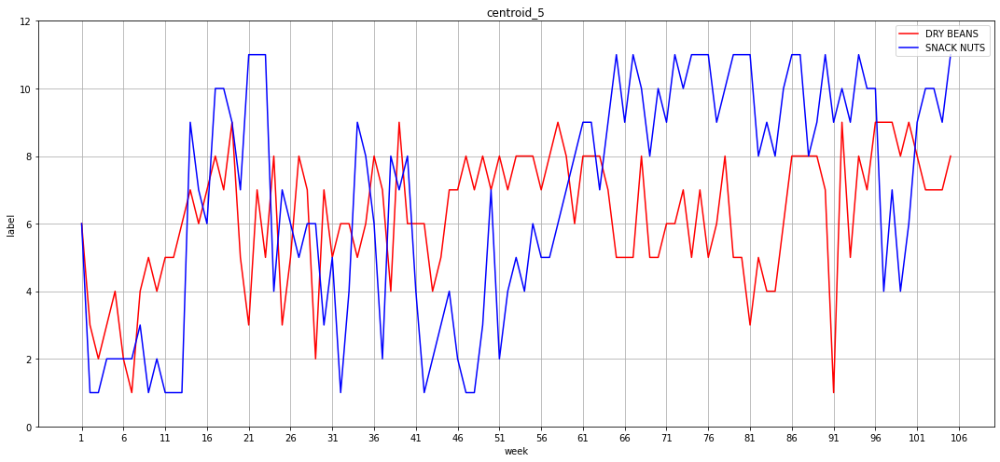

<Figure size 432x288 with 0 Axes>

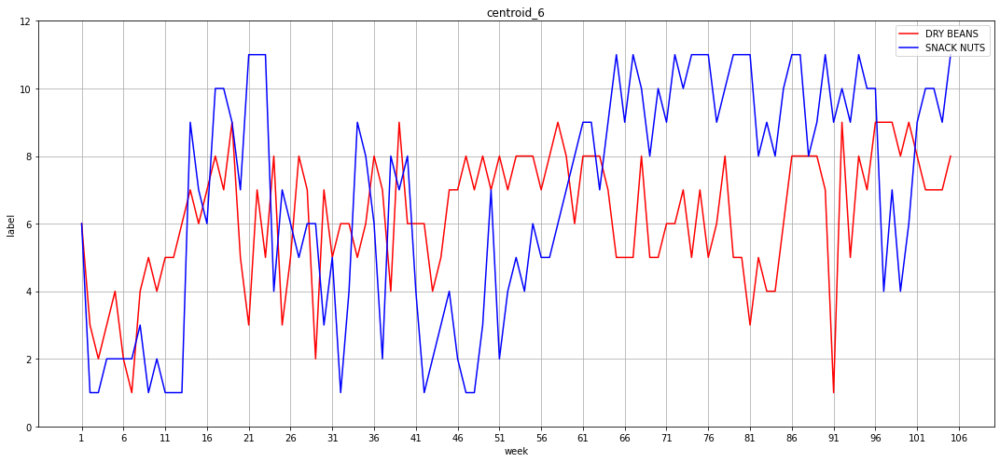

<Figure size 432x288 with 0 Axes>

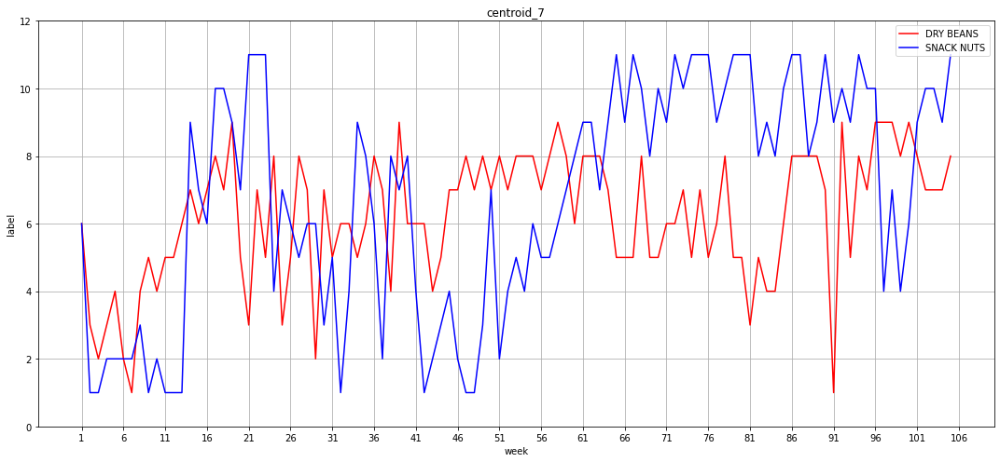

<Figure size 432x288 with 0 Axes>

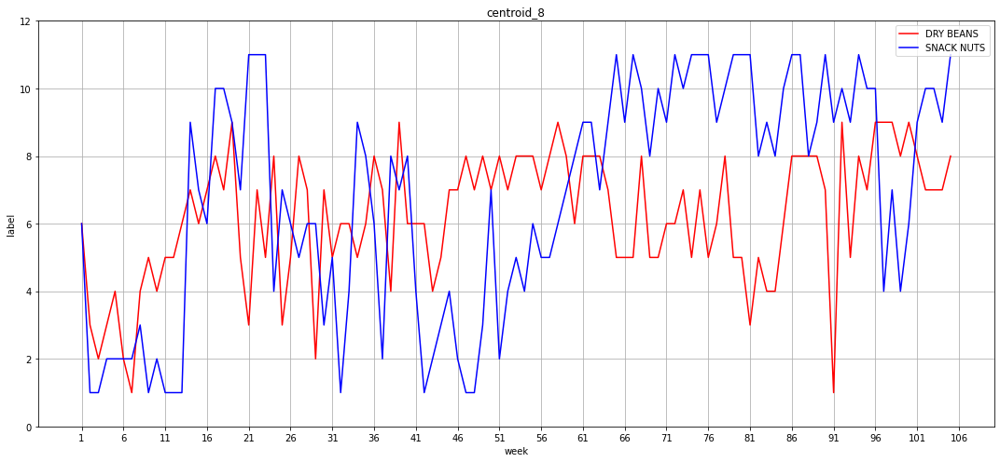

<Figure size 432x288 with 0 Axes>

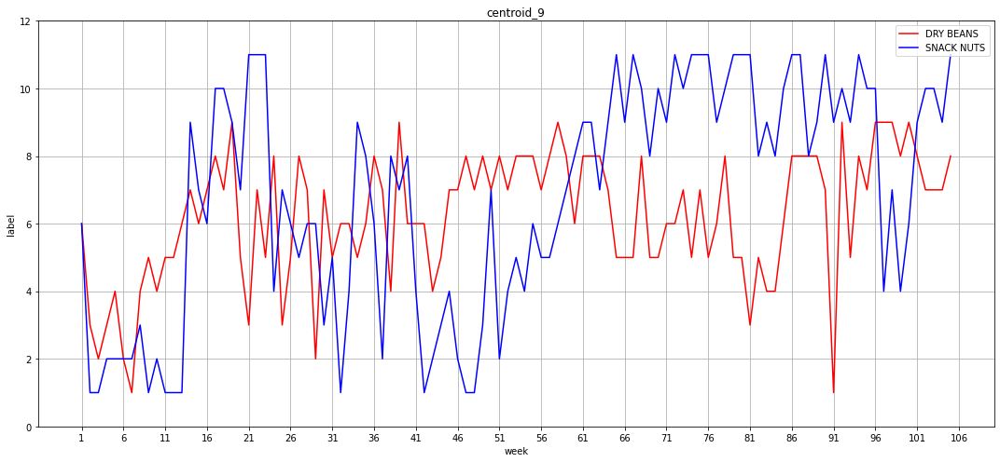

DRY BEANS
Increase in Profit per week due to discounts = $-7.137762
Items sold per week = 2.4302

SNACK NUTS
Increase in Profit per week due to discounts = $-3.223986
Items sold per week = 2.4625


<Figure size 432x288 with 0 Axes>

In [374]:
analysis_4(data2.query("category_id == 1001"), data2.query("category_id == 910"))

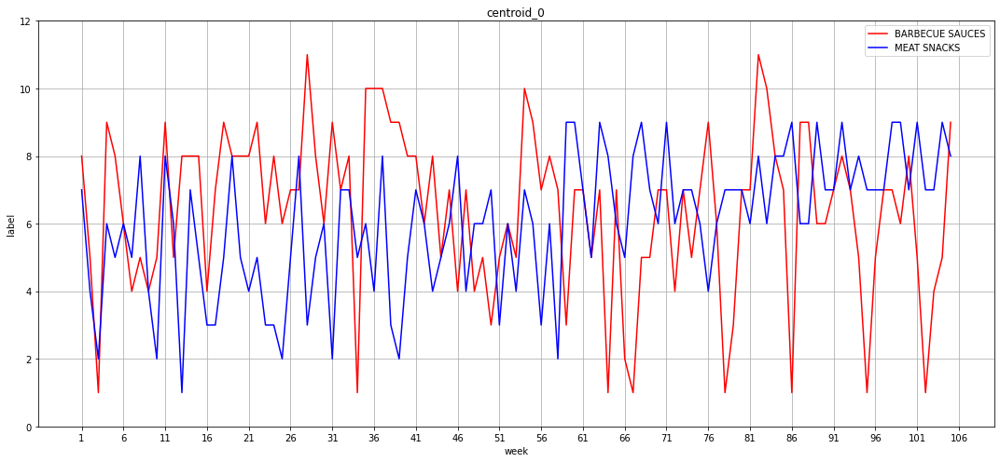

<Figure size 432x288 with 0 Axes>

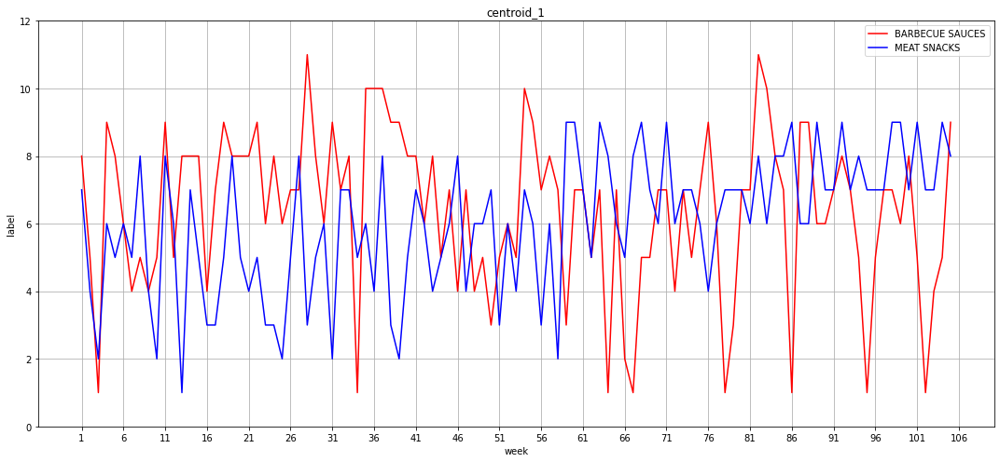

<Figure size 432x288 with 0 Axes>

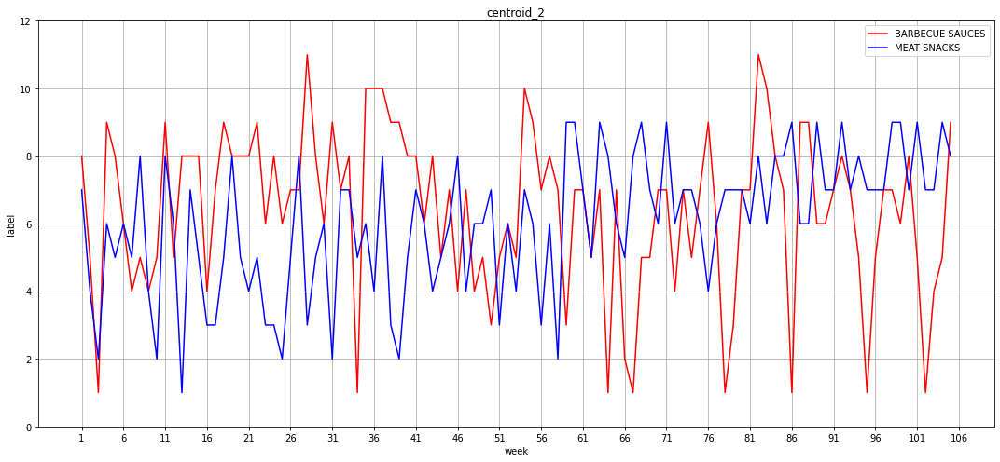

<Figure size 432x288 with 0 Axes>

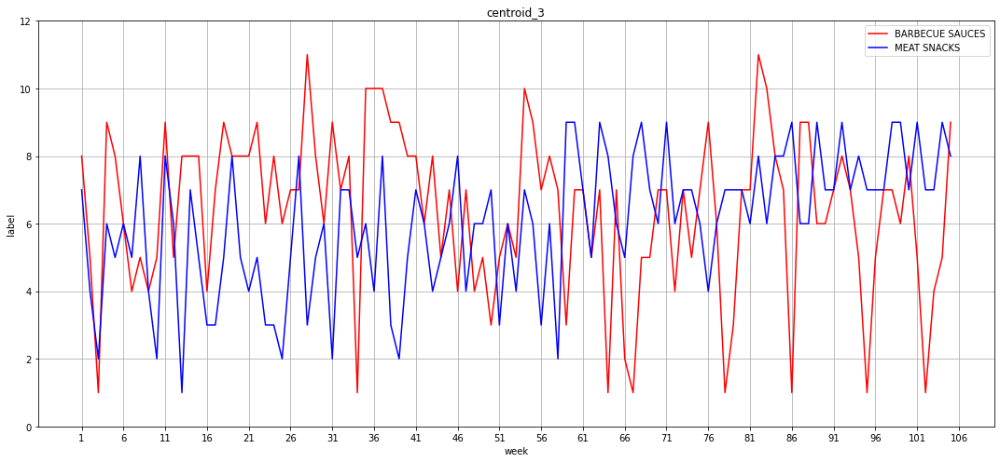

<Figure size 432x288 with 0 Axes>

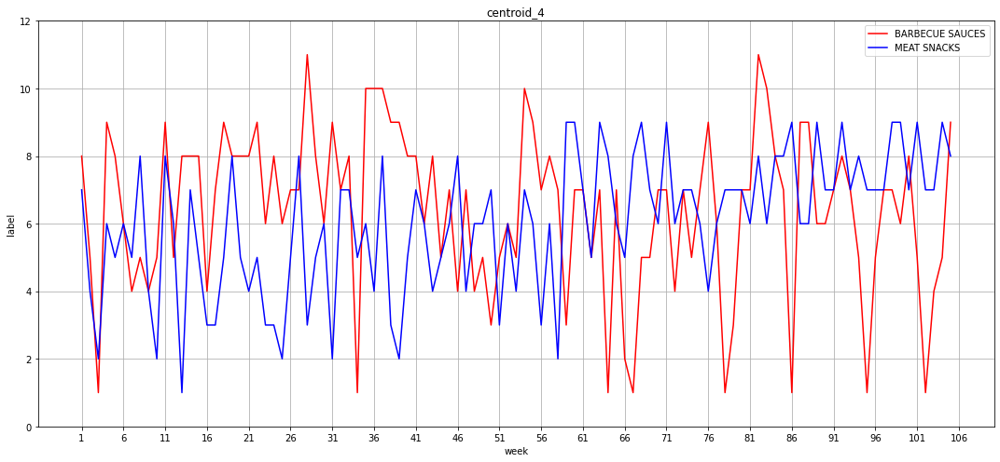

<Figure size 432x288 with 0 Axes>

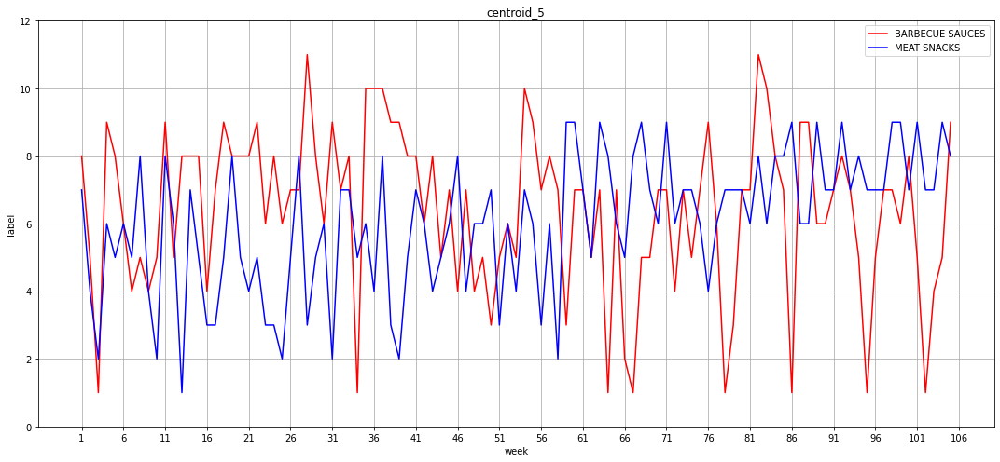

<Figure size 432x288 with 0 Axes>

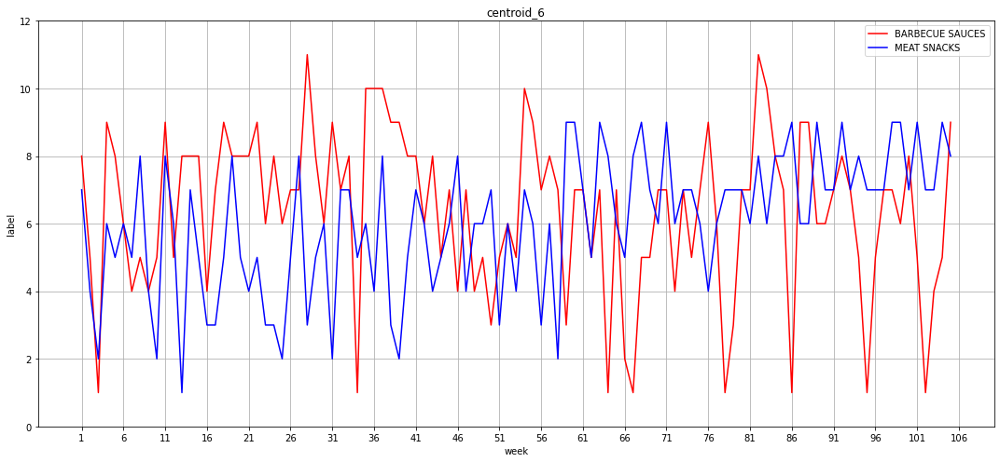

<Figure size 432x288 with 0 Axes>

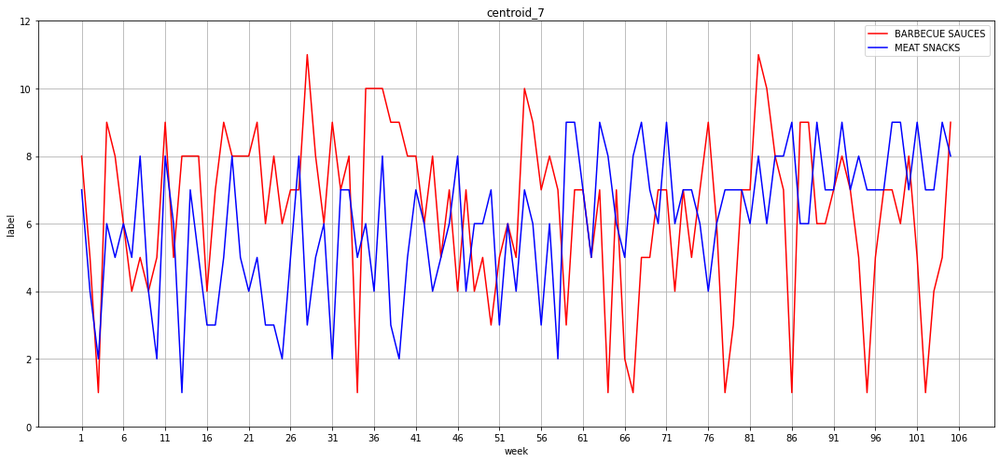

<Figure size 432x288 with 0 Axes>

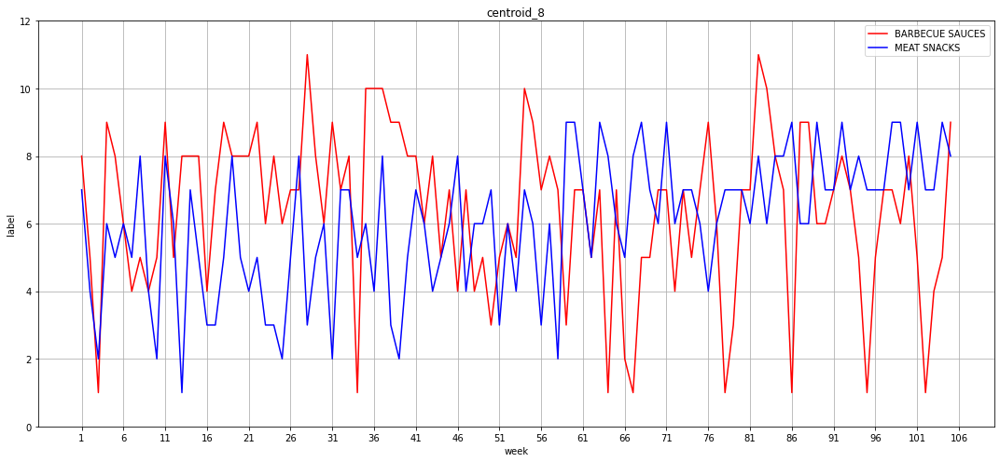

<Figure size 432x288 with 0 Axes>

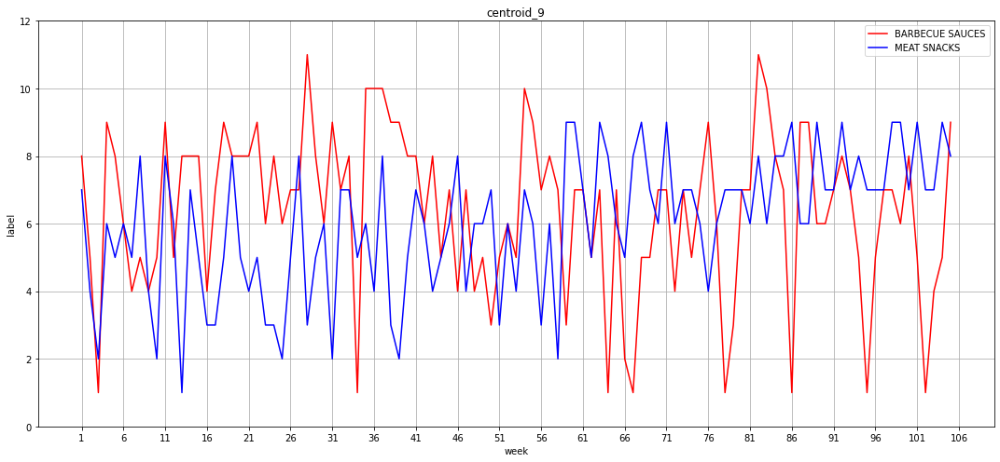

BARBECUE SAUCES
Increase in Profit per week due to discounts = $-3.340444
Items sold per week = 4.2

MEAT SNACKS
Increase in Profit per week due to discounts = $-1.389337
Items sold per week = 1.7547


<Figure size 432x288 with 0 Axes>

In [377]:
analysis_4(data2.query("category_id == 520"), data2.query("category_id == 915"))

# Other Analysis

**1. Supposed you take a particular cereal. The average price and average quality have been computed. Supposed I got 95% one week and the next I bought twice as much since the prices were lower.**

In [ ]:
data['net_price']

In [ ]:
# Hot Cerial id is 


df.groupby('category_id').average_net_price.agg(['count'])

**2. What are the typical models used in retail**

RFM (Recency, Frequency and Monetary Value) 

Shopper: shopper is a hierarchical latent variable model of market baskets for which the generative process comes from an assumed model of consumer behavior. 

**3. Take a look at customers, each customer has a particular product that they bought, that's why there is a customer ID, so for every customer you have a set of objects. Objects are those vectors…676. Ask the question.. How close are the customers to each other? Then we can cluster customers. Then we can take a look at the average customer and see what is the average behavior. You essentially want to say that through cluster analysis we can tell you the behavior of customers. Ideally you want to know what is the impact of discounts overall.**